In [1]:
#SEconde version of notebookincorporating new modules and FE techniques
#url: https://www.kaggle.com/mgmarques/houses-prices-complete-solution#House-Prices---Kaggle-Copetitions


### LINK: PARA REVISAR TODAS LAS TECNICAS DE DATA PROCESSING: https://towardsdatascience.com/feature-engineering-for-machine-learning-3a5e293a5114 
### REFERENCE KERNELS: https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard
##reference kernl updated: https://www.kaggle.com/amiiiney/price-prediction-top-15-regularization-stacking/comments#2--Data-cleaning

In [2]:
##Import libraries 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime, timedelta

# import all libraries and dependencies for data visualization
pd.options.display.float_format='{:.4f}'.format
plt.rcParams['figure.figsize'] = [8,8]
pd.set_option('display.max_columns', 350)
pd.set_option('display.max_colwidth', -1) 
pd.set_option("display.max_rows", 500)
sns.set(style='darkgrid')
import matplotlib.ticker as ticker
import matplotlib.ticker as plticker


# import all libraries and dependencies for machine learning
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.base import TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler 
from sklearn.preprocessing import StandardScaler


from sklearn.compose import make_column_transformer


import statsmodels.api as sm
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures

from scipy import stats
from scipy.stats import norm, kurtosis, skew

# Import specific libraries
import statsmodels.api as sm
from statsmodels.stats import diagnostic as diag
from statsmodels.stats.outliers_influence import variance_inflation_factor



# Stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

from scipy import stats
from scipy.stats import skew, norm, probplot, boxcox
from scipy.special import boxcox1p
from patsy import dmatrices

pd.set_option('expand_frame_repr', False)

**1. Reading and Understanding the Data**

In [3]:
# READ THE WHOLE DATASET:
# We load and read the whole dataset (train + test) because we need to clean and preprocess all of it!!!!
#All the procedures must be applied to the entire dataset before split it!

#Step 1: Load train and test sets

train = pd.read_csv("train.csv")
test = pd.read_csv("test_house_mae.csv")
test.to_csv("test_file.csv")

#Save the 'Id' column
train_ID = train['Id']
test_ID = test['Id']

%store test_ID

#Drop ID from both datasets
train.drop("Id", axis = 1, inplace = True)
test.drop("Id", axis = 1, inplace = True)

# Shape of the datasets
train.shape, test.shape, train.shape[0], test.shape[0]

#Separar y convertir el target en DataFrame
y_train = train["SalePrice"].to_frame()



#Step 2: Concatenate both datasets into one

df = pd.concat((train,test), sort = False).reset_index(drop = True)

#drop target and id columns
df.drop(columns = ["SalePrice"], axis = 1, inplace = True)


Stored 'test_ID' (Series)


In [4]:
test_ID

0       1461
1       1462
2       1463
3       1464
4       1465
        ... 
1454    2915
1455    2916
1456    2917
1457    2918
1458    2919
Name: Id, Length: 1459, dtype: int64

In [5]:
len(train.SalePrice.unique()), train.SalePrice.shape[0]

(663, 1460)

In [6]:
#Storing data for using them in another notebook
%store y_train 
%store train 
%store test 


Stored 'y_train' (DataFrame)
Stored 'train' (DataFrame)
Stored 'test' (DataFrame)


In [7]:
#Look at dataset head
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0000,Gd,TA,PConc,Gd,TA,No,GLQ,706.0000,Unf,0.0000,150.0000,856.0000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0000,0.0000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0000,RFn,2.0000,548.0000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
1,20,RL,80.0000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0000,Unf,0.0000,284.0000,1262.0000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0000,1.0000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0000,RFn,2.0000,460.0000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
2,60,RL,68.0000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0000,Unf,0.0000,434.0000,920.0000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0000,0.0000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0000,RFn,2.0000,608.0000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal
3,70,RL,60.0000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0000,Unf,0.0000,540.0000,756.0000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0000,0.0000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0000,Unf,3.0000,642.0000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml
4,60,RL,84.0000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0000,Unf,0.0000,490.0000,1145.0000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0000,0.0000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0000,RFn,3.0000,836.0000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal


In [8]:
# Information of the dataset
df.shape

(2919, 79)

In [9]:
#Modulo: General summary of dataset
def summary_2(df, target):
    num = df.select_dtypes(exclude= object).columns
    cols = ["Dtype","Uniques", "Nulls","% Nulls", "Skew", "Kurtosis", "Correlation"]
    ind = df.columns
    dict = {}
    dict["Dtype"] = [df[i].dtype for i in ind]
    dict["Uniques"] = [df[i].nunique() for i in ind]
    dict["Nulls"] =[df[i].isnull().sum().sum() for i in ind]
    dict["% Nulls"] = np.round([df[i].isnull().sum().sum()/len(df[i]) for i in ind], decimals = 2)
    dict["Skew"] =  np.round(df.skew(), decimals = 3) 
    dict["Kurtosis"] = np.round(df.kurt(), decimals = 3)
    dict["Correlation"] = np.round(df.corr()[target], decimals = 3)
    summary = pd.DataFrame(dict, columns = cols, index = ind)
    return summary

sum = summary_2(train, "SalePrice").sort_values(by = "Dtype").sort_values(by = "Correlation", ascending = False)
sum

,Dtype,Uniques,Nulls,% Nulls,Skew,Kurtosis,Correlation
SalePrice,int64,663,0,0.0000,1.8830,6.5360,1.0000
OverallQual,int64,10,0,0.0000,0.2170,0.0960,0.7910
GrLivArea,int64,861,0,0.0000,1.3670,4.8950,0.7090
GarageCars,int64,5,0,0.0000,-0.3430,0.2210,0.6400
GarageArea,int64,441,0,0.0000,0.1800,0.9170,0.6230
TotalBsmtSF,int64,721,0,0.0000,1.5240,13.2500,0.6140
1stFlrSF,int64,753,0,0.0000,1.3770,5.7460,0.6060
FullBath,int64,4,0,0.0000,0.0370,-0.8570,0.5610
TotRmsAbvGrd,int64,12,0,0.0000,0.6760,0.8810,0.5340
YearBuilt,int64,112,0,0.0000,-0.6130,-0.4400,0.5230


In [10]:
##Features with the highest correlations (15)
sum.sort_values(by = "Correlation", ascending = False)[:15]

,Dtype,Uniques,Nulls,% Nulls,Skew,Kurtosis,Correlation
SalePrice,int64,663,0,0.0000,1.8830,6.5360,1.0000
OverallQual,int64,10,0,0.0000,0.2170,0.0960,0.7910
GrLivArea,int64,861,0,0.0000,1.3670,4.8950,0.7090
GarageCars,int64,5,0,0.0000,-0.3430,0.2210,0.6400
GarageArea,int64,441,0,0.0000,0.1800,0.9170,0.6230
TotalBsmtSF,int64,721,0,0.0000,1.5240,13.2500,0.6140
1stFlrSF,int64,753,0,0.0000,1.3770,5.7460,0.6060
FullBath,int64,4,0,0.0000,0.0370,-0.8570,0.5610
TotRmsAbvGrd,int64,12,0,0.0000,0.6760,0.8810,0.5340
YearBuilt,int64,112,0,0.0000,-0.6130,-0.4400,0.5230


In [11]:
####GENERATE GROUPS OF FEATURES ACCORDING WITH THEIR SKEW/KURT/CORR VALUES

In [12]:
### Features high skewed right, heavy-tailed distribution, and with high correlation: apply transformations and manage outliers
sum_1 = sum[(abs(sum["Skew"]) > 1) & (abs(sum["Kurtosis"]) > 3) & (abs(sum["Correlation"]) > 0.5)][["Skew", "Kurtosis", "Correlation"]]
print("Features high skewed right, heavy-tailed distribution, and with high correlation")
sum_1

Features high skewed right, heavy-tailed distribution, and with high correlation


,Skew,Kurtosis,Correlation
SalePrice,1.8830,6.5360,1.0000
GrLivArea,1.3670,4.8950,0.7090
TotalBsmtSF,1.5240,13.2500,0.6140
1stFlrSF,1.3770,5.7460,0.6060


In [13]:
### Features skewed, heavy-tailed distribution, and with good correlation: apply transformations and manage outliers

sum_2 = sum[(abs(sum["Skew"] > 1)) & (abs(sum["Kurtosis"]) > 1) & (abs(sum["Correlation"]) > 0.05)][["Skew", "Kurtosis", "Correlation"]].drop(sum_1.index)
print("Features skewed, heavy-tailed distribution, and with high correlation")
sum_2

Features skewed, heavy-tailed distribution, and with high correlation


,Skew,Kurtosis,Correlation
MasVnrArea,2.6690,10.0820,0.4770
BsmtFinSF1,1.6860,11.1180,0.3860
LotFrontage,2.1640,17.4530,0.3520
WoodDeckSF,1.5410,2.9930,0.3240
OpenPorchSF,2.3640,8.4900,0.3160
LotArea,12.2080,203.2430,0.2640
ScreenPorch,4.1220,18.4390,0.1110
PoolArea,14.8280,223.2680,0.0920
MSSubClass,1.4080,1.5800,-0.0840
EnclosedPorch,3.0900,10.4310,-0.1290


In [14]:
##Features high skewed, heavy-tailed distribution, and with low correlation: Maybe we can drop these features, or just use they with other to create a new more important features:

sum_3 = sum[(abs(sum["Skew"] > 1)) & (abs(sum["Kurtosis"]) > 1) & (abs(sum["Correlation"]) > 0.01)][["Skew", "Kurtosis", "Correlation"]].drop((sum_1 + sum_2).index)
print("Features skewed, heavy-tailed distribution, and with high correlation")
sum_3


Features skewed, heavy-tailed distribution, and with high correlation


,Skew,Kurtosis,Correlation
3SsnPorch,10.3040,123.6620,0.0450
BsmtFinSF2,4.2550,20.1130,-0.0110
BsmtHalfBath,4.1030,16.3970,-0.0170
MiscVal,24.4770,701.0030,-0.0210
LowQualFinSF,9.0110,83.2350,-0.0260


In [15]:
##Chequear como estan distribuidos los features con referencia al target y detectar posibles outliers (mirar primero los con mayor correlacion)

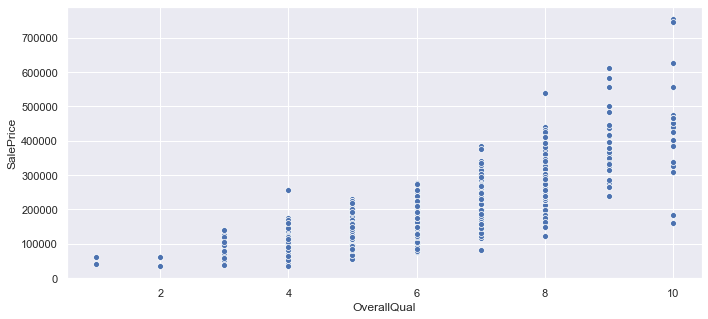

In [16]:
##OveralQuall
fig = plt.figure(figsize=(25,5))
ax = fig.add_subplot(121)
sns.scatterplot(x =train["OverallQual"], y = train.SalePrice, ax = ax)

In [17]:
##Primero: detectar puntos de posibles outliers. Aislarlos y ver qué tienen en común:
train[(train["OverallQual"] == 10) & (train["SalePrice"] < 200000)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
523,60,RL,130.0000,40094,Pave,NaN,IR1,Bnk,AllPub,Inside,Gtl,Edwards,PosN,PosN,1Fam,2Story,10,5,2007,2008,Hip,CompShg,CemntBd,CmentBd,Stone,762.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,2260,Unf,0,878,3138,GasA,Ex,Y,SBrkr,3138,1538,0,4676,1,0,3,1,3,1,Ex,11,Typ,1,Gd,BuiltIn,2007.0000,Fin,3,884,TA,TA,Y,208,406,0,0,0,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
1298,60,RL,313.0000,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0000,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


In [18]:
#Ambos puntos tienen bajo precio a pesar de la overalqual de 10

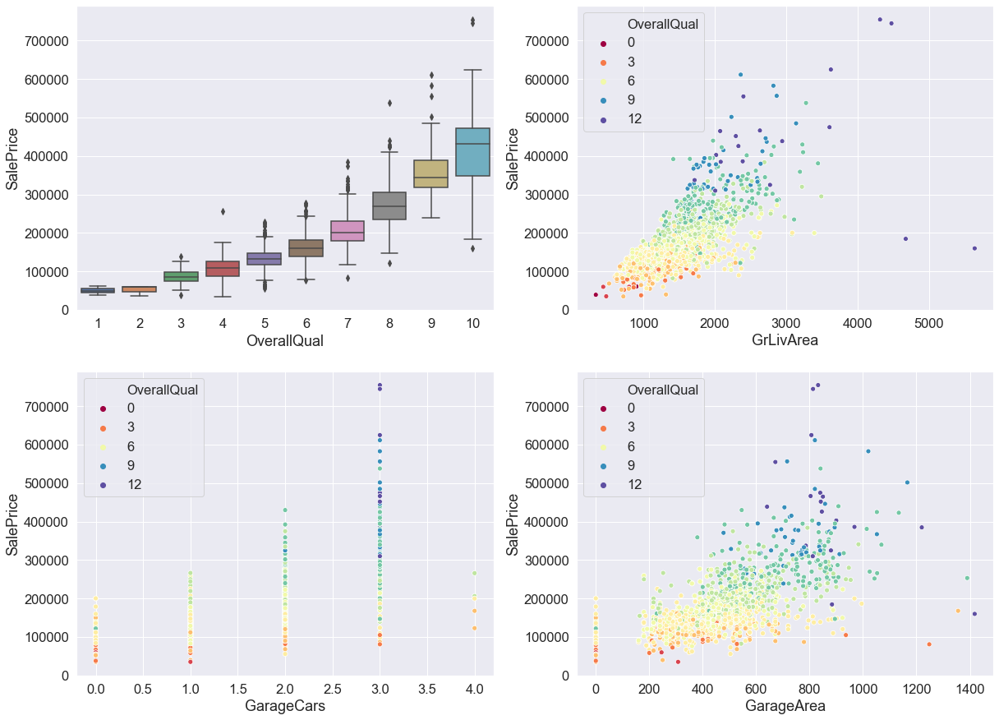

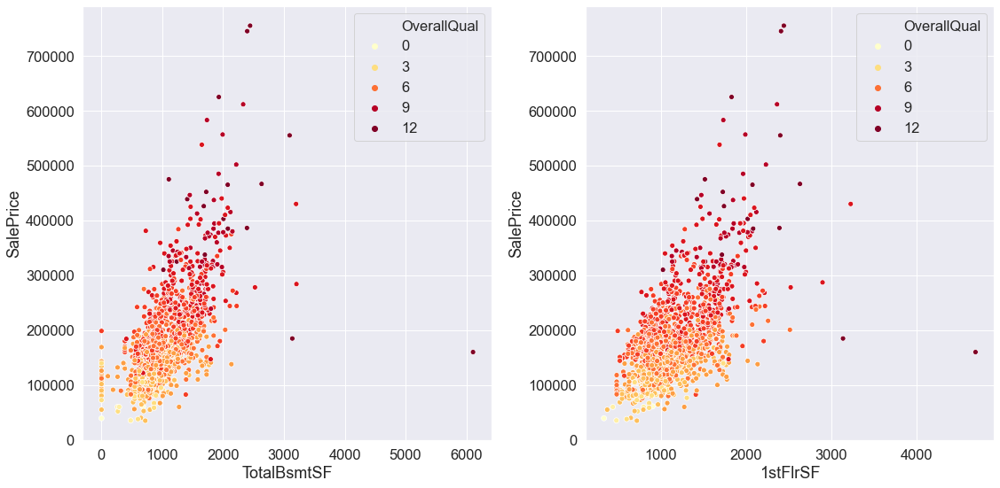

In [19]:
##Segundo: revisamos su relacion con  las otras variables de alta correlacion para evaluar los outliers que detectamos
fig = plt.figure(figsize=(20, 15))
sns.set(font_scale=1.5)

#  Box plot overallqual/salePrice
fig1 = fig.add_subplot(221); sns.boxplot(x='OverallQual', y='SalePrice', data=train[['SalePrice', 'OverallQual']])

#  GrLivArea vs SalePrice plot
fig2 = fig.add_subplot(222); 
sns.scatterplot(x = train.GrLivArea, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')

# GarageCars vs SalePrice plot
fig3 = fig.add_subplot(223); 
sns.scatterplot(x = train.GarageCars, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')

#  GarageArea vs SalePrice plot
fig4 = fig.add_subplot(224); 
sns.scatterplot(x = train.GarageArea, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')

# TotalBsmtSF
fig5 = plt.figure(figsize=(16, 8))
fig6 = fig5.add_subplot(121); 
sns.scatterplot(y = train.SalePrice , x = train.TotalBsmtSF, hue=train.OverallQual, palette= 'YlOrRd')

# 1stFlrSF
fig7 = fig5.add_subplot(122); 
sns.scatterplot(y = train.SalePrice, x = train['1stFlrSF'], hue=train.OverallQual, palette= 'YlOrRd')
plt.tight_layout(); plt.show()

In [20]:
##Indentificar los puntos potencialmente outliers...
#GrLivArea
train[(train["GrLivArea"] > 4500) & (train["SalePrice"] < 200000)]
#Ambos puntos tienen bajo precio a pesar de tener la calificacion overalqual maxima...

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
523,60,RL,130.0000,40094,Pave,NaN,IR1,Bnk,AllPub,Inside,Gtl,Edwards,PosN,PosN,1Fam,2Story,10,5,2007,2008,Hip,CompShg,CemntBd,CmentBd,Stone,762.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,2260,Unf,0,878,3138,GasA,Ex,Y,SBrkr,3138,1538,0,4676,1,0,3,1,3,1,Ex,11,Typ,1,Gd,BuiltIn,2007.0000,Fin,3,884,TA,TA,Y,208,406,0,0,0,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
1298,60,RL,313.0000,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0000,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


In [21]:
#Revisar los otros features
train[(train["GarageArea"] > 1400) & (train["SalePrice"] < 200000)]
#Coincide 1298

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,60,RL,313.0000,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0000,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


In [22]:
train[(train["TotalBsmtSF"] > 6000) & (train["SalePrice"] < 200000)]


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,60,RL,313.0000,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0000,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


Correlation of grlivarea after removing outliers: 0.7349681645359327


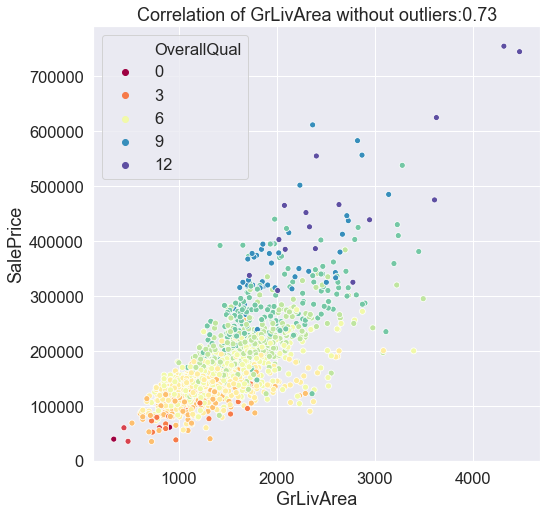

In [23]:
##Puedo eliminar ambos puntos entonces por ser outliers...
train.drop(index = [1298,523], axis = 0, inplace = True)

#Check the GrLivArea without the outliers
fig2 = fig.add_subplot(222); 
sns.scatterplot(x = train.GrLivArea, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')
plt.title("Correlation of GrLivArea without outliers:{:1.2f}".format(train["GrLivArea"].corr(train["SalePrice"])))

##Mejoró la correlacion de GrLivArea al eliminarse los outliers??
print("Correlation of grlivarea after removing outliers:",train["GrLivArea"].corr(train["SalePrice"]))



GrLivArea         0.7350
TotRmsAbvGrd      0.5378
SalePrice         1.0000
GrLivAreaByRms    0.5505
GrLivArea_x_Rms   0.6772
Name: SalePrice, dtype: float64


,GrLivArea,TotRmsAbvGrd,SalePrice,GrLivAreaByRms,GrLivArea_x_Rms
635,3395,14,200000,242.5000,47530


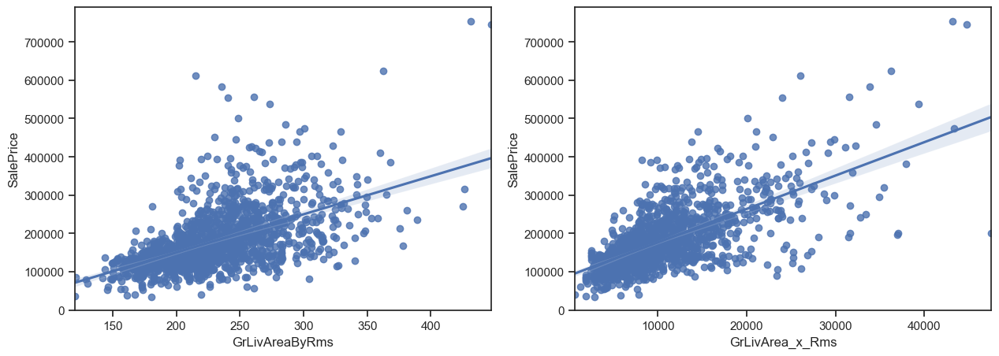

In [24]:
##CREACION DE FEATURES CON MEJOR CORRELACION (BETTER PREDICTORS:

## Creo lista para guardar los nuevos features:
new_features = []

##Creo lista para guardar los features a eliminar
remove_features = []

##GrLivArea y TotRmsAbvGrd
#Creo dos tipos posibles de combinaciones de estos dos features y analizo la corrrlacion con target resultante

t = train[[ 'GrLivArea', 'TotRmsAbvGrd', 'SalePrice']]
t['GrLivAreaByRms'] = train.GrLivArea/train.TotRmsAbvGrd
t['GrLivArea_x_Rms'] = train.GrLivArea*train.TotRmsAbvGrd

#Analizo la correlacion resultante
print(t.corr()["SalePrice"]) #No se mejora la correlacion de griv ni de tot (considerando que ahora la correlacion de griv era de 0.74)

#Graficar para ver si hay algú  outlier que pueda aparecer de estas combinaciones
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (15,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= 'GrLivAreaByRms', y = "SalePrice", data = t )
fig_ = fig.add_subplot(122)
sns.regplot( x= 'GrLivArea_x_Rms', y = "SalePrice", data = t )

#Aparece otro outlier:

t[(t["GrLivArea_x_Rms"] > 40000) & (t["SalePrice"] < 250000)]



In [25]:
##Eliminamos el outlier
train.drop(index = [635], axis = 0, inplace = True)
train.shape[0] #tamaño despues de eliminar el outlier


#3Conclusion: solo se elimina el outlier pero se mantiene el mismo feature dado que su correlacion no fue superada por ninguna combinacion nueva


1457

In [26]:
##En orden de los mas correlacionados continuamos con GarageArea y GarageCars
#Creo dos tipos posibles de combinaciones de estos dos features y analizo la corrrlacion con target resultante

t = train[[ 'GarageArea', 'GarageCars', 'SalePrice']]
t['GarA/car'] = t["GarageArea"]/t["GarageCars"]
t['GarageArea * GarageCars'] =  t["GarageArea"] * t["GarageCars"]

#Analizo la correlacion resultante
t.corr()["SalePrice"] #No se mejora la correlacion de griv ni de tot (considerando que ahora la correlacion de griv era de 0.74)


##Vemos que Garage area *cars mejor la correlacion de ambos features: 0.68



GarageArea                0.6307 
GarageCars                0.6427 
SalePrice                 1.0000 
GarA/car                  -0.0126
GarageArea * GarageCars   0.6841 
Name: SalePrice, dtype: float64

,GarageArea,GarageCars,SalePrice,GarA/car,GarageArea * GarageCars
581,1390,3,253293,463.3333,4170
1061,1248,3,81000,416.0000,3744
1190,1356,4,168000,339.0000,5424
1350,968,4,200000,242.0000,3872


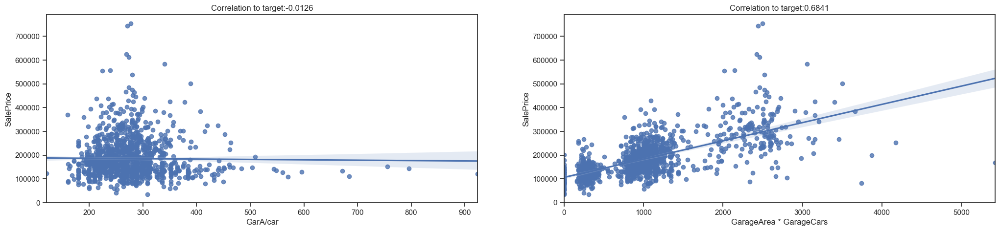

In [27]:
#Graficar para ver si hay algú  outlier que pueda aparecer de estas combinaciones
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (25,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= 'GarA/car', y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["GarA/car"].corr(t["SalePrice"])))
fig_ = fig.add_subplot(122)
sns.regplot( x= 'GarageArea * GarageCars', y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["GarageArea * GarageCars"].corr(t["SalePrice"])))

#Aparece otro outlier??
t[t["GarageArea * GarageCars"] > 3700]

In [28]:
#Se gana correlacion eliminando el outlier?
#Si se gana se elimina, si no se mantiene
d = t[t["GarageArea * GarageCars"] < 3700]
d["GarageArea * GarageCars"].corr(d["SalePrice"])

0.7080885960396965

In [29]:
## Como se produce un aumento de 0,68 a 0.70 se eliminan los outliers
#Eliminamos los outliers
train = train[train["GarageArea"] * train["GarageCars"] < 3700] #con eso elimino todos los outliers que aparecieron (4)
print("Train data shape so far:",train.shape[0])

Train data shape so far: 1453


In [30]:
##Conclusion: se crea un nuevo feature: 'GarageArea * GarageCars' y se eliminan los dos que lo componen

new_features.append('GarageArea * GarageCars')
remove_features.append(["GarageArea", "GarageCars"])


In [31]:
##Continuamos con los siguientes, relacionados con basement y 1st florr sf. Es decir, la superficie construida
#Creo dos tipos posibles de combinaciones de estos dos features y analizo la corrrlacion con target resultante

t = train[[ 'TotalBsmtSF', '1stFlrSF', 'SalePrice']]
t['TotalBsmt/1stFlrSF'] = t["TotalBsmtSF"]/t["1stFlrSF"]
t['TotalBsmt * 1stFlrSF'] =  t["TotalBsmtSF"] * t["1stFlrSF"]

#Analizo la correlacion resultante
t.corr()["SalePrice"] #


##Vemos que la multiplicacion genera una mejor correlacion de ambos features: 0.68


TotalBsmtSF            0.6513
1stFlrSF               0.6318
SalePrice              1.0000
TotalBsmt/1stFlrSF     0.1986
TotalBsmt * 1stFlrSF   0.6838
Name: SalePrice, dtype: float64

0.6864123500742738

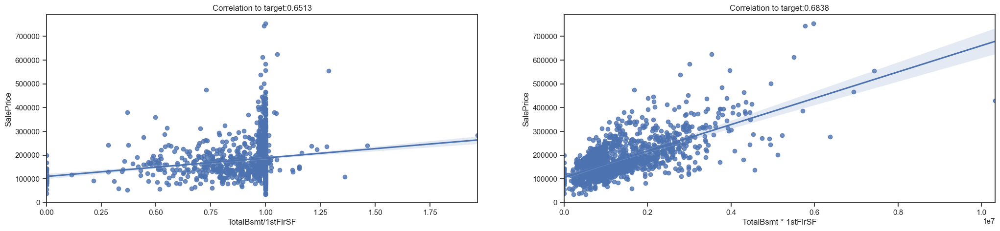

In [32]:
#Graficar para ver si hay algún outlier que pueda aparecer de estas combinaciones
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (25,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= "TotalBsmt/1stFlrSF", y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["TotalBsmtSF"].corr(t["SalePrice"])))
fig_ = fig.add_subplot(122)
sns.regplot( x= 'TotalBsmt * 1stFlrSF', y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["TotalBsmt * 1stFlrSF"].corr(t["SalePrice"])))

#Aparece otro outlier??
t[t["TotalBsmt * 1stFlrSF"] > 10000000]

#Se gana correlacion eliminando el outlier?
#Si se gana se elimina, si no se mantiene
d = t[t["TotalBsmt * 1stFlrSF"] < 10000000]
d["TotalBsmt * 1stFlrSF"].corr(d["SalePrice"])


In [33]:
##Conclusion: no se gana mucha correlacion, de manera que no se elimina el outlier. Se crea un nuevo feature: "TotalBsmt * 1stFlrSF" y se eliminan los dos originales
new_features.append("TotalBsmt * 1stFlrSF")
remove_features.append(["TotalBsmt","1stFlrSF"])


In [34]:
new_features


['GarageArea * GarageCars', 'TotalBsmt * 1stFlrSF']

In [35]:
##Continuamos con YearBuilt y YearRemodAdd
#Creo dos tipos posibles de combinaciones de estos dos features y analizo la corrrlacion con target resultante

t = train[[ 'YearBuilt', 'YearRemodAdd',"GarageYrBlt", 'SalePrice']]
t['YearBuilt/YearRemodAdd'] = t["YearBuilt"]/t["YearRemodAdd"]
t['YearBuilt * YearRemodAdd'] =  t["YearBuilt"] * t["YearRemodAdd"]
t['YearBuilt * GarageYrBlt'] =  t["YearBuilt"] * t["GarageYrBlt"] #También examino esta posibilidad

#Analizo la correlacion resultante
t.corr()["SalePrice"] #


##Vemos que la multiplicacion de los años genera una mejor correlacion de ambos features: 0.5773

YearBuilt                  0.5238
YearRemodAdd               0.5069
GarageYrBlt                0.4878
SalePrice                  1.0000
YearBuilt/YearRemodAdd     0.2202
YearBuilt * YearRemodAdd   0.5773
YearBuilt * GarageYrBlt    0.5230
Name: SalePrice, dtype: float64

Text(0.5, 1.0, 'Correlation to target:0.5773')

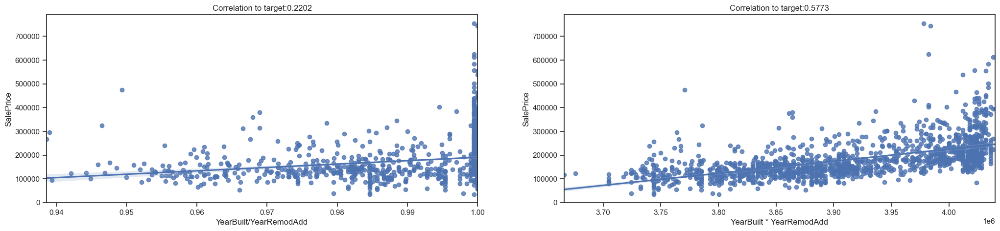

In [36]:
#Graficar para ver si hay algún  outlier que pueda aparecer de estas combinaciones
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (25,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= "YearBuilt/YearRemodAdd", y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t['YearBuilt/YearRemodAdd'].corr(t["SalePrice"])))
fig_ = fig.add_subplot(122)
sns.regplot( x= 'YearBuilt * YearRemodAdd', y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["YearBuilt * YearRemodAdd"].corr(t["SalePrice"])))



In [37]:
#Aparece otro outlier?? revismos los dos de arriba
train[(train["YearBuilt"]* train["YearRemodAdd"] > 395000) & (train["SalePrice"] > 700000)]



,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,60,RL,104.0000,21535,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0000,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455,Unf,0,989,2444,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0000,Fin,3,832,TA,TA,Y,382,50,0,0,0,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
1182,60,RL,160.0000,15623,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0000,Gd,TA,PConc,Ex,TA,Av,GLQ,2096,Unf,0,300,2396,GasA,Ex,Y,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0000,Fin,3,813,TA,TA,Y,171,78,0,0,0,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


In [38]:
#No parecen ser outliers
#Conclusion: se agrega "YearBuilt * "YearRemodAdd" como nuevo feature y se eliminan los dos que lo componen
new_features.append( "YearBuilt * YearRemodAdd")
remove_features.append(["YearBuilt","YearRemodAdd"])
new_features

['GarageArea * GarageCars', 'TotalBsmt * 1stFlrSF', 'YearBuilt * YearRemodAdd']

In [39]:
print("train data shape so far:", train.shape)

train data shape so far: (1453, 80)


In [40]:
##Continuamos con FullBath

# BsmtFullBath: Basement full bathrooms

# BsmtHalfBath: Basement half bathrooms

# FullBath: Full bathrooms above grade

# HalfBath: Half baths above grade


#Creemos y experimentemos con nuevos features
t = train[[ 'BsmtFullBath', 'BsmtHalfBath',"FullBath", 'HalfBath', "SalePrice"]]
t['Total_Bath'] = t["FullBath"] + 0.5 * t["HalfBath"] 
t['Total_Bsmt_Bath'] = t["BsmtFullBath"] + 0.5 * t["BsmtHalfBath"] 
t["TotalBathrooms"] = t["FullBath"] + 0.5 * t["HalfBath"] + t["BsmtFullBath"] + 0.5 * t["BsmtHalfBath"] 

#Analizo la correlacion resultante
t.corr()["SalePrice"] #


##Vemos que  de las dos fórmulas la que da mejor correlacion es Totalbathrooms, con 0.63, lo cual es una mejora

BsmtFullBath      0.2289 
BsmtHalfBath      -0.0177
FullBath          0.5617 
HalfBath          0.2843 
SalePrice         1.0000 
Total_Bath        0.5999 
Total_Bsmt_Bath   0.2268 
TotalBathrooms    0.6369 
Name: SalePrice, dtype: float64

Text(0.5, 1.0, 'Correlation to target:0.6369')

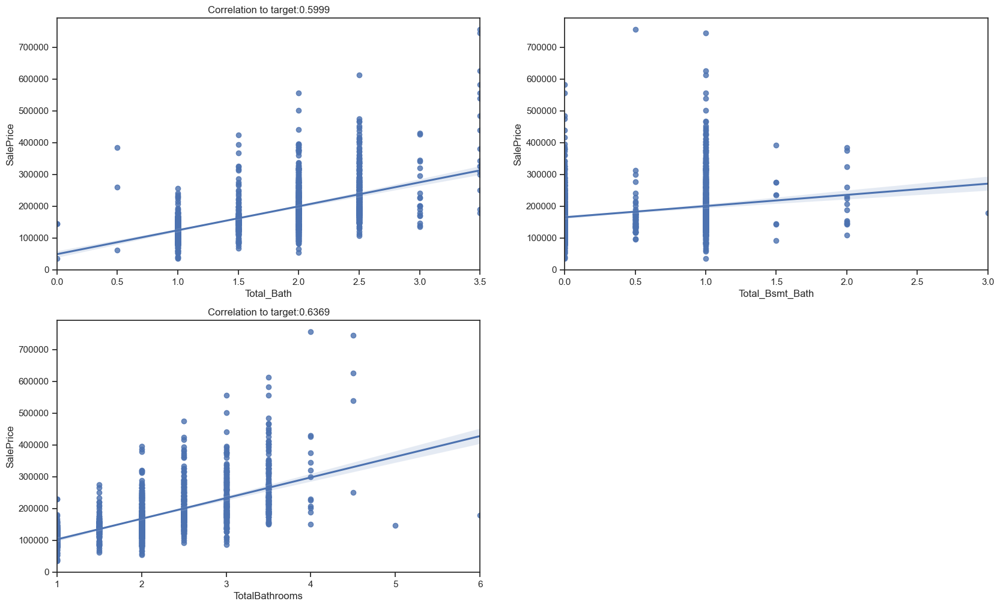

In [41]:
#Graficar para ver si hay algún  outlier que pueda aparecer de estas combinaciones
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (20,12))
fig_1 = fig.add_subplot(221)
sns.regplot( x= "Total_Bath", y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t['Total_Bath'].corr(t["SalePrice"])))
fig_2 = fig.add_subplot(222)
sns.regplot( x= 'Total_Bsmt_Bath', y = "SalePrice", data = t )
fig_3 = fig.add_subplot(223)
sns.regplot( x= 'TotalBathrooms', y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["TotalBathrooms"].corr(t["SalePrice"])))



In [42]:
#Aparece otro outlier?? revismos los dos de arriba
t[t["TotalBathrooms"] > 4.7]

,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,SalePrice,Total_Bath,Total_Bsmt_Bath,TotalBathrooms
738,3,0,3,0,179000,3.0000,3.0000,6.0000
921,2,0,2,2,145900,3.0000,2.0000,5.0000


In [43]:
#Ubico sus indices para ver qué pasa en train
train.loc[[738,921],  :]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
738,90,RL,60.0000,10800,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,5,5,1987,1988,Gable,CompShg,Plywood,Plywood,None,0.0000,TA,TA,CBlock,Gd,Gd,Gd,GLQ,1200,Unf,0,0,1200,GasA,TA,Y,SBrkr,1200,0,0,1200,3,0,3,0,3,1,TA,5,Typ,0,NaN,NaN,nan,NaN,0,0,NaN,NaN,Y,120,0,0,0,0,0,NaN,NaN,NaN,0,3,2009,WD,Alloca,179000
921,90,RL,67.0000,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,Duplex,1.5Fin,5,7,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0000,TA,TA,CBlock,TA,TA,No,ALQ,1084,Unf,0,188,1272,GasA,Gd,Y,SBrkr,1272,928,0,2200,2,0,2,2,4,2,TA,9,Typ,0,NaN,NaN,nan,NaN,0,0,NaN,NaN,N,0,70,0,0,0,0,NaN,GdPrv,NaN,0,9,2008,WD,Normal,145900


In [44]:
#Se gana correlacion eliminando los outliers?
#Si se gana se elimina, si no se mantiene
d = t[t["TotalBathrooms"] < 4.7]
d["TotalBathrooms"].corr(d["SalePrice"])

0.6462853769575145

In [45]:
#La correlacion mejora. Se eliminan:
train = train[(train["FullBath"] + 0.5 * train["HalfBath"] + train["BsmtFullBath"] + 0.5 * train["BsmtHalfBath"] ) < 4.7]
print("train data shape so far:", train.shape)

train data shape so far: (1451, 80)


In [46]:
##Conclusion: se eliminan los 2 outliers y se incropora el nuevo feature totalbathrooms, eliminando todos los otros:
remove_features.append(['BsmtFullBath', 'BsmtHalfBath',"FullBath", 'HalfBath'])
new_features.append("TotalBathrooms")

In [47]:
remove_features

[['GarageArea', 'GarageCars'],
 ['TotalBsmt', '1stFlrSF'],
 ['YearBuilt', 'YearRemodAdd'],
 ['BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath']]

In [48]:
##Continuamos analizando Porch
porch_cols = train.filter(like='orch', axis=1).columns
porch_cols #todos estos features aluden a superficie de este tipo de porches que tiene cada casa. Algunos tienen más de uno
list(porch_cols)

['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch']

In [49]:
#Se les agrega woodeck
#Creemos y experimentemos con nuevos features
t = train[['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch','WoodDeckSF', "SalePrice"]] 
t["TotalPorch"] = t["OpenPorchSF"] + t['EnclosedPorch']+ t['3SsnPorch'] + t['ScreenPorch'] + t['WoodDeckSF'] #sumamos para analizar la superficie total de porch

#Analizo la correlacion resultante
t.corr()["SalePrice"] #


##Vemos que  de las dos fórmulas la que da mejor correlacion es Total, con 0.39, lo cual es una mejora

OpenPorchSF     0.3210 
EnclosedPorch   -0.1289
3SsnPorch       0.0446 
ScreenPorch     0.1114 
WoodDeckSF      0.3264 
SalePrice       1.0000 
TotalPorch      0.3938 
Name: SalePrice, dtype: float64

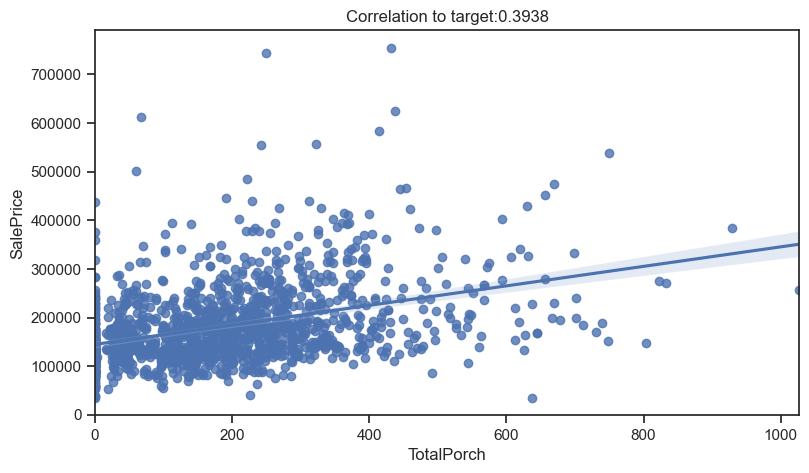

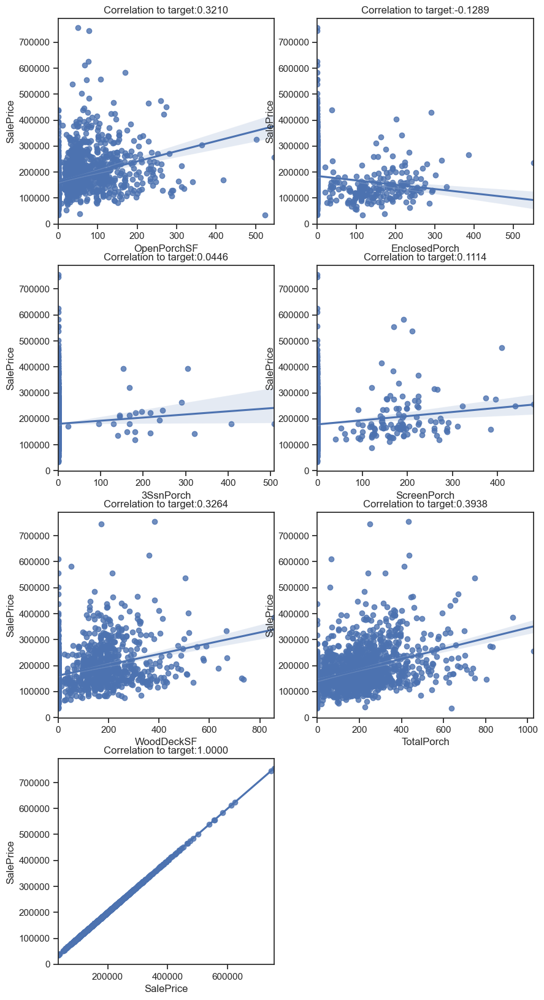

In [50]:
#Graficar para ver si hay algún  outlier que pueda aparecer de estas combinaciones
#t["TotalPorch"] = np.log1p(t["TotalPorch"])
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (20,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= 'TotalPorch', y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["TotalPorch"].corr(t["SalePrice"])))

def plot_vars(cols, t, target):
    sns.reset_defaults()
    sns.set(style="ticks", color_codes=True)
    fig = plt.figure(figsize = (10,20))
    i = 1
    for col in cols:
        fig_i= fig.add_subplot(420 + i)
        sns.regplot( x= col, y = target, data = t )
        plt.title("Correlation to target:{:1.4f}".format(t[col].corr(t[target])))
        i +=1
        
cols = ['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch','WoodDeckSF',"TotalPorch", "SalePrice"]
plot_vars(cols, t, "SalePrice")

In [51]:
#Conclusion: TotalPorch tiene una mayor correlacion, por lo que se agrega. Sin embargo hay que tenr cuidado porque se ve graficamente que tiene una alta varianza
##lo que puede llevar a complex models or overfitting...

new_features.append("TotalPorch")
remove_features += ['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch','WoodDeckSF']


print("train data shape so far:", train.shape)


train data shape so far: (1451, 80)


In [52]:
#Continuamos
sum

,Dtype,Uniques,Nulls,% Nulls,Skew,Kurtosis,Correlation
SalePrice,int64,663,0,0.0000,1.8830,6.5360,1.0000
OverallQual,int64,10,0,0.0000,0.2170,0.0960,0.7910
GrLivArea,int64,861,0,0.0000,1.3670,4.8950,0.7090
GarageCars,int64,5,0,0.0000,-0.3430,0.2210,0.6400
GarageArea,int64,441,0,0.0000,0.1800,0.9170,0.6230
TotalBsmtSF,int64,721,0,0.0000,1.5240,13.2500,0.6140
1stFlrSF,int64,753,0,0.0000,1.3770,5.7460,0.6060
FullBath,int64,4,0,0.0000,0.0370,-0.8570,0.5610
TotRmsAbvGrd,int64,12,0,0.0000,0.6760,0.8810,0.5340
YearBuilt,int64,112,0,0.0000,-0.6130,-0.4400,0.5230


In [53]:
###A continuacion se analizan los features relacionados con las dimensiones y similares

# LotArea: Lot size in square feet
    
# LotShape: General shape of property

#        Reg	Regular	
#        IR1	Slightly irregular
#        IR2	Moderately Irregular
#        IR3	Irregular
       
# LandContour: Flatness of the property

#        Lvl	Near Flat/Level	
#        Bnk	Banked - Quick and significant rise from street grade to building
#        HLS	Hillside - Significant slope from side to side
#        Low	Depression

	
# LotConfig: Lot configuration

#        Inside	Inside lot
#        Corner	Corner lot
#        CulDSac	Cul-de-sac dead end...
#        FR2	Frontage on 2 sides of property
#        FR3	Frontage on 3 sides of property
	
# LandSlope: Slope of property
		
#        Gtl	Gentle slope
#        Mod	Moderate Slope	
#        Sev	Severe Slope

In [54]:
cols_cont = [ "LandContour", "LotConfig"]
t = train[["LotArea", "LotShape", "LandContour", "LotConfig", "LandSlope", "SalePrice"]]

def ordinal_encode(data):
    oe = OrdinalEncoder()
    oe.fit(data)
    data_ordinal = oe.transform(data)
    return data_ordinal

# Se crea una encoding especial para landslope y lotshape
landslope = {}
landslope["Gtl"] = 3
landslope["Mod"] = 2
landslope["Sev"] = 1

lotshape = {}

lotshape["Reg"] = 4
lotshape["IR1"] = 3
lotshape["IR2"] = 2
lotshape["IR3"] = 1


t["LotShape"] = t["LotShape"].map(lotshape)
t["LandSlope"] = t["LandSlope"].map(landslope)


t[cols_cont] = ordinal_encode(t[cols_cont])
t.head(2)
t.corr()["SalePrice"]

LotArea       0.2696 
LotShape      -0.2708
LandContour   0.0146 
LotConfig     -0.0678
LandSlope     -0.0517
SalePrice     1.0000 
Name: SalePrice, dtype: float64

In [55]:
##Creamos intentos de new features
t["Area*Shape*Slope"] = t["LotArea"] * t["LotShape"] * t["LandSlope"]
t["Area*Slope"] = t["LotArea"] * t["LandSlope"]

#testing correlations...
t.corr()["SalePrice"]


LotArea            0.2696 
LotShape           -0.2708
LandContour        0.0146 
LotConfig          -0.0678
LandSlope          -0.0517
SalePrice          1.0000 
Area*Shape*Slope   0.3197 
Area*Slope         0.3976 
Name: SalePrice, dtype: float64

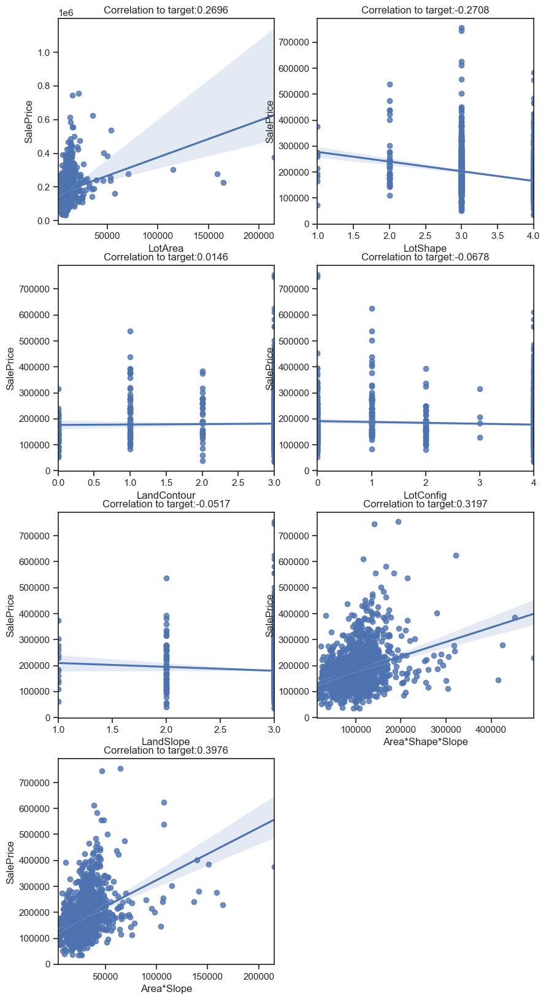

In [56]:
plot_vars(cols  = ["LotArea", "LotShape", "LandContour", "LotConfig", "LandSlope", "Area*Shape*Slope", "Area*Slope"], t = t, target = "SalePrice" )

In [57]:
t.columns

Index(['LotArea', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'SalePrice', 'Area*Shape*Slope', 'Area*Slope'],
      dtype='object')

Text(0.5, 1.0, 'Correlation to target:0.3976')

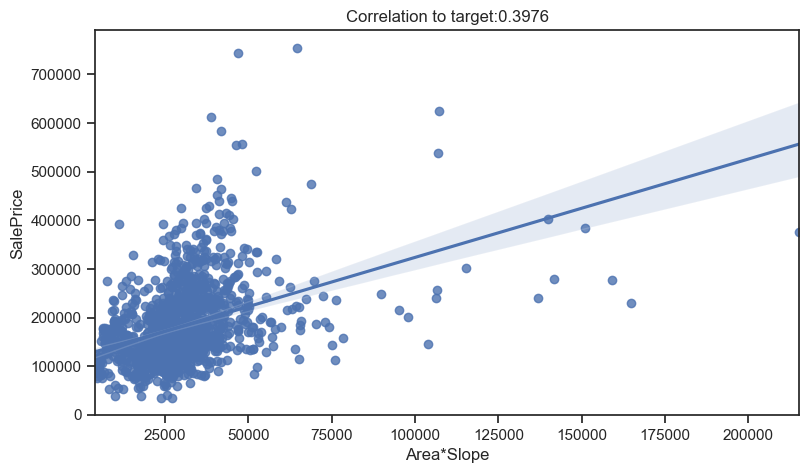

In [58]:
#Se ve que Area*Slope genera una correlacion mas alta que la de LotArea sola (.397)

#Veamos si hay outliers
#Se supone que hay 3, voy a mirar de cerca...
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (20,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= "Area*Slope", y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["Area*Slope"].corr(t["SalePrice"])))



Text(0.5, 1.0, 'Correlation to target:0.4106')

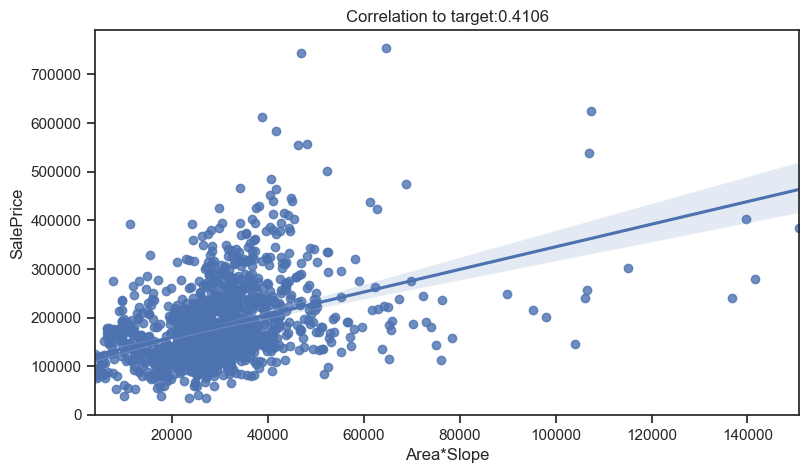

In [59]:
#Se ven 3 que estaban ya en el plot de LotArea

#Mejora la correlacion si los elimino?

d = t[t["Area*Slope"] < 155000]

sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (20,5))
fig_1 = fig.add_subplot(121)
sns.regplot( x= "Area*Slope", y = "SalePrice", data = d )
plt.title("Correlation to target:{:1.4f}".format(d["Area*Slope"].corr(t["SalePrice"])))
   
#La correlacion aumenta a .4106


In [60]:
#Conclusion:
#Mejora la correlación pero el viejo no incorpora el feature ni elimina los dos outliers, seguramente por la gran varianza
# new_features.append("Area*Slope")
# remove_features += ["LotArea","LandSlope"]

# train = train[train["LotArea"] < 155000]
train.shape[0]


1451

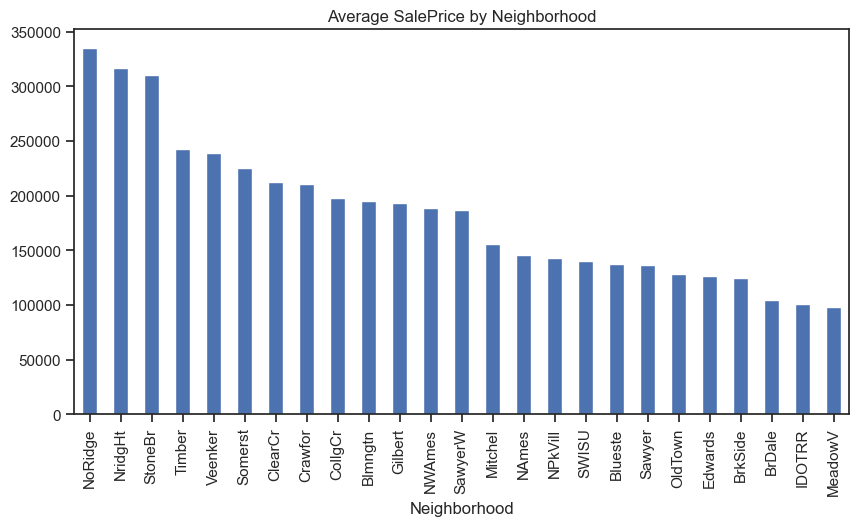

In [61]:
###Continuamos analizando neighborhood para ver cuanto influye en el precio
#Como es una var categiorica hay que analizarla de otra forma

#Precios promedio por vecindario
#Cantifdad de casa vendidas por vecindario

av_prices = train.groupby("Neighborhood")["SalePrice"].mean().sort_values(ascending = False)
av_prices.plot.bar(title = "Average SalePrice by Neighborhood", figsize = (10,5))

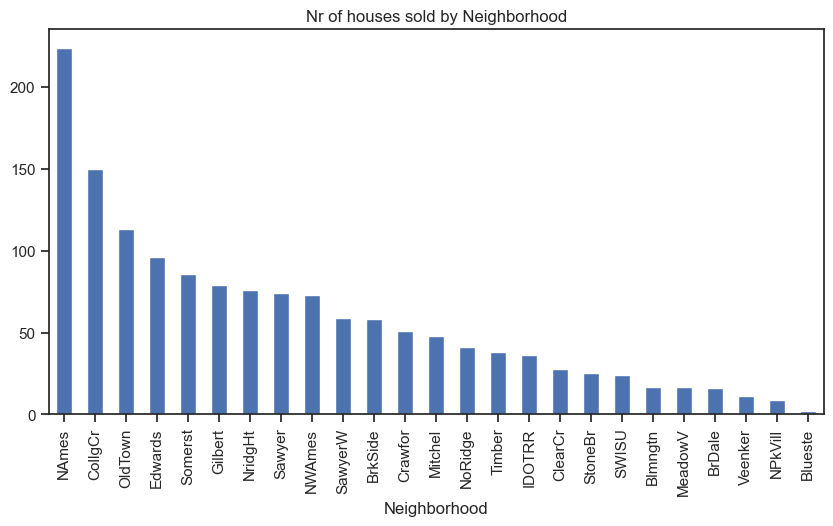

In [62]:
sold_neigh = train.groupby("Neighborhood").size().sort_values(ascending = False)
sold_neigh.plot.bar(title = "Nr of houses sold by Neighborhood", figsize = (10,5))

In [63]:
train["Neighborhood"].value_counts()/train["Neighborhood"].shape[0]

NAmes     0.1544
CollgCr   0.1034
OldTown   0.0779
Edwards   0.0662
Somerst   0.0593
Gilbert   0.0544
NridgHt   0.0524
Sawyer    0.0510
NWAmes    0.0503
SawyerW   0.0407
BrkSide   0.0400
Crawfor   0.0351
Mitchel   0.0331
NoRidge   0.0283
Timber    0.0262
IDOTRR    0.0248
ClearCr   0.0193
StoneBr   0.0172
SWISU     0.0165
MeadowV   0.0117
Blmngtn   0.0117
BrDale    0.0110
Veenker   0.0076
NPkVill   0.0062
Blueste   0.0014
Name: Neighborhood, dtype: float64

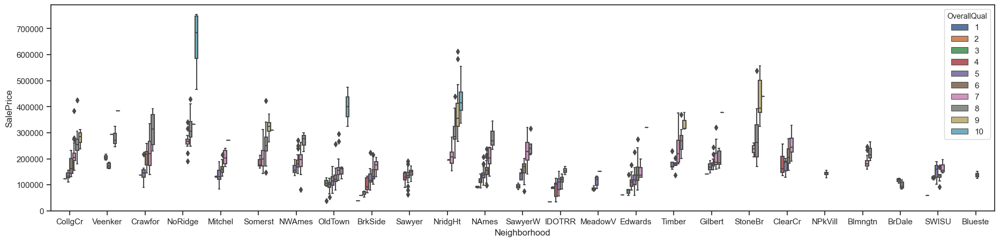

In [64]:
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)
fig = plt.figure(figsize = (50,5))
fig_1 = fig.add_subplot(121)
sns.boxplot(x = "Neighborhood", y = "SalePrice", data = train, hue = "OverallQual")

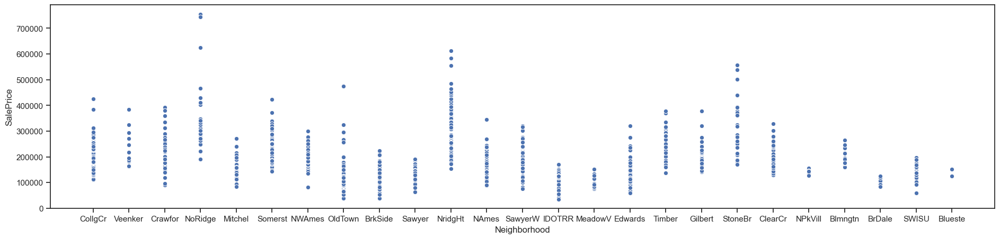

In [65]:
fig = plt.figure(figsize = (23,5))
sns.scatterplot(x = "Neighborhood", y = "SalePrice", data = train)

,YrSold,Average Price
0,1974,294000
1,1976,195500
2,1977,165000
3,1978,194000
4,1981,385000
5,1984,162500
6,1993,324000
7,1995,270000
8,1996,245500


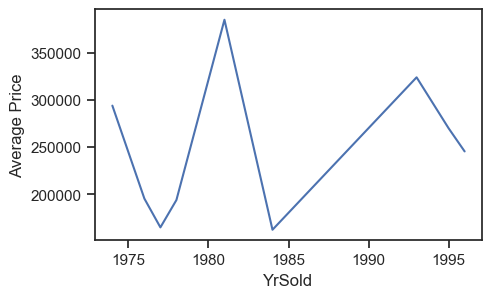

In [66]:
##Relacion entre el año de venta y el precio de venta segun vecindario...
neigh = list(train["Neighborhood"].value_counts().index)

##Plotear precio promedio por año segun cada vecindario
c = train[train["Neighborhood"]== "Veenker"].groupby("YearBuilt")["SalePrice"].mean()
d = pd.DataFrame({"YrSold": c.index, "Average Price": c.values} )
fig = plt.figure(figsize = (5,3))

# ]g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'YrSold', col='Neighborhood', data=YearlyPrice, kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index)
sns.lineplot(y= 'Average Price', x = 'YrSold', data = d)
d

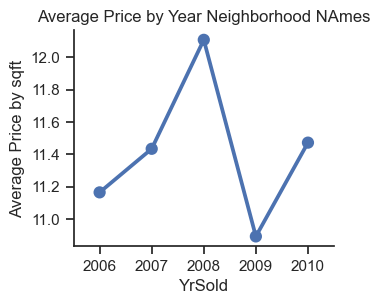

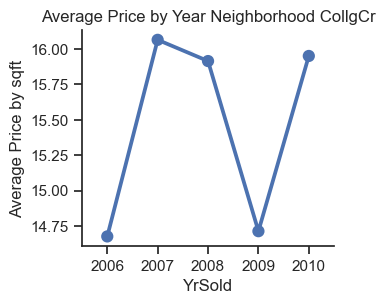

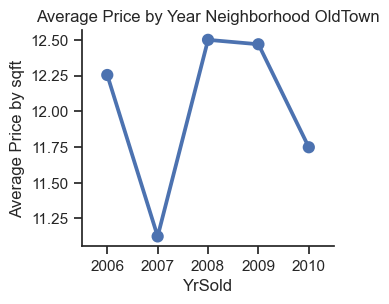

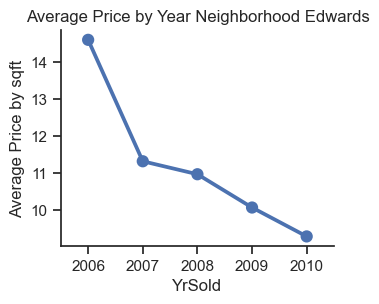

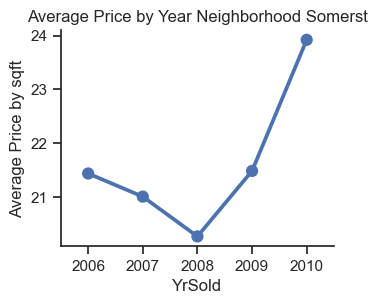

...

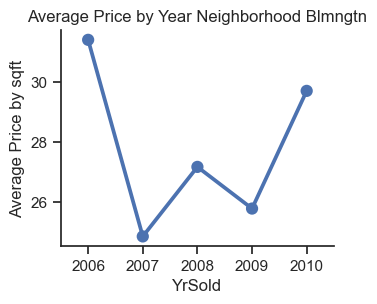

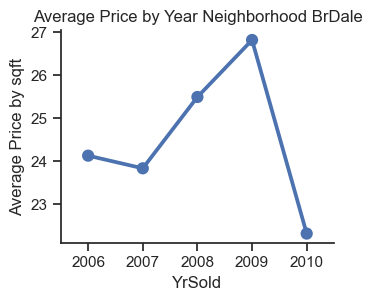

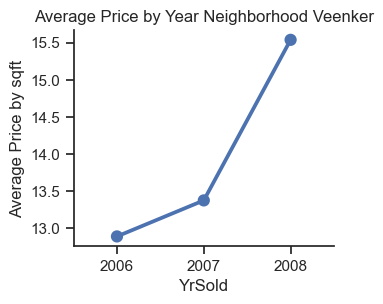

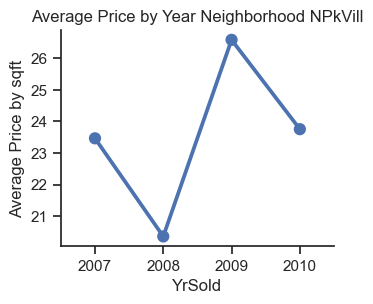

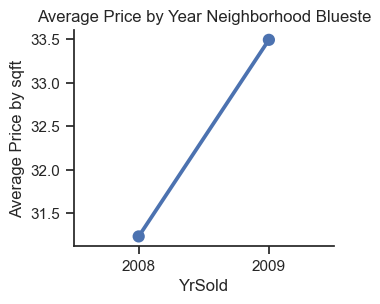

In [67]:
##Relacion entre el año de venta y el precio de venta segun vecindario...
#Tiene más sentido estudiar el valor del m2 por vecindario, como se suele hacer en corretajes

neigh = list(train["Neighborhood"].value_counts().index) #lista de barrios

t = train[["Neighborhood", "YrSold", "SalePrice"]]

#Creamos un nuevo feature de precio promedio por superficie
t["TotalArea"] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                   train.LotArea.fillna(0) + train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + 
                   train.OpenPorchSF.fillna(0) + train["3SsnPorch"].fillna(0) + train.ScreenPorch.fillna(0) + 
                   train.EnclosedPorch.fillna(0) + train.PoolArea.fillna(0) )

t["PriceArea"] = t["SalePrice"] / t["TotalArea"] #precio por m2

##Plotear precio promedio por año segun cada vecindario
#g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'YrSold', col='Neighborhood', data=YearlyPrice, kind="point", aspect=.6, col_wrap=7, height=4, col_order=neigh)
# ]g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'YrSold', col='Neighborhood', data=YearlyPrice, kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index)


# ##Plotear precio promedio por año segun cada vecindario
for barrio in neigh:
    c = t[t["Neighborhood"]== barrio].groupby("YrSold")["PriceArea"].mean()
    d = pd.DataFrame({"YrSold": c.index, "Average Price by sqft": c.values} )
    #fig = plt.figure(figsize = (2,2))
    sns.catplot(y= 'Average Price by sqft', x = 'YrSold', data = d,  kind="point", aspect = 1.2, height = 3)
    plt.title("Average Price by Year Neighborhood {}".format(barrio))
    


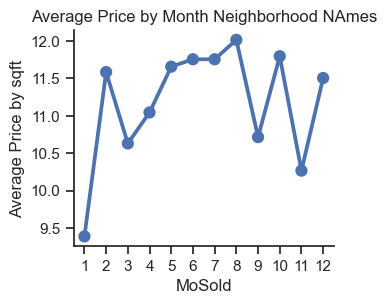

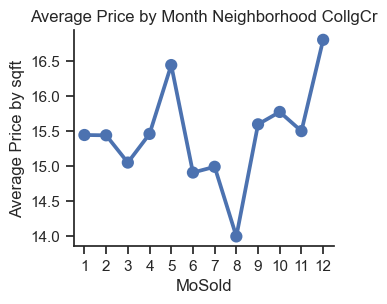

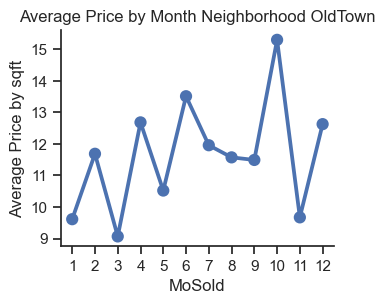

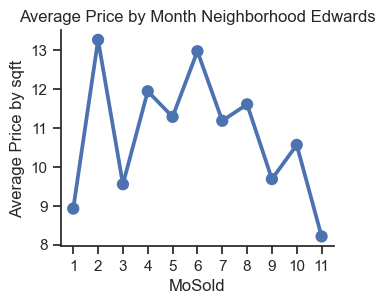

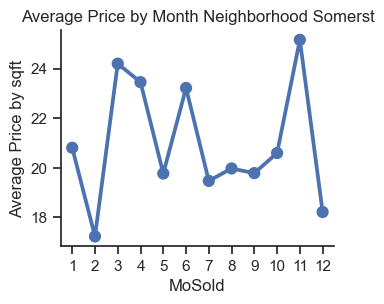

...

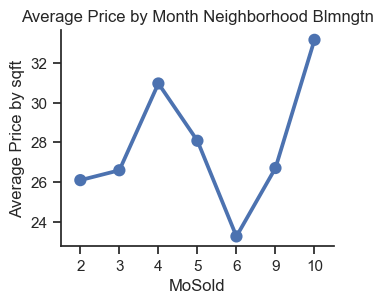

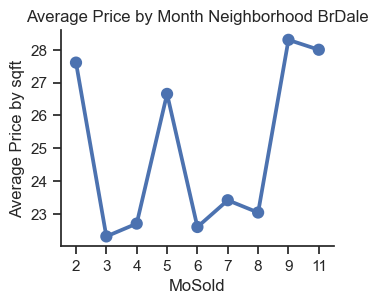

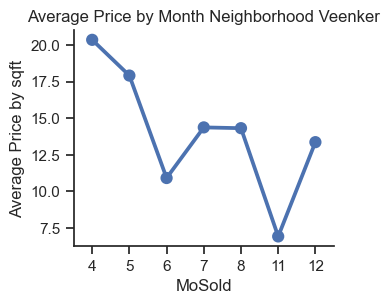

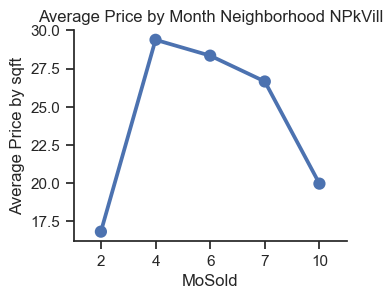

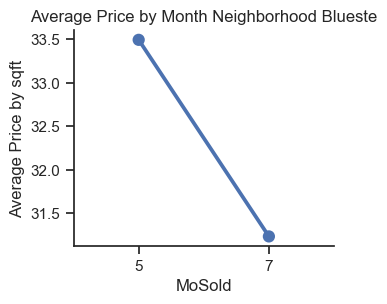

In [68]:
##Lo mismo pero por mes
##Relacion entre el año de venta y el precio de venta segun vecindario...
#Tiene más sentido estudiar el valor del m2 por vecindario, como se suele hacer en corretajes

neigh = list(train["Neighborhood"].value_counts().index) #lista de barrios

t = train[["Neighborhood", "MoSold", "SalePrice"]]

#Creamos un nuevo feature de precio promedio por superficie
t["TotalArea"] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                   train.LotArea.fillna(0) + train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + 
                   train.OpenPorchSF.fillna(0) + train["3SsnPorch"].fillna(0) + train.ScreenPorch.fillna(0) + 
                   train.EnclosedPorch.fillna(0) + train.PoolArea.fillna(0) )

t["PriceArea"] = t["SalePrice"] / t["TotalArea"] #precio por m2

##Plotear precio promedio por año segun cada vecindario
#g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'MoSold', col='Neighborhood', data=YearlyPrice, kind="point", aspect=.6, col_wrap=7, height=4, col_order=neigh)
# ]g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'MoSold', col='Neighborhood', data=YearlyPrice, kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index)


# ##Plotear precio promedio por año segun cada vecindario
for barrio in neigh:
    c = t[t["Neighborhood"]== barrio].groupby("MoSold")["PriceArea"].mean()
    d = pd.DataFrame({"MoSold": c.index, "Average Price by sqft": c.values} )
    #fig = plt.figure(figsize = (2,2))
    sns.catplot(y= 'Average Price by sqft', x = 'MoSold', data = d,  kind="point", aspect = 1.2, height = 3)
    plt.title("Average Price by Month Neighborhood {}".format(barrio))
    




In [69]:
#train.filter(like='Y', axis=1)

In [70]:
###Hay outliers detectables? En month pueden verse varios posibles, pero se opta por los más evidentes, que aparecen en Crawfor

In [71]:
t[(t["Neighborhood"] == "Crawfor") & (t["PriceArea"] > 30)]

,Neighborhood,MoSold,SalePrice,TotalArea,PriceArea
1181,Crawfor,11,392500,9875.0000,39.7468
1405,Crawfor,1,275000,8074.0000,34.0599


In [72]:
##Se eliminan estos outliers:
train.drop(index = [1181, 1405], axis = 0, inplace = True)

In [73]:
#new shape
print("Shape of train dataset after outliers removal from neighborhoods:", train.shape)

Shape of train dataset after outliers removal from neighborhoods: (1449, 80)


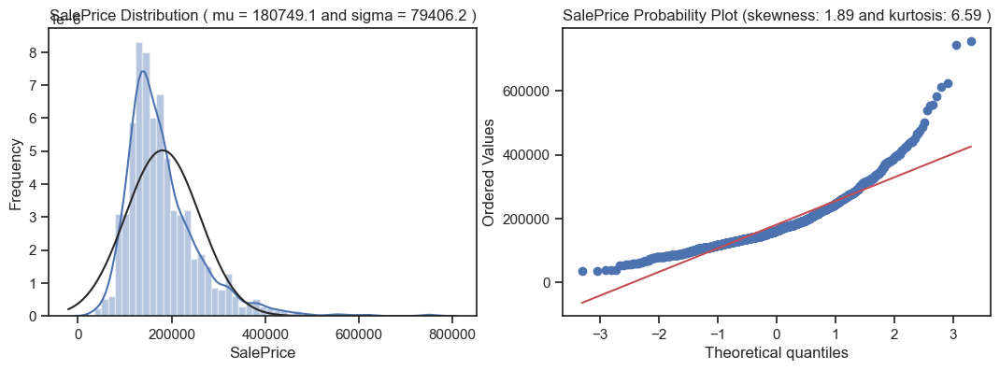

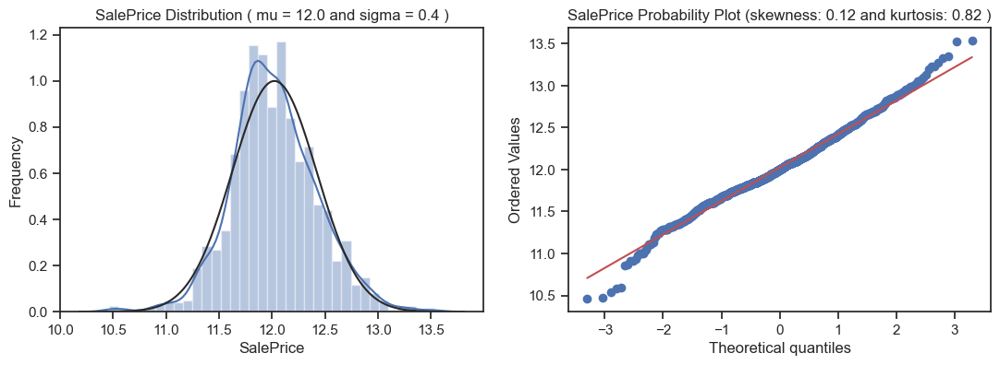

In [74]:
###CHECK THE DISTRIBUTION OF TARGET VARIABLE AND TRANSFORMATION
##Modulo para plotear

def QQ_plot(data, target):
    #Crea la figura
    fig = plt.figure(figsize = (13,4))
    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)
    #Kernel density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit = norm)
    fig1.set_title(target + ' Distribution ( mu = {:.1f} and sigma = {:.1f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(target)
    fig1.set_ylabel("Frequency")
    
    #Creamos el QQ-plot
    fig2 = fig.add_subplot(122)
    res = stats.probplot(data, plot = fig2)
    fig2.set_title(target + ' Probability Plot (skewness: {:.2f} and kurtosis: {:.2f} )'.format(data.skew(), data.kurt()), loc='center')
    
    #Print results
    
    
##TRANSFORMATION OF TARGET:
#Transforming the target using log1p...  
QQ_plot(data = train["SalePrice"], target = "SalePrice")
QQ_plot(data = np.log1p(train["SalePrice"]), target = "SalePrice")


In [75]:
###TRANFORMATION OF TARGET VARIABLE:
train["SalePrice"] = np.log1p(train["SalePrice"])

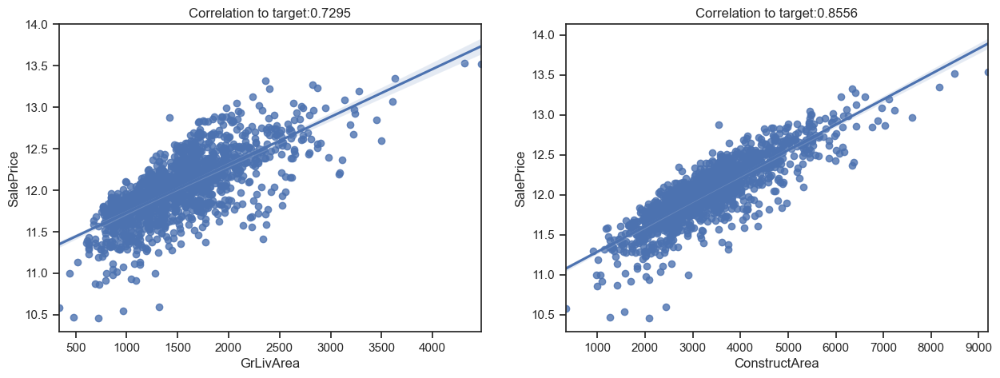

In [76]:
#ANALYSIS AND EVALUATION OF A NEW POSSIBLE FEATURE ACCORDING TO SOME EXPERT ADVICE


#Creamos un nuevo feature de SUPERFICIE CONSTRUIDA



t = train[['SalePrice', 'GrLivArea']]
t['ConstructArea'] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                       train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + train.OpenPorchSF.fillna(0) + 
                       train["3SsnPorch"].fillna(0) + train.ScreenPorch.fillna(0) + train.EnclosedPorch.fillna(0) + 
                       train.PoolArea.fillna(0) )

#Vale la pena este nuevo feature? Veamos su correlacion con SalePrice
fig = plt.figure(figsize = (15,5))
fig1 = fig.add_subplot(121)
sns.regplot( x= "GrLivArea", y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["GrLivArea"].fillna(0).corr(t["SalePrice"])))
fig2 = fig.add_subplot(122)
sns.regplot( x= "ConstructArea", y = "SalePrice", data = t )
plt.title("Correlation to target:{:1.4f}".format(t["ConstructArea"].corr(t["SalePrice"])))
plt.show()


In [77]:
##Se ve que ConstructArea (feature compuesto de la suma de los features de conrtsuccion) 
##es mucho mas solido en correlacion y varianza


In [78]:
##Conviene conservar los dos features o eliminar GrLivArea? Se realiza un analisis basado en una regresion. 
##Hacemos una regresion de combinaciones de las dos features respecto de SalePrice, e incluimos combinaciones polinomiales

In [79]:
t.columns

Index(['SalePrice', 'GrLivArea', 'ConstructArea'], dtype='object')

In [80]:
#Generamos X e y
# y = np.log1p(t["SalePrice"]) #se transformó el target
y = t["SalePrice"]

#Rescaling X
scale = RobustScaler()
X = scale.fit_transform(t[["ConstructArea", "GrLivArea"]])

#Creating train and test sets
x_train, x_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 101)

lr = LinearRegression()



In [81]:


#Comenzamos...
#Modulo para dar resultados
def results():
    print("Coefficients:", lr.coef_)
    print("Root Mean Square Error: %.4f"% np.expm1(np.sqrt(mean_squared_error(y_test, y_pred))))
    print("R-squared test set: %.4f"% r2_score(y_test, y_pred))
    print('--------------------------------------------------------------------------------\n')
    
          
#1. Regresion con solo GrLivArea
print("Regression with GrlivArea:")

lr.fit(x_train[:,1].reshape(-1,1), y_train)
y_pred = lr.predict(x_test[:,1].reshape(-1,1))
results()

#2. Regresion con solo ConstructArea
print("Regression with ConstructArea:")

lr.fit(x_train[:,0].reshape(-1,1), y_train)
y_pred = lr.predict(x_test[:,0].reshape(-1,1))
results()

#3. Regresion with both features
print("Regression with both features:")
lr.fit(x_train, y_train)
y_pred = lr.predict(x_test)
results()

#4. Polynomial regressor of order 3 with ConstructArea (1,a,a2,a3)
print("Polynomial regressor of order 3 with ConstructArea:")
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False) #instanciamos
X_cubic = cubic.fit_transform(x_train[:,0].reshape(-1,1)) # se crean todos los features nuevos
lr.fit(X_cubic, y_train)
X_cubic_test = cubic.fit_transform(x_test[:,0].reshape(-1,1))
y_pred = lr.predict(X_cubic_test)
results()

#5. Polynomial regressor of order 3 with both features (1,a,a2,a3, b, ab2, etc)
print("Polynomial regressor of order 3 with both features:")
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False) #instanciamos
X_cubic = cubic.fit_transform(x_train) # se crean todos los features nuevos
lr.fit(X_cubic, y_train)
X_cubic_test = cubic.fit_transform(x_test) #nuevos features para test
y_pred = lr.predict(X_cubic_test)
results()







Regression with GrlivArea:
Coefficients: [0.37373448]
Root Mean Square Error: 0.3135
R-squared test set: 0.5547
--------------------------------------------------------------------------------

Regression with ConstructArea:
Coefficients: [0.42050449]
Root Mean Square Error: 0.2276
R-squared test set: 0.7481
--------------------------------------------------------------------------------

Regression with both features:
Coefficients: [0.40446921 0.02013973]
Root Mean Square Error: 0.2275
R-squared test set: 0.7484
--------------------------------------------------------------------------------

Polynomial regressor of order 3 with ConstructArea:
Coefficients: [ 0.437434   -0.0420375   0.00630214]
Root Mean Square Error: 0.2212
R-squared test set: 0.7608
--------------------------------------------------------------------------------

Polynomial regressor of order 3 with both features:
Coefficients: [ 0.41182783  0.03846449 -0.05035786  0.06608028 -0.07134685 -0.01285254
  0.08643164 -0.

In [82]:
##Los mejores resultados se obtuvieron del regresor polinomial de orden 3 para ConstructArea solitario

In [83]:
##FINAL SIZED OF THE TRAINING SET AFTER CUTTING OUTLIERS 
###Dimensiones del train dataset y del y_train luego de elinminar los otuliers:
print("Shape of train before nulls cleaning stage:", train.shape)
#Actualizo el y_train:
y_train = train["SalePrice"]
y_train.shape

Shape of train before nulls cleaning stage: (1449, 80)


(1449,)

In [84]:
y_train.shape

(1449,)

In [85]:
####D A T A   C L E A N I N G
#Concat data for cleaning work:
all_data = pd.concat((train.drop("SalePrice", axis =1), test), axis = 0)
print("Complete data shape entering nulls cleaning stage:", all_data.shape)

Complete data shape entering nulls cleaning stage: (2908, 79)


In [86]:
all_data.isnull().sum().sort_values(ascending = False)

nulos = pd.DataFrame({"Data_type": [df[i].dtype for i in all_data.columns], "Nulls":all_data.isnull().sum().sort_values(ascending = False), "% Nulls":all_data.isnull().sum().sort_values(ascending = False)/all_data.shape[0] })

nulos[nulos["Nulls"] > 0]

,Data_type,Nulls,% Nulls
PoolQC,int64,2899,0.9969
MiscFeature,object,2804,0.9642
Alley,float64,2711,0.9323
Fence,int64,2338,0.8040
FireplaceQu,object,1415,0.4866
LotFrontage,object,485,0.1668
GarageCond,object,156,0.0536
GarageQual,object,156,0.0536
GarageYrBlt,object,156,0.0536
GarageFinish,object,156,0.0536


In [87]:
print("There are {} features with null values in our dataset".format(nulos[nulos["Nulls"] > 0].shape[0]))

There are 34 features with null values in our dataset


In [88]:
##Hay algun feature categorico que esté muy skewed?? Si es asi, no tiene valor preidctivo y se elimina
#En este caso utilities

cat_feat = all_data.select_dtypes(include = ["object"]).columns 

def cat_skewed(data, feat): ##Busca y entrega categorical cargadas en extremo a una sola clase
    skewed = []
    for f in feat:
        if all_data.groupby(f).size()[0] >= 0.99 * all_data[f].shape[0]: #cargada 99% a una clase
            skewed.append((f, all_data.groupby(f).size()[0]))
    return skewed

cat_skewed(all_data, cat_feat)


[('Utilities', 2905)]

In [89]:
#Por lo anterior eliminamos el feature Utilities...
all_data.drop(["Utilities"], axis = 1, inplace= True)


In [90]:
####MODULO FILL NULL VALUES
class DataFrameImputer(TransformerMixin): ##con TransfromerMixin se podra despues llamar los metodos fit y transform juntos con fit_transform
    def __init__(self):
        """ Método para asignar valor de fillna 
        a cada columna del dataset según dtype"""
        
    def fit(self, X): 
        """Crea una lista de asignación del valor
        que debe tomar cada feature nulo segun tipo de data: moda o mean"""
        self.fill = pd.Series([X[c].mode()[0] if X[c].dtype == np.dtype('O')
            else X[c].mean() for c in X], index = X.columns)
        return self
        
        
    def transform(self, X):
          return X.fillna(self.fill) ## va a rellenar los nulls con lo que le diga fill

In [91]:
##Analisis de nulls y data quality en features

In [92]:
###Fill nulls in feature Electrical
all_data.groupby("Electrical").size() #es SBrkr
#Fill
all_data["Electrical"] = all_data["Electrical"].fillna("SBrkr")

In [93]:
#Partimos por Garage
all_data.groupby("GarageType").size()

GarageType
2Types     22  
Attchd     1719
Basment    36  
BuiltIn    185 
CarPort    15  
Detchd     777 
dtype: int64

In [94]:
##Summary
#Separo todos los feats rel to Garage
#Summary de nulls
#Summary de garagearea y garagecars == 0
#Sumary de records con garageyear nulo pero garagetype no nulo---> detached

#Fiilna de nulos de garagetype con NA (en vez de cero por ser categoricos)

#fillna de garagearea con garagetype detached usando median
#fillna de garagearea con 0 para el resto

#fillna de garagecars con garagetype detached usando median
#fillna de garagecars con 0 para el resto

#fillna de garageyrblt con garagetype detached usando median
#fillna de garageyrbltcon 0 para el resto

#fillna de resto que son categ con garagetype detached
#fillna de resto categorico con NA para el resto

#ANALYSIS

## Lo central es ver si hay binconsistencias donde porejemplo no haya año de construccion del garage pero
##si hay calificacion de su tipo 

##Si se revisa se vera que todos los nulls de estas categorias estan juntos, salvo en dos casos donde
##el feat garagetype tiene un valor no nulo (detchd). Por eso se toman esos dos casos ylos nulos se reemplazan por las medianas
#y modas de cada columna, y al resto de todos los nulos se reemplazan por 0 o NA segun numerico o categorico
#Nota: "NA" es una categoria agregada a la clasificacion de cada categorico






In [95]:
feat = ['GarageYrBlt', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'GarageArea', 'GarageCars']

In [96]:
#Summary of nulls..
all_data[feat].isnull().sum().sort_values(ascending = False)

GarageCond      156
GarageQual      156
GarageFinish    156
GarageYrBlt     156
GarageType      154
GarageCars      1  
GarageArea      1  
dtype: int64

In [97]:
##Sumario de los que tienen 0
for f in feat:
    print(f, ":", (all_data[f] == 0).sum())


GarageYrBlt : 0
GarageType : 0
GarageFinish : 0
GarageQual : 0
GarageCond : 0
GarageArea : 154
GarageCars : 154


In [98]:
#Car y Area tienen ceros, que es como si tuvieran nulos ahi (ademas de sus nulls). Cero implicaría que no tienen Garage

In [99]:
all_data[all_data["GarageCars"] == 0][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
39,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
48,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
78,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
88,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
89,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
99,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
108,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
125,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
127,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
140,nan,NaN,NaN,NaN,NaN,0.0000,0.0000


In [100]:
##Summary de records con garageyrblt nulo pero garagetype no nulo---> detached
all_data[(all_data["GarageYrBlt"].isnull()) & (all_data["GarageType"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
666,nan,Detchd,NaN,NaN,NaN,360.0000,1.0000
1116,nan,Detchd,NaN,NaN,NaN,nan,nan


In [101]:
all_data[(all_data["GarageYrBlt"].isnull()) & (all_data["GarageArea"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
39,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
48,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
78,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
88,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
89,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
99,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
108,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
125,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
127,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
140,nan,NaN,NaN,NaN,NaN,0.0000,0.0000


In [102]:
all_data[all_data["GarageType"].isnull()][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
39,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
48,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
78,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
88,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
89,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
99,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
108,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
125,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
127,nan,NaN,NaN,NaN,NaN,0.0000,0.0000
140,nan,NaN,NaN,NaN,NaN,0.0000,0.0000


In [103]:
#Fillna de nulos de garagetype con NA (en vez de cero por ser categoricos), ya que se ve arriba que corresponden a no-garages
all_data["GarageType"] = all_data["GarageType"].fillna("NA")

In [104]:
feat

['GarageYrBlt',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'GarageArea',
 'GarageCars']

In [105]:
#GarageArea:
all_data[(all_data["GarageArea"].isnull()) & (all_data["GarageType"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
1116,nan,Detchd,NaN,NaN,NaN,nan,nan


In [106]:
##Garage Finish
all_data[(all_data["GarageFinish"].isnull()) & (all_data["GarageType"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
39,nan,NA,NaN,NaN,NaN,0.0000,0.0000
48,nan,NA,NaN,NaN,NaN,0.0000,0.0000
78,nan,NA,NaN,NaN,NaN,0.0000,0.0000
88,nan,NA,NaN,NaN,NaN,0.0000,0.0000
89,nan,NA,NaN,NaN,NaN,0.0000,0.0000
99,nan,NA,NaN,NaN,NaN,0.0000,0.0000
108,nan,NA,NaN,NaN,NaN,0.0000,0.0000
125,nan,NA,NaN,NaN,NaN,0.0000,0.0000
127,nan,NA,NaN,NaN,NaN,0.0000,0.0000
140,nan,NA,NaN,NaN,NaN,0.0000,0.0000


In [107]:
#GarageQual
all_data[(all_data["GarageQual"].isnull()) & (all_data["GarageType"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
39,nan,NA,NaN,NaN,NaN,0.0000,0.0000
48,nan,NA,NaN,NaN,NaN,0.0000,0.0000
78,nan,NA,NaN,NaN,NaN,0.0000,0.0000
88,nan,NA,NaN,NaN,NaN,0.0000,0.0000
89,nan,NA,NaN,NaN,NaN,0.0000,0.0000
99,nan,NA,NaN,NaN,NaN,0.0000,0.0000
108,nan,NA,NaN,NaN,NaN,0.0000,0.0000
125,nan,NA,NaN,NaN,NaN,0.0000,0.0000
127,nan,NA,NaN,NaN,NaN,0.0000,0.0000
140,nan,NA,NaN,NaN,NaN,0.0000,0.0000


In [108]:
##GarageCond
all_data[(all_data["GarageCond"].isnull()) & (all_data["GarageType"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
39,nan,NA,NaN,NaN,NaN,0.0000,0.0000
48,nan,NA,NaN,NaN,NaN,0.0000,0.0000
78,nan,NA,NaN,NaN,NaN,0.0000,0.0000
88,nan,NA,NaN,NaN,NaN,0.0000,0.0000
89,nan,NA,NaN,NaN,NaN,0.0000,0.0000
99,nan,NA,NaN,NaN,NaN,0.0000,0.0000
108,nan,NA,NaN,NaN,NaN,0.0000,0.0000
125,nan,NA,NaN,NaN,NaN,0.0000,0.0000
127,nan,NA,NaN,NaN,NaN,0.0000,0.0000
140,nan,NA,NaN,NaN,NaN,0.0000,0.0000


In [109]:
#GarageCars
all_data[(all_data["GarageCars"].isnull()) & (all_data["GarageType"].isnull() == False)][feat]

,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
1116,nan,Detchd,NaN,NaN,NaN,nan,nan


In [110]:
##FILLNAS PARA GARAGE RELATED FEATURES(FEAT)

#GARAGETYPE: listo

#GARAGEAREA:Revise las combinaciones donde GarageArea es null pero otro feature de garage no lo es, y encontre solo 
#un garagetype == Detchd, asi que ahi relleno con el median de garageareaq para la categoria Detchd d garagetype y el resto con 0
gardet_area_median = all_data[all_data["GarageType"] == "Detchd"]["GarageArea"].median() #median for garegaarea when garagetype == detchd
all_data.loc[all_data["GarageType"] == "Detchd", "GarageArea"] = all_data.loc[all_data["GarageType"] == "Detchd", "GarageArea"].fillna(gardet_area_median)
all_data["GarageArea"] = all_data["GarageArea"].fillna(0)

#GARAGEYEARBLT: Revise las combinaciones donde Garageyr es null pero otro feature de garage no lo es, y encontre solo 
#un garagetype == Detchd, asi queahi relleno con el median de garageareaq para la categoria Detchd d garagetype y el resto con 0
yr_area_median = all_data[all_data["GarageType"] == "Detchd"]["GarageYrBlt"].median() #median for yearblt when garagetype == detchd
all_data.loc[all_data["GarageType"] == "Detchd", "GarageYrBlt"] = all_data.loc[all_data["GarageType"] == "Detchd", "GarageYrBlt"].fillna(yr_area_median)
all_data["GarageYrBlt"] = all_data["GarageYrBlt"].fillna(0)


#GARAGEFINISH:  Revise las combinaciones donde Garagefinish es null pero otro feature de garage no lo es, y encontre solo 
#un garagetype == Detchd, asi queahi relleno con el MODE de GarageFinish para la categoria Detchd d garagetype y el resto con NA
mode_fin = all_data[all_data["GarageType"] == "Detchd"]["GarageFinish"].mode()[0] 
all_data.loc[all_data["GarageType"] == "Detchd", "GarageFinish"] = all_data.loc[all_data["GarageType"] == "Detchd", "GarageFinish"].fillna(mode_fin)
all_data["GarageFinish"] = all_data["GarageFinish"].fillna("NA")

#GARAGEQUAL: Revise las combinaciones donde GarageQual es null pero otro feature de garage no lo es, y encontre solo 
#un garagetype == Detchd, asi queahi relleno con el MODE de GarageQual para la categoria Detchd d garagetype y el resto con NA
mode_fin_2 = all_data[all_data["GarageType"] == "Detchd"]["GarageQual"].mode()[0] 
all_data.loc[all_data["GarageType"] == "Detchd", "GarageQual"] = all_data.loc[all_data["GarageType"] == "Detchd", "GarageQual"].fillna(mode_fin_2)
all_data["GarageQual"] = all_data["GarageQual"].fillna("NA")

##GARAGECOND:  Revise las combinaciones donde GarageCond es null pero otro feature de garage no lo es, y encontre solo 
#un garagetype == Detchd, asi queahi relleno con el MODE de GarageCond para la categoria Detchd d garagetype y el resto con NA
mode_fin_3 = all_data[all_data["GarageType"] == "Detchd"]["GarageCond"].mode()[0] 
all_data.loc[all_data["GarageType"] == "Detchd", "GarageCond"] = all_data.loc[all_data["GarageType"] == "Detchd", "GarageCond"].fillna(mode_fin_3)
all_data["GarageCond"] = all_data["GarageCond"].fillna("NA")

#GARAGECARS: Revise las combinaciones donde GarageCars es null pero otro feature de garage no lo es, y encontre solo 
#un garagetype == Detchd, asi que ahi relleno con el median de garageCars para la categoria Detchd d garagetype y el resto con 0
gardet_area_median_2 = all_data[all_data["GarageType"] == "Detchd"]["GarageCars"].median() #median for garegaarea when garagetype == detchd
all_data.loc[all_data["GarageType"] == "Detchd", "GarageCars"] = all_data.loc[all_data["GarageType"] == "Detchd", "GarageCars"].fillna(gardet_area_median_2)
all_data["GarageCars"] = all_data["GarageCars"].fillna(0)



In [111]:
#Check the nulls
all_data[feat].isnull().sum()

GarageYrBlt     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
GarageArea      0
GarageCars      0
dtype: int64

In [112]:
# DEAR ===AHORA ME QUEDAN ANALYSIS Y REPEAT!
all_data.shape[0]

2908

In [113]:
#ANALISIS DE MASONRY VENEER
##Continuamos 
mas_cols  = all_data.filter(like='Mas', axis=1).columns

In [114]:
mas_cols

Index(['MasVnrType', 'MasVnrArea'], dtype='object')

In [115]:
#Nulos en cada una
all_data[mas_cols].isnull().sum()


MasVnrType    24
MasVnrArea    23
dtype: int64

In [116]:
#Nulos en ambas
all_data[(all_data["MasVnrType"].isnull()) & (all_data["MasVnrArea"].isnull())][mas_cols].shape[0]

23

In [117]:
all_data[(all_data["MasVnrType"].isnull()) & (all_data["MasVnrArea"].isnull())][mas_cols]

,MasVnrType,MasVnrArea
234,NaN,nan
529,NaN,nan
650,NaN,nan
936,NaN,nan
973,NaN,nan
977,NaN,nan
1243,NaN,nan
1278,NaN,nan
231,NaN,nan
246,NaN,nan


In [118]:
#Nulo en Type pero no en Area
all_data[(all_data["MasVnrType"].isnull()) & (all_data["MasVnrArea"].isnull() == False)][mas_cols].shape[0]
all_data[(all_data["MasVnrType"].isnull()) & (all_data["MasVnrArea"].isnull() == False)][mas_cols]


,MasVnrType,MasVnrArea
1150,NaN,198.0000


In [119]:
#Nulo en Area pero no en Type
all_data[(all_data["MasVnrType"].isnull() == False) & (all_data["MasVnrArea"].isnull())][mas_cols].shape[0]

0

In [120]:
##Buscar ceros
all_data[all_data["MasVnrArea"] == 0].shape[0]

1734

In [121]:
all_data[(all_data["MasVnrArea"] == 0) & (all_data["MasVnrType"].isnull() == False) ].shape[0]

1734

In [122]:
all_data[(all_data["MasVnrArea"] == 0) & (all_data["MasVnrType"] != "None") ][mas_cols]

,MasVnrType,MasVnrArea
688,BrkFace,0.0000
1241,Stone,0.0000
859,BrkFace,0.0000


In [123]:
all_data[all_data["MasVnrArea"] == 0][mas_cols]

,MasVnrType,MasVnrArea
1,None,0.0000
3,None,0.0000
5,None,0.0000
8,None,0.0000
9,None,0.0000
...,...,...
1453,None,0.0000
1454,None,0.0000
1455,None,0.0000
1456,None,0.0000


In [124]:
#Clases en MasVnrType
all_data["MasVnrType"].value_counts()

None       1738
BrkFace    877 
Stone      244 
BrkCmn     25  
Name: MasVnrType, dtype: int64

In [125]:
#Hay algun record donde masvtype es None pero area tiene valor no cero ni nulo?
all_data[(all_data["MasVnrArea"] != 0) & (all_data["MasVnrType"]== "None") ].shape[0]

7

In [126]:
all_data[(all_data["MasVnrArea"] != 0) & (all_data["MasVnrType"]== "None")][mas_cols]

,MasVnrType,MasVnrArea
624,None,288.0000
773,None,1.0000
1230,None,1.0000
1300,None,344.0000
1334,None,312.0000
209,None,285.0000
992,None,1.0000


In [127]:
##Summary
#Nulls: 23 typre y 24 masvarea
##En todas salvo una están ambas nula y nula
##Nulo en type pero no en area= 1
# Nulo en area pero no entype = 0
# Registros con masvnrarea = 0  1738. En todas menos 3 masvrntype es None
# Clase de masvnrtype mas frcuente = BrkFace
# Hay 7 records donde type es nulo pero area es mayor a cero


## Es None una categoria?
# Su  no lo es la debo imputar?
#O bien None/zero es una forma correcta de de cdecir que no hay amsoneria en la casa?
#Que hago con los 1738 registros que dicen tener masvnrtype None pero area cero. Están correctos (ver pregunta anterior)?
#Como imputo donde vnrtype es nulo pero tiene area? (mode?)
#Como imputo donde vnrty no es nulo pero area si es NUll? (median?)
#Hay 7 records donde type es nulo pero area es mayor a cero: como lo imputo?

#Tesis:
# - dejar tranquilo None/zeros
#Imputar mode/median
#Hay 7 records donde type es nulo pero area es mayor a cero: imputar con el siguiente más frcuente BrkFace

##IMPUTACION:

#Imputar nos None con area >0 (los 7) con el BrkFace (segundo mas frecuente)
# Impouar type nulo con area >0 con Brk face
# En los 3 casos de masvnrtype distinto de None y area = 0 imputar area con median de area de los type que no son None
# Imputar el resto con None y 0 (todos los otros casos)


    


In [128]:
#Imputar nos None con area >0 (los 7) con el BrkFace (segundo mas frecuente)
all_data[(all_data["MasVnrArea"] != 0) & (all_data["MasVnrType"]== "None")][mas_cols]

#Uso del loc: data.loc[condiciones que deben cunmplir los registros, columna que me interesa] = entre la columna
all_data.loc[(all_data["MasVnrArea"] > 0) & (all_data["MasVnrType"]== "None"), "MasVnrType"] = "BrkFace"


In [129]:
 #En los 3 casos de masvnrtype distinto de None y area = 0 imputar area con median de area de los type que no son None
all_data.loc[(all_data["MasVnrArea"] == 0) & (all_data["MasVnrType"] != "None"), ["MasVnrArea"]] = all_data[(all_data["MasVnrType"] != "None") & (all_data["MasVnrArea"] > 0)]["MasVnrArea"].median()

In [130]:
#Imputar el resto con None y 0 (todos los otros casos)
all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0) 

In [131]:
##Checking final de nulos:
all_data[mas_cols].isnull().sum()

MasVnrType    0
MasVnrArea    0
dtype: int64

In [132]:
all_data["MasVnrType"].value_counts()

None       1755
BrkFace    884 
Stone      244 
BrkCmn     25  
Name: MasVnrType, dtype: int64

In [133]:
###CONTINUAMOS CON BASEMENT RELATED FEATURES

b_cols  = all_data.filter(like='Bsm', axis=1).columns

In [134]:
b_cols

Index(['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'BsmtFullBath', 'BsmtHalfBath'],
      dtype='object')

In [135]:
all_data[b_cols].head() 

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
0,Gd,TA,No,GLQ,706.0000,Unf,0.0000,150.0000,856.0000,1.0000,0.0000
1,Gd,TA,Gd,ALQ,978.0000,Unf,0.0000,284.0000,1262.0000,0.0000,1.0000
2,Gd,TA,Mn,GLQ,486.0000,Unf,0.0000,434.0000,920.0000,1.0000,0.0000
3,TA,Gd,No,ALQ,216.0000,Unf,0.0000,540.0000,756.0000,1.0000,0.0000
4,Gd,TA,Av,GLQ,655.0000,Unf,0.0000,490.0000,1145.0000,1.0000,0.0000


In [136]:
all_data[b_cols].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2908 entries, 0 to 1458
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   BsmtQual      2827 non-null   object 
 1   BsmtCond      2826 non-null   object 
 2   BsmtExposure  2826 non-null   object 
 3   BsmtFinType1  2829 non-null   object 
 4   BsmtFinSF1    2907 non-null   float64
 5   BsmtFinType2  2828 non-null   object 
 6   BsmtFinSF2    2907 non-null   float64
 7   BsmtUnfSF     2907 non-null   float64
 8   TotalBsmtSF   2907 non-null   float64
 9   BsmtFullBath  2906 non-null   float64
 10  BsmtHalfBath  2906 non-null   float64
dtypes: float64(6), object(5)
memory usage: 272.6+ KB


In [137]:
#Checking the nulls
all_data[b_cols].isnull().sum().sort_values(ascending = False)

BsmtExposure    82
BsmtCond        82
BsmtQual        81
BsmtFinType2    80
BsmtFinType1    79
BsmtHalfBath    2 
BsmtFullBath    2 
TotalBsmtSF     1 
BsmtUnfSF       1 
BsmtFinSF2      1 
BsmtFinSF1      1 
dtype: int64

In [138]:
#Checking the ones with zeros...
b_num = all_data[b_cols].select_dtypes(exclude= object).columns
b_cat = all_data[b_cols].select_dtypes(include= object).columns
b_num
for n in b_num:
    print(n, ":", all_data[all_data[n] == 0].shape[0])


BsmtFinSF1 : 927
BsmtFinSF2 : 2560
BsmtUnfSF : 240
TotalBsmtSF : 78
BsmtFullBath : 1702
BsmtHalfBath : 2734


In [139]:
##Notas
# casos de feats que tengan clasificacion NA (no tiene basement) pero que igual tenga datos en las otras features
# En los casos de cero todos parecen tambien tener cero
# No hay ningun feat categorico que tenga clasisfacion NA
#Notar que BsmtUnfSF = BsmtFinSF1'  +  'BsmtFinSF2' + 'BsmtUnfSF'
#Mirando los nulls, hay 78 registros de casas con fullbsmtsf zero, lo que significa que no tienen bsmt

#Acciones
# Fiilna de numericos con mediana de sus categorias asociadas: ej BsmtFinSF1 se rellena con valor mediano de su categoria BsmtFinType1




In [140]:
#buscando no zeros...

def no_zeros(data, col):
    nz = pd.DataFrame(columns = col)
    for c in col:
        pd.concat((nz, data.loc[data[c] == 0, : ]), axis = 0)
        
    return nz

nz2 = no_zeros(all_data, b_cols)

In [141]:
nz2

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


In [142]:
##Most frequent classes in each catagorical feature
for c in b_cat:
    print( all_data.groupby(c).size().sort_values(ascending = False))

BsmtQual
TA    1278
Gd    1208
Ex    253 
Fa    88  
dtype: int64
BsmtCond
TA    2597
Gd    121 
Fa    103 
Po    5   
dtype: int64
BsmtExposure
No    1899
Av    417 
Gd    271 
Mn    239 
dtype: int64
BsmtFinType1
Unf    849
GLQ    844
ALQ    428
Rec    288
BLQ    268
LwQ    152
dtype: int64
BsmtFinType2
Unf    2482
Rec    105 
LwQ    87  
BLQ    68  
ALQ    52  
GLQ    34  
dtype: int64


In [143]:
b_cols

Index(['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'BsmtFullBath', 'BsmtHalfBath'],
      dtype='object')

In [144]:
##Pares a revisar:

#'BsmtFinType1', 'BsmtFinSF1'
# 'BsmtFinType2', 'BsmtFinSF2'

#Fillna de BsmtFinType1', 'BsmtFinSF1' con moda de BsmtFinType1 (Unf)

# fillna de BsmtFinType2', 'BsmtFinSF2' con moda de BsmtFinType2' (Unf)

# chequear que pasa con 78 casas de totalbsmt = 0 (no hay subterraneo) 
# Hay 2 casas que tienen todos los datos menos el BsmtQual (81 rn total cpn 2 que tienen datos y el resto todo pelado)

#Ver casos donde Bmstype es no nulo pero tiene  valosres Bsmtsf nulo o cero (se reemplazan con median de su categoria?)

#Chequear BsmtCond y los totalbsmtsf

#Bsmatexposure: fillna pero solo donde bsmttotal sea >0 (si es cero no hay basement)


In [145]:
##3...chequear que pasa con 78 casas de totalbsmt = 0 (no hay subterraneo) 

all_data[all_data["TotalBsmtSF"] == 0][b_cols] ##estan completamente vacias

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
39,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
90,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
102,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
156,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
182,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
259,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
342,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
362,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
371,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000


In [146]:
#revision de los 81 bsmtqual que son nan...
all_data[all_data['BsmtQual'].isnull()][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
39,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
90,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
102,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
156,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
182,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
259,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
342,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
362,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
371,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000


In [147]:
#2.  Zoom a los registros que no son nulos asociados a BsmtQual...
all_data[(all_data['BsmtQual'].isnull()) & (all_data["TotalBsmtSF"] != 0) & (all_data["TotalBsmtSF"].isnull() == False)][b_cols]


,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
757,NaN,Fa,No,Unf,0.0000,Unf,0.0000,173.0000,173.0000,0.0000,0.0000
758,NaN,TA,No,Unf,0.0000,Unf,0.0000,356.0000,356.0000,0.0000,0.0000


In [148]:
#Ver casos donde Bmstype es nulo pero tiene  valosres Bsmtsf no nulo o cero (se reemplazan con median de su categoria?)
all_data[(all_data["BsmtFinType1"].isnull()) & (all_data["BsmtFinSF1"] > 0)][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


In [149]:
all_data[(all_data["BsmtFinType2"].isnull()) & (all_data["BsmtFinSF2"] > 0)][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
332,Gd,TA,No,GLQ,1124.0000,NaN,479.0000,1603.0000,3206.0000,1.0000,0.0000


In [150]:
## 1..Check bsmtcond y Totalbsmsf
all_data[(all_data["BsmtCond"].isnull()) & (all_data["TotalBsmtSF"] > 0)][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
580,Gd,NaN,Mn,GLQ,1044.0000,Rec,382.0000,0.0000,1426.0000,1.0000,0.0000
725,TA,NaN,No,BLQ,1033.0000,Unf,0.0000,94.0000,1127.0000,0.0000,1.0000
1064,TA,NaN,Av,ALQ,755.0000,Unf,0.0000,240.0000,995.0000,0.0000,0.0000


In [151]:
## Casos:
# basmtcond nulo pero totalbssf no nulo : 1..(hay 3)
#BsmtQual nulo pero totalbssf no nulo : ..2 (hay 2)
# 78 casas de totalbsmt = 0 (no hay subterraneo) : ..3 (hay 78)
#bsmstqual null y bsmtcond no nulo: ..4 ( hay 2)
#bsmstqual no null y bsmtcond nulo: ...5 ( hay 3)
#bsmtcond o bsmt qual no nulos pero total bsmtsf es cero: No hay



In [152]:
#4.... bsmstqual null y bsmtcond no nulo
all_data[(all_data["BsmtQual"].isnull()) & (all_data["BsmtCond"].isnull() == False)][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
757,NaN,Fa,No,Unf,0.0000,Unf,0.0000,173.0000,173.0000,0.0000,0.0000
758,NaN,TA,No,Unf,0.0000,Unf,0.0000,356.0000,356.0000,0.0000,0.0000


In [153]:
#5....bsmstqual no null y bsmtcond nulo
all_data[(all_data["BsmtCond"].isnull()) & (all_data["BsmtQual"].isnull() == False)][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
580,Gd,NaN,Mn,GLQ,1044.0000,Rec,382.0000,0.0000,1426.0000,1.0000,0.0000
725,TA,NaN,No,BLQ,1033.0000,Unf,0.0000,94.0000,1127.0000,0.0000,1.0000
1064,TA,NaN,Av,ALQ,755.0000,Unf,0.0000,240.0000,995.0000,0.0000,0.0000


In [154]:
#bsmtcond o bsmt qual no nulos pero total bsmtsf es cero
all_data[(all_data["BsmtCond"].isnull() == False) & (all_data["TotalBsmtSF"] == 0) ][b_cols]


,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


In [155]:
all_data[(all_data["BsmtQual"].isnull() == False) & (all_data["TotalBsmtSF"] == 0) ][b_cols]


,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath


In [156]:
b_cols

Index(['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'BsmtFullBath', 'BsmtHalfBath'],
      dtype='object')

In [157]:
all_data[['BsmtFinType1', 'BsmtFinSF1','BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF']]

,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
0,GLQ,706.0000,Unf,0.0000,150.0000,856.0000
1,ALQ,978.0000,Unf,0.0000,284.0000,1262.0000
2,GLQ,486.0000,Unf,0.0000,434.0000,920.0000
3,ALQ,216.0000,Unf,0.0000,540.0000,756.0000
4,GLQ,655.0000,Unf,0.0000,490.0000,1145.0000
...,...,...,...,...,...,...
1454,Unf,0.0000,Unf,0.0000,546.0000,546.0000
1455,Rec,252.0000,Unf,0.0000,294.0000,546.0000
1456,ALQ,1224.0000,Unf,0.0000,0.0000,1224.0000
1457,GLQ,337.0000,Unf,0.0000,575.0000,912.0000


In [158]:
##NOTA TAREA: CUANDO UNO DE LOS TYPE1 O TYPE2 ESTA BAJO UNF SIGNIFICA UNFINISHED Y POR TANTO DEBE TENER CERO SF
# Y LA SUPERICIE SIN CONSTRUIR DEBE IR A BSMTUNFSF

##ojo: la moda a veces es "No" o no tiene (valor mas repetido), asi que para imputar fijarse en el segundo valor mas repetido

In [159]:
all_data[b_cols].head()

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
0,Gd,TA,No,GLQ,706.0000,Unf,0.0000,150.0000,856.0000,1.0000,0.0000
1,Gd,TA,Gd,ALQ,978.0000,Unf,0.0000,284.0000,1262.0000,0.0000,1.0000
2,Gd,TA,Mn,GLQ,486.0000,Unf,0.0000,434.0000,920.0000,1.0000,0.0000
3,TA,Gd,No,ALQ,216.0000,Unf,0.0000,540.0000,756.0000,1.0000,0.0000
4,Gd,TA,Av,GLQ,655.0000,Unf,0.0000,490.0000,1145.0000,1.0000,0.0000


In [160]:
## MISSING DATA IMPUTATION
## Bsmatexposure: fillna con moda pero solo donde bsmttotal sea >0 (si es cero no hay basement): Av
all_data.loc[(all_data["BsmtExposure"].isnull()) & (all_data["TotalBsmtSF"].isnull() == False) & (all_data["TotalBsmtSF"] > 0) , ["BsmtExposure"]] = "Av"




In [161]:
##Idem con BsmtQual
all_data.loc[(all_data["BsmtQual"].isnull()) & (all_data["TotalBsmtSF"].isnull() == False) & (all_data["TotalBsmtSF"] > 0) , ["BsmtQual"]] = "TA"


In [162]:
##Idem con BsmtCond
all_data.loc[(all_data["BsmtCond"].isnull()) & (all_data["TotalBsmtSF"].isnull() == False) & (all_data["TotalBsmtSF"] > 0) , ["BsmtCond"]] = "TA"


In [163]:
#Idem con BsmtFinType2
all_data.loc[(all_data["BsmtFinType2"].isnull()) & (all_data["BsmtFinSF2"].isnull() == False) & (all_data["BsmtFinSF2"] > 0) , ["BsmtFinType2"]] = "Unf"


In [164]:
all_data["BsmtFinType1"].value_counts()

Unf    849
GLQ    844
ALQ    428
Rec    288
BLQ    268
LwQ    152
Name: BsmtFinType1, dtype: int64

In [165]:
all_data["BsmtFinType1"].isnull().sum()

79

In [166]:
#Idem con BsmtFinType1: NO HAY
all_data.loc[(all_data["BsmtFinType1"].isnull()) & (all_data["BsmtFinSF1"].isnull() == False) & (all_data["BsmtFinSF1"] > 0) , ["BsmtFinType1"]] 


,BsmtFinType1


In [167]:
##Sutileza: se encontro un record donde BsmtFinType2 existe pero no tiene area, mientras  que al lado BsmtUnf tiene area.
#Por tanto se asume error y hay que apsar ese valor de area de unfinished al area de type2


In [168]:
all_data.loc[(all_data["BsmtFinType2"] == "BLQ") & (all_data["BsmtFinSF2"] == 0), :][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
10,Gd,TA,No,GLQ,1051.0000,BLQ,0.0000,354.0000,1405.0000,1.0000,0.0000


In [169]:
#Moviendo el valor
all_data.loc[(all_data["BsmtFinType2"] == "BLQ") & (all_data["BsmtFinSF2"] == 0), ["BsmtFinSF2"]] = 354.0
all_data.loc[(all_data["BsmtFinType2"] == "BLQ") & (all_data["BsmtFinSF2"] == 0), ["BsmtUnfSF"]] = 0.000000


In [170]:
#3Todas las que quedan corresponden a casas sin basement, asi que se fillna cion NA y zero a todo
all_data[b_cols].isnull().sum()

BsmtQual        79
BsmtCond        79
BsmtExposure    79
BsmtFinType1    79
BsmtFinSF1      1 
BsmtFinType2    79
BsmtFinSF2      1 
BsmtUnfSF       1 
TotalBsmtSF     1 
BsmtFullBath    2 
BsmtHalfBath    2 
dtype: int64

In [171]:
all_data[all_data["BsmtQual"].isnull()][b_cols]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
39,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
90,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
102,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
156,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
182,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
259,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
342,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
362,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000
371,NaN,NaN,NaN,NaN,0.0000,NaN,0.0000,0.0000,0.0000,0.0000,0.0000


In [172]:
##Fillna a categoricos con NA y numericos con 0:

for c in b_cat:
    all_data[c] = all_data[c].fillna("Na")
    
for c in b_num:
    all_data[c] = all_data[c].fillna("0")

In [173]:
#Final check
all_data[b_cols].isnull().sum()

BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinSF1      0
BsmtFinType2    0
BsmtFinSF2      0
BsmtUnfSF       0
TotalBsmtSF     0
BsmtFullBath    0
BsmtHalfBath    0
dtype: int64

In [174]:
data_lot = all_data.copy()
%store data_lot

Stored 'data_lot' (DataFrame)


In [175]:
#CONTINUAMOS CON LOTFRONTAGE

all_data["LotFrontage"].isnull().sum()

485

In [176]:
all_data["LotFrontage"].mean()

69.15971935617004

In [177]:
l_cols  = all_data.filter(like='Lot', axis=1).columns

In [178]:
l_cols

Index(['LotFrontage', 'LotArea', 'LotShape', 'LotConfig'], dtype='object')

In [179]:
# Lotfrontage es el unico feature con nulls
all_data[l_cols].isnull().sum()

LotFrontage    485
LotArea        0  
LotShape       0  
LotConfig      0  
dtype: int64

In [180]:
##Que referencia uso para asignar los fillna? La mas razonable seria la mediana de lotfrontage correspondiente al barrio...
#3Hay que preocuparse de que no vaya a haber un Nan en neighborhood, pero se chequeo y hay cero null en ese feature
all_data.loc[all_data["LotFrontage"].isnull(), "Neighborhood"] 

7       NWAmes 
12      Sawyer 
14      NAmes  
16      NAmes  
24      Sawyer 
31      Sawyer 
42      SawyerW
43      CollgCr
50      Gilbert
64      CollgCr
66      NAmes  
76      NAmes  
84      Gilbert
95      Gilbert
100     NWAmes 
104     IDOTRR 
111     Gilbert
113     Crawfor
116     Sawyer 
120     ClearCr
126     NPkVill
131     Gilbert
133     Timber 
136     NAmes  
147     Gilbert
149     BrkSide
152     NWAmes 
153     ClearCr
160     Veenker
166     ClearCr
169     Timber 
170     OldTown
177     Sawyer 
180     Somerst
186     Mitchel
191     NAmes  
203     CollgCr
207     NAmes  
208     SawyerW
214     CollgCr
218     Crawfor
221     Gilbert
234     Gilbert
237     SawyerW
244     SawyerW
249     ClearCr
269     Edwards
287     NAmes  
288     Sawyer 
293     NWAmes 
307     IDOTRR 
308     Edwards
310     Gilbert
319     NWAmes 
328     BrkSide
330     NAmes  
335     Timber 
342     NAmes  
346     NAmes  
347     NAmes  
351     ClearCr
356     Gilbert
360     

In [181]:
 all_data["Neighborhood"].unique()

array(['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'Mitchel', 'Somerst',
       'NWAmes', 'OldTown', 'BrkSide', 'Sawyer', 'NridgHt', 'NAmes',
       'SawyerW', 'IDOTRR', 'MeadowV', 'Edwards', 'Timber', 'Gilbert',
       'StoneBr', 'ClearCr', 'NPkVill', 'Blmngtn', 'BrDale', 'SWISU',
       'Blueste'], dtype=object)

In [182]:
"""SIN EMBARGO EL VIEJO CREA UN METODO FANCY PARA HACER ESTO PERO NO LO OCUPA,
SINO QUE AL FINAL SIMPLEMENTE RELLENA CON EL PROMEDIO GENERAL DE FRONTAGE EN CADA NAN"""

##ESTE ES MI METODO DE RELLENO CORRECTO (CON PROMEDIO DE CADA BARRIO), PERO NO LO OCUPARÉ
##PARA SEGUIR AL VIEJO. EN CAMBIO, SOLO RELLENARE CON EL PROMEDIO

#Filling nans with median according to neighborhood
# med = []
# neig = all_data["Neighborhood"].unique()
# for n in neig:
#     med.append(all_data[all_data["Neighborhood"] == n]["LotFrontage"].median())
    
# for n, m in zip(neig, med):
#     all_data.loc[(all_data["LotFrontage"].isnull()) & (all_data["Neighborhood"] == n), ["LotFrontage"]] = m

'SIN EMBARGO EL VIEJO CREA UN METODO FANCY PARA HACER ESTO PERO NO LO OCUPA,\nSINO QUE AL FINAL SIMPLEMENTE RELLENA CON EL PROMEDIO GENERAL DE FRONTAGE EN CADA NAN'

In [183]:
#Fill simply with the mean of frontage
all_data["LotFrontage"] = all_data["LotFrontage"].fillna(all_data["LotFrontage"].mean())

In [184]:
all_data["LotFrontage"].isnull().sum()

0

In [185]:
all_data["LotFrontage"].mean() ##Cuadra con el valor que le da al viejo

69.15971935616979

In [186]:
#####

In [187]:
##CONTINUAMOS CON POOLAREA
p_col = all_data.filter(like='ool', axis=1).columns
p_col

Index(['PoolArea', 'PoolQC'], dtype='object')

In [188]:
all_data[p_col].isnull().sum() #pool area no tiene nulos pero poolqual si

PoolArea    0   
PoolQC      2899
dtype: int64

In [189]:
##Casos
#Poolq nulo y pool area mayor que zero:  fillna con overallqual calificacion/2 como referencia temporal (!)
#Poolq nulo y pool area  zero: fillna con "NA" No tiene piscina
#Pool qc no nulo y poolarea zero: fillna con "NA" NO HAY
#poolqc no nulo y poolarea nulo: fillna con mediana de pool para esa calificacion: NO HAY


In [190]:
all_data["PoolQC"].value_counts()

Ex    4
Gd    3
Fa    2
Name: PoolQC, dtype: int64

In [191]:
all_data.loc[(all_data["PoolQC"].isnull()) & (all_data["PoolArea"] > 0), ["PoolQC", "PoolArea", "OverallQual"]]

,PoolQC,PoolArea,OverallQual
960,NaN,368,4
1043,NaN,444,6
1139,NaN,561,3


In [192]:
#1. Se reemplazarán todos los nulls donde hay poolarea>0 con 1/2 del overalquall. Como eso un numero, primero
#se asigna l y luego se convierte a la escala categorica usando mapping

#2.Se fillna con "NA"

In [193]:
#Mapeo:
PoolQC = {0: 'NA', 1: 'Po', 2: 'Fa', 3: 'TA', 4: 'Gd', 5: 'Ex'}

#Aplicamos

all_data.loc[(all_data["PoolQC"].isnull()) & (all_data["PoolArea"] > 0), ["PoolQC"]] = (all_data.loc[(all_data["PoolQC"].isnull()) & (all_data["PoolArea"] > 0), ["OverallQual"]]*0.5).round().apply(lambda x: x.map(PoolQC))





In [194]:
##2.Se fillna todo el resto con "NA"
all_data["PoolQC"] = all_data["PoolQC"].fillna("NA")

In [195]:
all_data["PoolQC"].value_counts()

NA    2899
Ex    4   
Gd    3   
Fa    2   
Name: PoolQC, dtype: int64

In [196]:
#Final check de poolqc
all_data["PoolQC"].isnull().sum()


0

In [197]:
#Checking nulls so far...
sum = all_data.isnull().sum().sort_values(ascending = False)
sum[sum>0]

MiscFeature    2804
Alley          2711
Fence          2338
FireplaceQu    1415
MSZoning       4   
Functional     2   
SaleType       1   
KitchenQual    1   
Exterior1st    1   
Exterior2nd    1   
dtype: int64

In [198]:
#Continuamos con electrical
all_data["Electrical"].value_counts()

SBrkr    2662
FuseA    187 
FuseF    50  
FuseP    8   
Mix      1   
Name: Electrical, dtype: int64

In [199]:
#Fillna with mode: SBrkr

In [200]:
all_data["Electrical"] = all_data["Electrical"].fillna("SBrkr")

In [201]:
#Ahora kitchen
all_data["KitchenQual"].value_counts()


TA    1487
Gd    1149
Ex    202 
Fa    69  
Name: KitchenQual, dtype: int64

In [202]:
all_data[all_data["KitchenQual"].isnull()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
95,50,RL,72.0000,10632,Pave,NaN,IR1,Lvl,Inside,Gtl,ClearCr,Norm,Norm,1Fam,1.5Fin,5,3,1917,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0000,TA,TA,BrkTil,Gd,Fa,No,Unf,0.0000,Unf,0.0000,689.0000,689.0000,GasA,Gd,N,SBrkr,725,499,0,1224,0.0000,0.0000,1,1,3,1,NaN,6,Mod,0,NaN,Detchd,1917.0000,Unf,1.0000,180.0000,Fa,Fa,N,0,0,248,0,0,0,NA,NaN,NaN,0,1,2010,COD,Normal


In [203]:
all_data["KitchenQual"] = all_data["KitchenQual"].fillna("TA") #mode replacement

In [204]:
all_data["KitchenQual"].value_counts()

TA    1488
Gd    1149
Ex    202 
Fa    69  
Name: KitchenQual, dtype: int64

In [205]:
##Functional
all_data["Functional"].mode()[0]

'Typ'

In [206]:
all_data["Functional"] = all_data["Functional"].fillna("Typ")

In [207]:
all_data["Functional"].value_counts()

Typ     2708
Min2    70  
Min1    65  
Mod     35  
Maj1    19  
Maj2    9   
Sev     2   
Name: Functional, dtype: int64

In [208]:
##Miscelaneous, Alley and Fence
#Alley is scarce because is uncommon to have houses with alleys, so we replace the nulls with NA
#Fence (reja): en usa hay muy pocas cass con rejas--->so we replace the nulls with NA
##Miscelaneous: no too common ___> so we replace the nulls with NA

In [209]:
all_data["Alley"] = all_data["Alley"].fillna("NA")
all_data["Fence"] = all_data["Fence"].fillna("NA")
all_data["MiscFeature"] = all_data["MiscFeature"].fillna("NA")

In [210]:
all_data["MiscFeature"].value_counts()

NA      2804
Shed    94  
Gar2    5   
Othr    4   
TenC    1   
Name: MiscFeature, dtype: int64

In [211]:
###FireplaceQ
f_col = all_data.filter(like='Fire', axis=1).columns
f_col


Index(['Fireplaces', 'FireplaceQu'], dtype='object')

In [212]:
#Casos
#Fireplaces null, fq no null: NO HAY
#Fireplaces no null, fq null: fillna with "NA" if fireplaces == 0
#Fireplaces 0, fq no null
#Fireplaces 0, fq null
#Fireplaces >0, fq null

In [213]:
##Fireplaces null, fq no null
all_data[(all_data["Fireplaces"].isnull()) & (all_data["FireplaceQu"].isnull() == False)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


In [214]:
#Fireplaces no null, fq null
all_data[(all_data["Fireplaces"].isnull() == False) & (all_data["FireplaceQu"].isnull())][f_col]


,Fireplaces,FireplaceQu
0,0,NaN
5,0,NaN
10,0,NaN
12,0,NaN
15,0,NaN
...,...,...
1452,0,NaN
1453,0,NaN
1454,0,NaN
1455,0,NaN


In [215]:
##Fireplaces 0, fq no null
all_data[(all_data["Fireplaces"] == 0) & (all_data["FireplaceQu"].isnull() == False)][f_col]


,Fireplaces,FireplaceQu


In [216]:
##Fireplaces 0, fq null: replace with "NA"
all_data[(all_data["Fireplaces"] == 0) & (all_data["FireplaceQu"].isnull())][f_col]
all_data.loc[(all_data["Fireplaces"] == 0) & (all_data["FireplaceQu"].isnull()), ["FireplaceQu"]] = "NA"

In [217]:
all_data["FireplaceQu"].value_counts()

NA    1415
Gd    739 
TA    591 
Fa    74  
Po    46  
Ex    43  
Name: FireplaceQu, dtype: int64

In [218]:
all_data["FireplaceQu"].isnull().sum()

0

In [219]:
#MZoning, exteriors, saletype
all_data["MSZoning"].value_counts()

RL         2258
RM         458 
FV         139 
RH         25  
C (all)    24  
Name: MSZoning, dtype: int64

In [220]:
all_data["MSZoning"] = all_data["MSZoning"].fillna("RL")
all_data["SaleType"] = all_data["SaleType"].fillna(all_data["SaleType"].mode()[0])
all_data["Exterior1st"] = all_data["Exterior1st"].fillna(all_data["Exterior1st"].mode()[0])
all_data["Exterior2nd"] = all_data["Exterior2nd"].fillna(all_data["Exterior2nd"].mode()[0])

In [221]:
all_data["FireplaceQu"].isnull().sum()

#MZoning, exteriors, saletype
all_data["MSZoning"].value_counts()

all_data["MSZoning"] = all_data["MSZoning"].fillna("RL")
all_data["SaleType"] = all_data["SaleType"].fillna(all_data["SaleType"].mode()[0])
all_data["Exterior1st"] = all_data["Exterior1st"].fillna(all_data["Exterior1st"].mode()[0])
all_data["Exterior2nd"] = all_data["Exterior2nd"].fillna(all_data["Exterior2nd"].mode()[0])

In [222]:
all_data["Exterior2nd"].value_counts()

VinylSd    1013
MetalSd    443 
HdBoard    406 
Wd Sdng    391 
Plywood    269 
CmentBd    123 
Wd Shng    81  
BrkFace    47  
Stucco     46  
AsbShng    38  
Brk Cmn    22  
ImStucc    15  
Stone      6   
AsphShn    4   
CBlock     3   
Other      1   
Name: Exterior2nd, dtype: int64

In [223]:
###FINAL CHECK OF NULLS
all_data.isnull().sum().sum()


0

In [224]:
##Correccion error puntual de año erroneo
display(all_data.loc[all_data.GarageYrBlt==2207, ['GarageYrBlt', 'YearBuilt']])
all_data.loc[all_data.GarageYrBlt==2207.0, 'GarageYrBlt'] = 2007.0

,GarageYrBlt,YearBuilt
1132,2207.0000,2006


In [225]:
###Exportar para analisis de nulls
all_data.to_csv("data_nulls.csv")

In [226]:
print("Alldata nulls:", all_data.isnull().sum().sum())

Alldata nulls: 0


In [227]:
data_nulls = pd.read_csv("data_nulls.csv")
data_nulls.isnull().sum().sum()

12783

In [228]:
all_data["Functional"].value_counts()

Typ     2708
Min2    70  
Min1    65  
Mod     35  
Maj1    19  
Maj2    9   
Sev     2   
Name: Functional, dtype: int64

In [229]:
##FEATURE ENCODING
#separa los features
f_num = all_data.select_dtypes(exclude= object).columns
f_cat = all_data.select_dtypes(include= object).columns

In [230]:
all_data["BsmtExposure"].value_counts()

No    1899
Av    420 
Gd    271 
Mn    239 
Na    79  
Name: BsmtExposure, dtype: int64

In [231]:
##O R D I N A L  F E A T U R E  E N C O D I N G

#Select ordinal categorical data and nominal also

cat_ordinal = ["LotShape", 'LandSlope', 'ExterQual', 'ExterCond', 
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'HeatingQC', 
       'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', "Street", 'CentralAir']

cat_nominal = list(set(f_cat) - set(cat_ordinal)) ## "Resta las listas y deja solo los nominales"

In [232]:
#Para que el encoding tenga realmente sentido hay que darle mas puntaje a las clases excelente, etc y hacia abajo
#Por ello solo queda crear diccionarios y mapear cada feature
#Para indicar que no hay (ej: basement) se mapea NA con 0 


all_data["LandSlope"] = all_data["LandSlope"].map({"Gtl":3, "Mod":2, "Sev": 1}) 
all_data["ExterQual"] = all_data["ExterQual"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0})#una escala para varios
all_data["ExterCond"] = all_data["ExterCond"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0}) 
all_data["HeatingQC"] = all_data["HeatingQC"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0}) 
all_data["KitchenQual"] = all_data["KitchenQual"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0}) 
all_data["FireplaceQu"] = all_data["FireplaceQu"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0})
all_data["GarageCond"] = all_data["GarageCond"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0}) 
all_data["PavedDrive"] = all_data["PavedDrive"].map({"Y":3, "P":2, "N":1}) 
all_data["LotShape"] = all_data["LotShape"].map({"Reg":4, "IR1":3, "IR2":2, "IR3":1}) 
all_data["BsmtQual"] = all_data["BsmtQual"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "Na": 0}) 
all_data["BsmtCond"] = all_data["BsmtCond"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "Na": 0}) 
all_data["GarageQual"] = all_data["GarageQual"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0}) 
all_data["PoolQC"] = all_data["PoolQC"].map({"Ex":5, "Gd":4, "TA":3, "Fa": 2, "Po":1, "NA": 0}) #{"Ex":4, "Gd":3, "TA":2, "Fa": 1, "NA": 0}

all_data["BsmtExposure"] = all_data["BsmtExposure"].map({"Gd":4, "Av":3, "Mn":2, "No":1, "Na": 0}) 
all_data["BsmtFinType1"] = all_data["BsmtFinType1"].map({"GLQ":6, "ALQ":5, "BLQ":4, "Rec": 3, "LwQ":2, "Unf":1,"Na":0})
all_data["BsmtFinType2"] = all_data["BsmtFinType2"].map({"GLQ":6, "ALQ":5, "BLQ":4, "Rec": 3, "LwQ":2, "Unf":1,"Na":0})
all_data["CentralAir"] = all_data["CentralAir"].map({"Y":1, "N": 0}) 
all_data["GarageFinish"] = all_data["GarageFinish"].map({"Fin":3, "RFn":2, "Unf":1, "NA":0}) 
all_data["Functional"] = all_data["Functional"].map({"Typ":7, "Min1":6, "Min2":5, "Mod": 4, "Maj1":3, "Maj2":2, "Sev":1,"Sal":0})#{"Typ":8, "Min1":7, "Min2":6, "Mod": 5, "Maj1":4, "Maj2":3, "Sev":2,"Sal":1, "NA":0}
all_data["Street"] = all_data["Street"].map({"Grvl":0, "Pave": 1})
all_data["Fence"] = all_data["Fence"].map({"GdPrv":5,"MnPrv":4, "GdWo":3, "MnWw":2, "NA": 1}) 


In [233]:
all_data["Fence"].value_counts()

1    2338
4    329 
5    117 
3    112 
2    12  
Name: Fence, dtype: int64

In [234]:
all_data.to_csv("data_5.csv", na_rep='NA')

In [235]:
###NUEVO CHECK ANTES DE FE

all_data.isnull().sum().sum()

0

In [236]:
####FEATURE TRANSFORMATION

In [237]:
new_features = ["TotalPoints", "TotalExtraPoints", "GarageArea_x_Car", "TotalBsmtSF_x_Bsm", "TotalBsmtSF", 'ConstructArea',
               "TotalPorch", "GarageNewest", "LotAreaMultSlope", "BsmtSFPoints", 'BsmtSFMultPoints', 'BsmtSFMultPoints']

cat_ordinal = ["LotShape", 'LandSlope', 'ExterQual', 'ExterCond', 
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'HeatingQC', 
       'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', "Street", 'CentralAir']



In [238]:
####END FEATURE TRANSFORMATION BLOCK

In [239]:
#FEATURE ENGINEERING: CREATING NEW FEATURES

#1. Including Pool features in Miscfeatures: miscelaneous includes tennis court, etc, son it would be correct to do it

p_col = all_data.filter(like='ool', axis=1).columns
misc_col = all_data.filter(like ="isc", axis = 1).columns
misc_col



Index(['MiscFeature', 'MiscVal'], dtype='object')

In [240]:
#Buscamos donde exista una piscina y haya miscfeatures para que la podamos agregar
all_data.loc[(all_data["MiscVal"] > 0) & (all_data["PoolArea"] > 0), list(misc_col) + list(p_col)]

#En todos los casos en que tengamos PoolArea >0 reemplazar Misfeature por "Pool" y a MiscVal sumarle el valor de PoolArea

,MiscFeature,MiscVal,PoolArea,PoolQC
1386,TenC,2000,519,2


In [241]:
all_data.loc[all_data["PoolArea"] > 0,list(misc_col) + list(p_col)] 

,MiscFeature,MiscVal,PoolArea,PoolQC
197,NA,0,512,5
810,NA,0,648,2
1170,NA,0,576,4
1182,NA,0,555,5
1386,TenC,2000,519,2
1423,NA,0,738,4
514,NA,0,144,5
960,NA,0,368,0
1043,NA,0,444,0
1113,NA,0,228,5


In [242]:
# En todos los casos en que tengamos PoolArea >0 reemplazar Misfeature por "Pool" :
all_data.loc[all_data["PoolArea"] > 0,["MiscFeature"]] = "Pool" 

In [243]:
all_data.loc[all_data["PoolArea"] > 0,list(misc_col) + list(p_col)] 

,MiscFeature,MiscVal,PoolArea,PoolQC
197,Pool,0,512,5
810,Pool,0,648,2
1170,Pool,0,576,4
1182,Pool,0,555,5
1386,Pool,2000,519,2
1423,Pool,0,738,4
514,Pool,0,144,5
960,Pool,0,368,0
1043,Pool,0,444,0
1113,Pool,0,228,5


In [244]:
# MiscVal sumarle el valor de PoolArea
all_data.loc[all_data["PoolArea"]>0, ["MiscVal"]] = all_data.loc[all_data["PoolArea"]>0, 
                                                                 ["MiscVal", "PoolArea"]].\
                                                                    apply(lambda x:(x["MiscVal"] + x["PoolArea"]), axis = 1)
                                                                                                                        

In [245]:
all_data["MiscFeature"].value_counts()

NA      2793
Shed    94  
Pool    12  
Gar2    5   
Othr    4   
Name: MiscFeature, dtype: int64

In [246]:
###TEST NULOS ANTES DE NEW FEATURES
all_data.isnull().sum().sum()

0

In [247]:
###CREACION DE NUEVOS FEATURES A PARTIR DE CATEGORICOS ORDINALES

In [248]:
##Se crea un feature con todos los ordinales, los cuales son relativos a la calidad de la infraestructura
all_data["TotalPoints"] = (all_data.ExterQual + all_data.FireplaceQu + all_data.GarageQual + all_data.KitchenQual +
                            all_data.BsmtQual + all_data.BsmtExposure + all_data.BsmtFinType1 + all_data.PoolQC + 
                            all_data.ExterCond + all_data.BsmtCond + all_data.GarageCond + all_data.OverallCond +
                            all_data.BsmtFinType2 + all_data.HeatingQC) + all_data.OverallQual**2

##Se crea un feature que agrega los puntajes de todos los extras dentro la infarestructura
all_data["TotalExtraPoints"] = all_data.HeatingQC + all_data.PoolQC + all_data.FireplaceQu  + all_data.KitchenQual


In [249]:
all_data["TotalExtraPoints"].mean()

9.440508940852819

In [250]:
##Qué tan buenos son estos features para el modelo? Se analiza usando la correlación

In [251]:
all_data.to_csv("data_6.csv")

In [252]:
%store all_data 

Stored 'all_data' (DataFrame)


In [253]:
def plot_vars(cols, t, target):
    sns.reset_defaults()
    sns.set(style="ticks", color_codes=True)
    fig = plt.figure(figsize = (10,20))
    i = 1
    for col in cols:
        fig_i= fig.add_subplot(9,2,i)
        sns.regplot( x= col, y = target, data = t )
        plt.title("Correlation to target:{:1.4f}".format(t[col].corr(t[target])))
        i +=1
        plt.show()

In [254]:
##Creamos dataset para analizar qué tan buenos son estos dos features
df = all_data.iloc[:len(y_train), :]
df["SalePrice"] = y_train

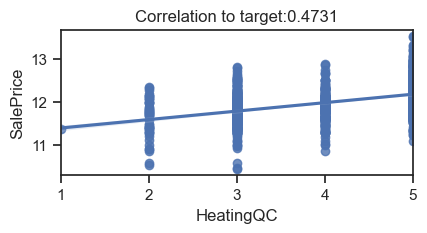

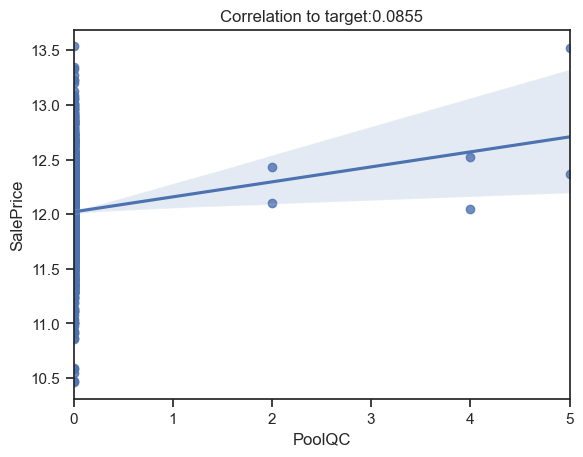

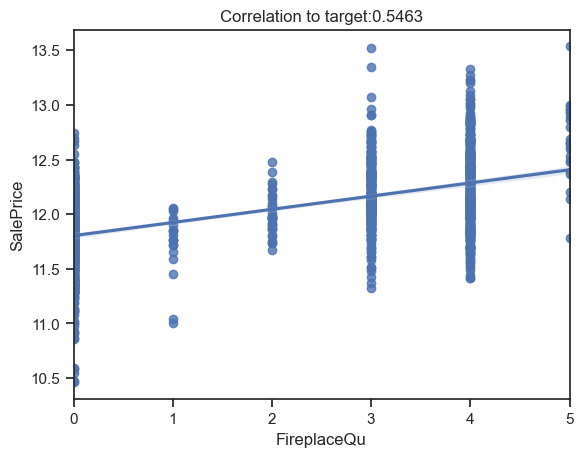

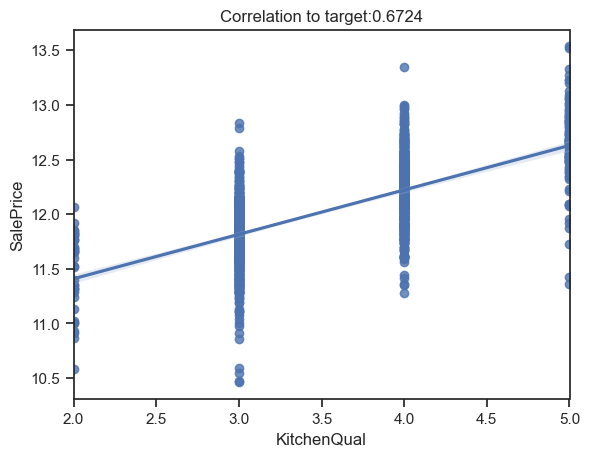

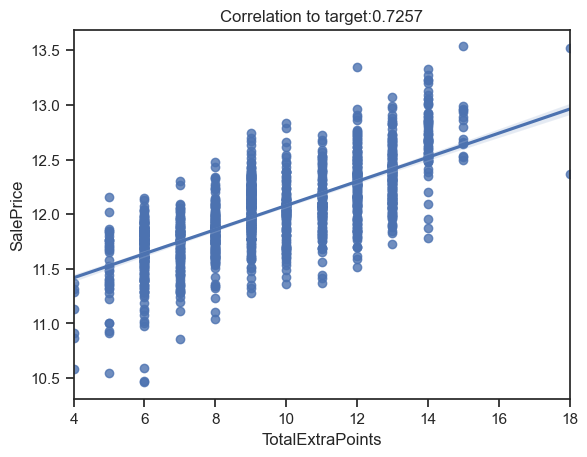

In [255]:
##Analisis gráfico y de correlación...
col_extra = ["HeatingQC",  "PoolQC",  "FireplaceQu",   "KitchenQual", "TotalExtraPoints"]
plot_vars(col_extra, df, "SalePrice")

##Se ve que extrapoints aporta una mayor correlación que todos los feats individuales

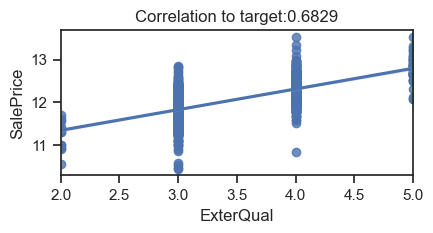

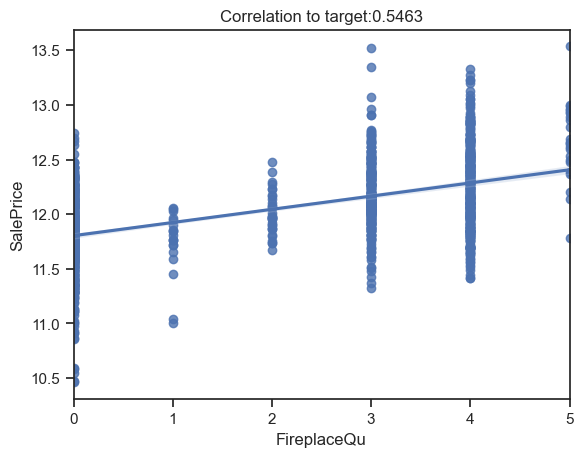

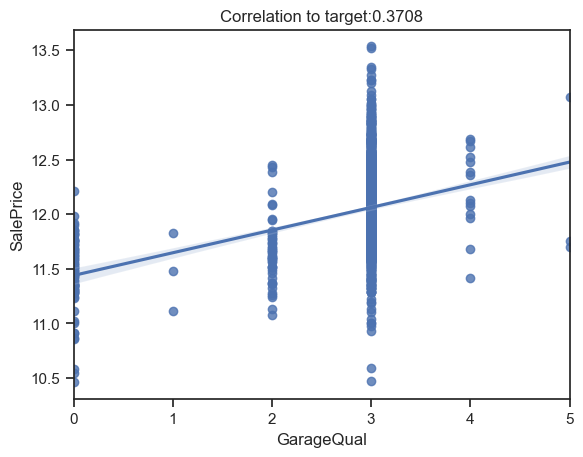

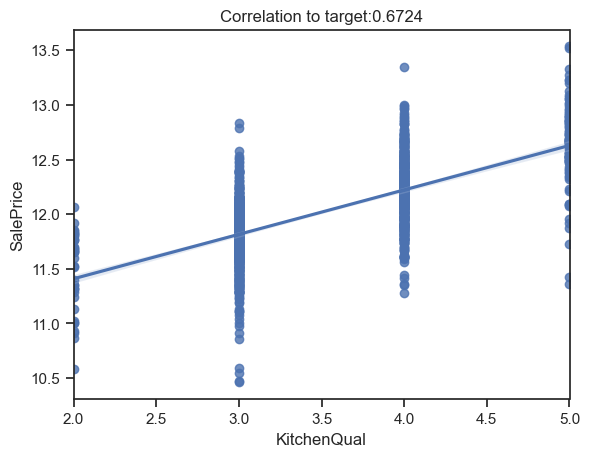

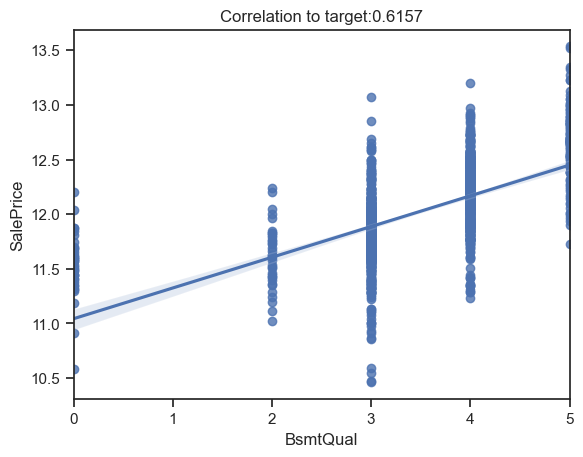

...

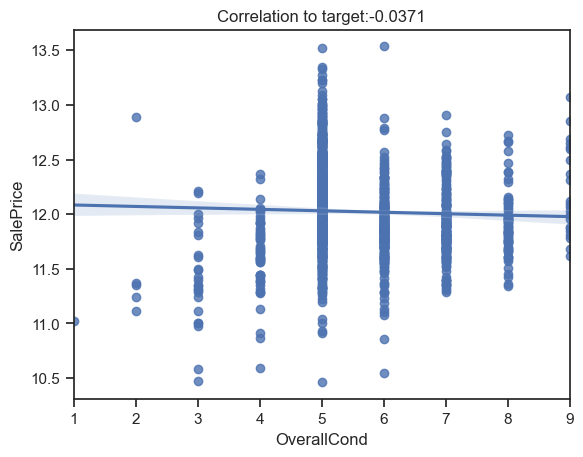

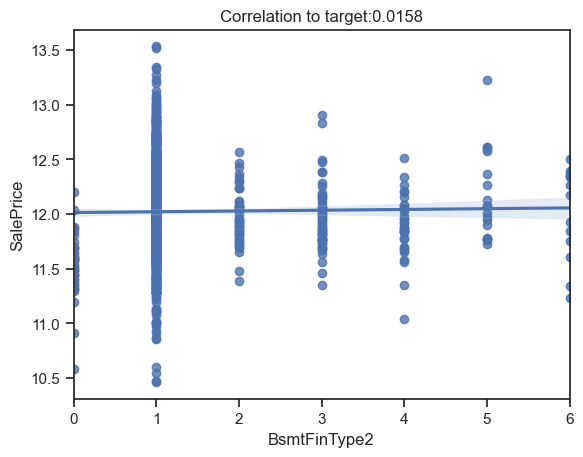

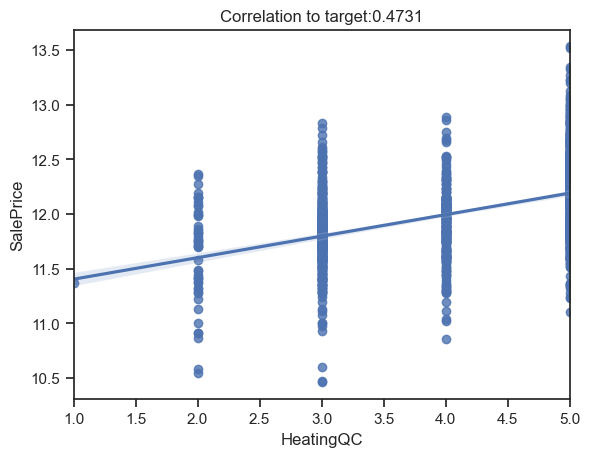

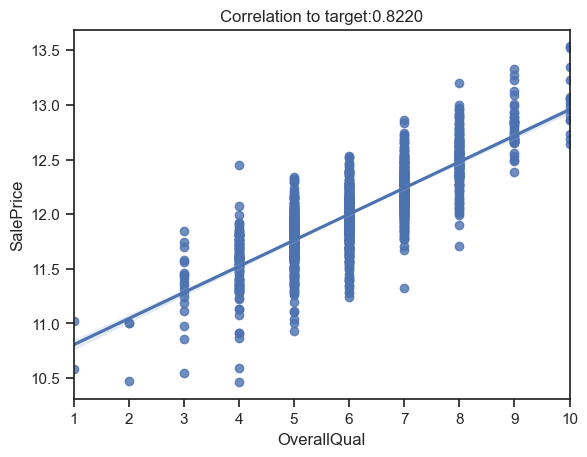

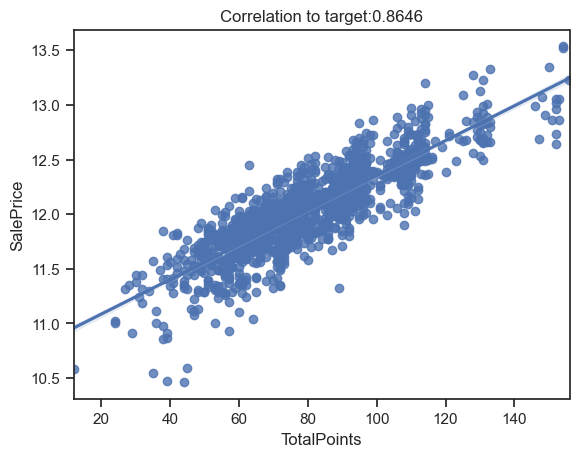

In [256]:
col_total = ["ExterQual" , "FireplaceQu" , "GarageQual" , "KitchenQual" ,
                            "BsmtQual" , "BsmtExposure" , "BsmtFinType1" , "PoolQC" , 
                            "ExterCond" , "BsmtCond" , "GarageCond" , "OverallCond" ,
                            "BsmtFinType2" , "HeatingQC" , "OverallQual", "TotalPoints"]
plot_vars(col_total, df, "SalePrice")

In [257]:
#Total points arroja una bella distribución con una correlación de .84 baja varianza

In [258]:
#Agregamos otros new features que habíamos creado y otros más que se le ocurrieron a Copetition
new_features = ['GarageArea * GarageCars','TotalBsmt * 1stFlrSF','YearBuilt * YearRemodAdd','TotalBathrooms',
 'TotalPorch','Area*Slope']
#Garagearea*Car
all_data["GarageArea_x_Car"] = all_data["GarageArea"] * all_data["GarageCars"]

#TotalBsmtx1stflr
#Antes hay que convertir bsmtsf a int, porque es object
all_data["TotalBsmtSF"] = all_data["TotalBsmtSF"].astype("float64")
all_data["TotalBsmtSF_x_Bsm"] = all_data["TotalBsmtSF"] * all_data["1stFlrSF"]

In [259]:
all_data["TotalBsmtSF_x_Bsm"].mean()

1343194.348349381

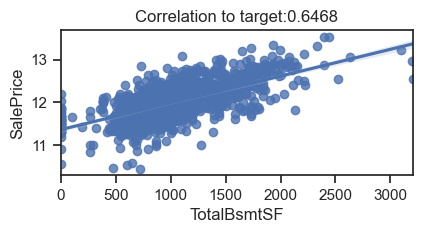

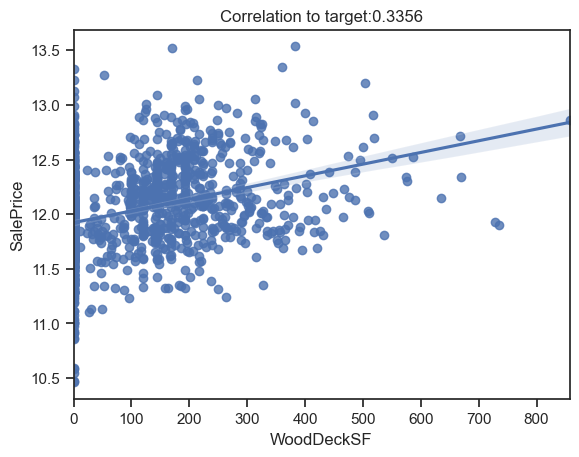

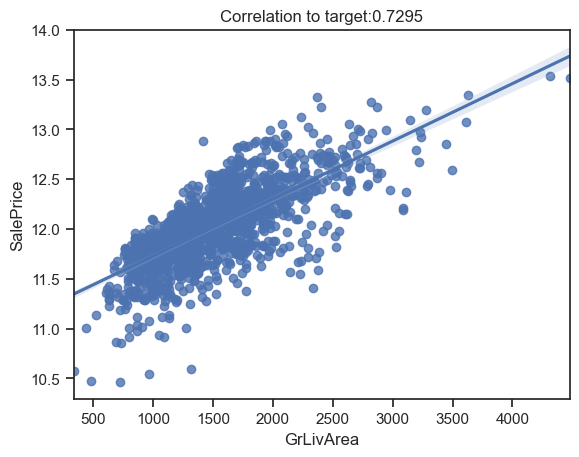

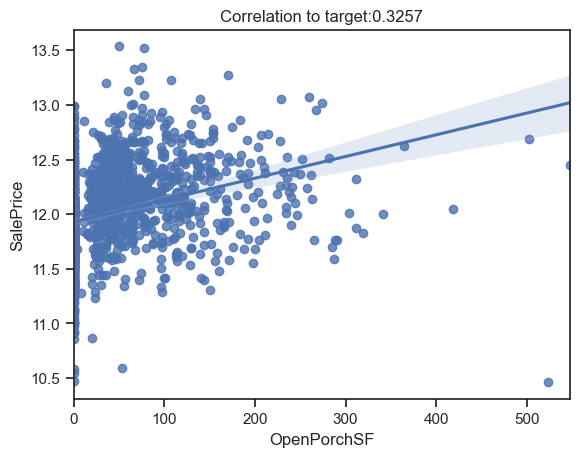

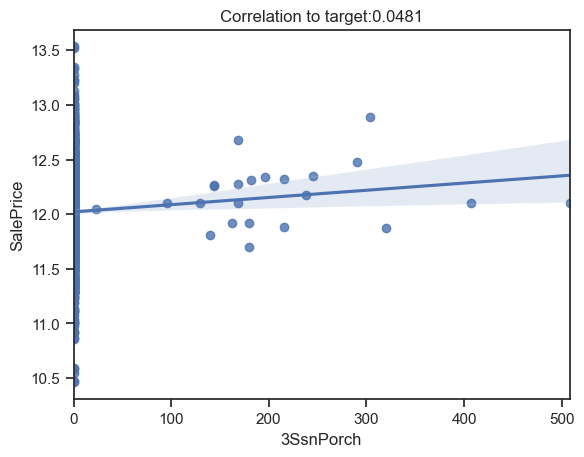

...

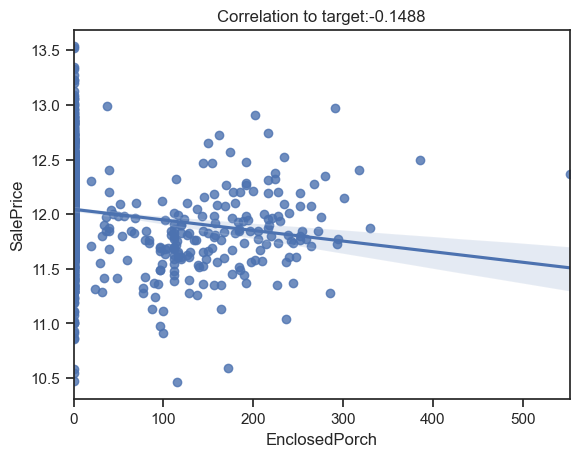

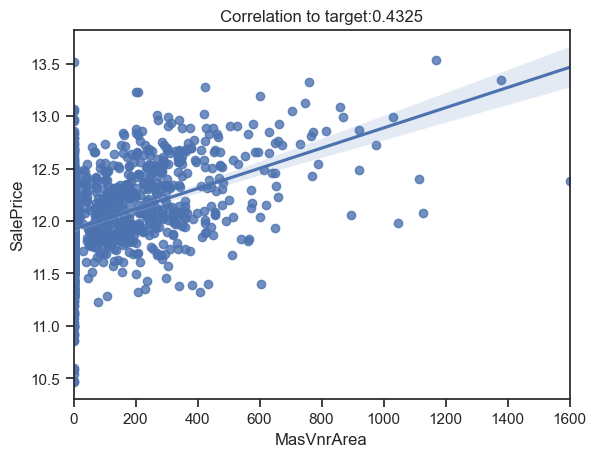

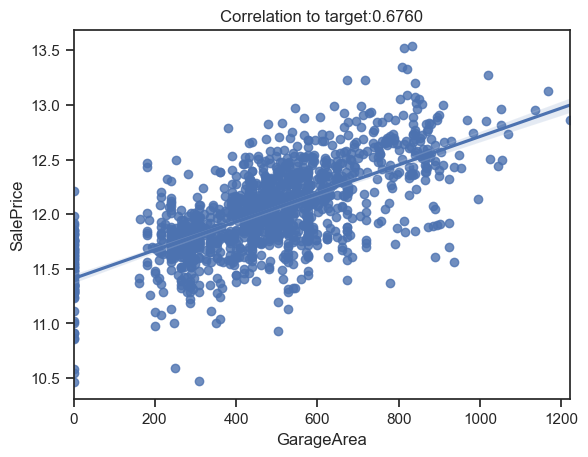

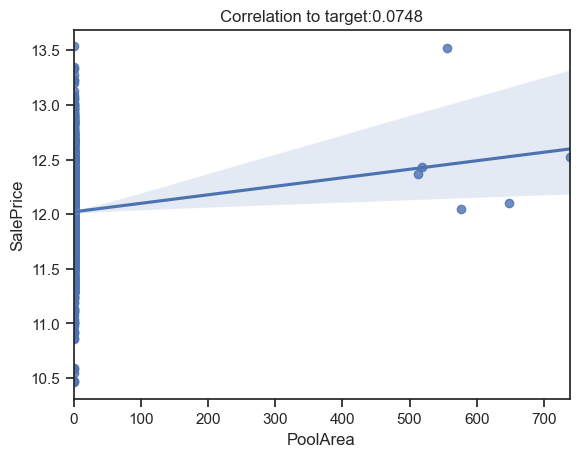

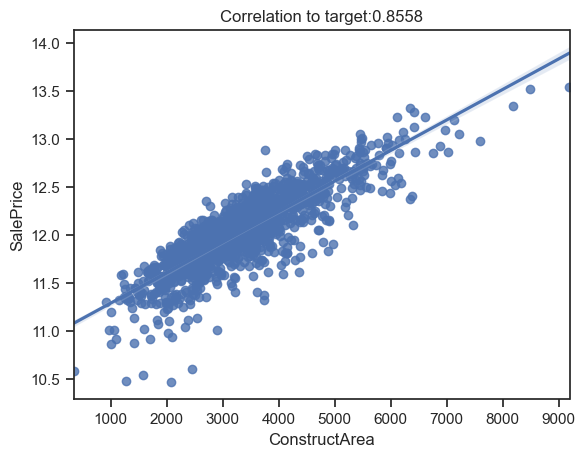

In [260]:
#Se crea un feature de area total de construccion
#Antes hay que convertir bsmtsf a int, porque es object
all_data["TotalBsmtSF"] = all_data["TotalBsmtSF"].astype("float64")
all_data['ConstructArea'] = (all_data.TotalBsmtSF + all_data.WoodDeckSF + all_data.GrLivArea +
                             all_data.OpenPorchSF + all_data["3SsnPorch"] + all_data.ScreenPorch + all_data.EnclosedPorch +
                             all_data.MasVnrArea + all_data.GarageArea + all_data.PoolArea )


#Testeamos qué tal se comporta...
df = all_data.iloc[:len(y_train), :]
df["SalePrice"] = y_train
col_const = ["TotalBsmtSF" , "WoodDeckSF" , "GrLivArea" ,
                             "OpenPorchSF" , "3SsnPorch" , "ScreenPorch" , "EnclosedPorch" ,
                             "MasVnrArea" , "GarageArea" , "PoolArea", "ConstructArea" ]
plot_vars(col_const, df, "SalePrice")


In [261]:
#3Muy buena correlacion de 0.86 en ConstructArea

In [262]:
#TotalPorch
all_data["TotalPorchSF"] =  all_data.OpenPorchSF + all_data.EnclosedPorch + all_data["3SsnPorch"] + all_data.ScreenPorch + all_data.WoodDeckSF

#binarizacion de EnclosedPorch. NO se por qué no se hizo loo mismo con los otros features
all_data["EnclosedPorch"] = all_data["EnclosedPorch"].apply(lambda x: 1 if x else 0)

In [263]:
all_data["ConstructArea"].mean()

3302.5280261348007

In [264]:
#GarageNewest
all_data["Garage_Newest"] = all_data["YearBuilt"] > all_data["GarageYrBlt"]

#Eso me deja en True/False
all_data["Garage_Newest"] = all_data["Garage_Newest"].apply(lambda x: 1 if x else 0) # 1 si es True

In [265]:
all_data["Garage_Newest"].value_counts()

0    2736
1    172 
Name: Garage_Newest, dtype: int64

In [266]:
#LotAreaMultSlope
all_data["LotAreaMultSlope"] = all_data["LotArea"] * all_data["LandSlope"]

In [267]:
#BsmtSFPoints

In [268]:
all_data["BsmtSFPoints"] = all_data["BsmtQual"]**2 + all_data["BsmtCond"] + all_data["BsmtExposure"] + all_data["BsmtFinType1"] + all_data["BsmtFinType2"] 

In [269]:
#['BsmtSFMultPoints']
all_data['BsmtSFMultPoints'] = all_data["TotalBsmtSF"] * (all_data["BsmtQual"]**2 + all_data["BsmtCond"] + all_data["BsmtExposure"] + all_data["BsmtFinType1"] + all_data["BsmtFinType2"] )

In [270]:
#TotalBathrooms
#Antes tengo que convertir dos features a numerico
all_data["BsmtFullBath"] = all_data["BsmtFullBath"].astype("int64")
all_data["BsmtHalfBath"] = all_data["BsmtHalfBath"].astype("int64")

all_data["TotBathrooms"] = all_data["FullBath"] +  all_data["HalfBath"] * 0.5 + all_data["BsmtFullBath"] + all_data["BsmtHalfBath"] * 0.5
##Cambio el type de TotBathrooms porque es int pero debe ser float
all_data["TotBathrooms"] = all_data["TotBathrooms"].astype("float64")

In [271]:
#Binarizacion de todos los bath del feature nuevo anterior
mas_cols  = ["FullBath", "HalfBath", "BsmtFullBath","BsmtHalfBath"]
for c in mas_cols:
    all_data[c] = all_data[c].apply(lambda x: 1 if x else 0)

In [272]:
all_data[mas_cols].head()

,FullBath,HalfBath,BsmtFullBath,BsmtHalfBath
0,1,1,1,0
1,1,0,0,1
2,1,1,1,0
3,1,0,1,0
4,1,1,1,0


In [273]:
##RESUMEN DE NEW FEATURES CREADOS
new_features = ["TotalPoints", "TotalExtraPoints", "GarageArea_x_Car", "TotalBsmtSF_x_Bsm", 'ConstructArea',
               "TotalPorchSF", "Garage_Newest", "LotAreaMultSlope", "BsmtSFPoints",  'BsmtSFMultPoints', "TotBathrooms"]
len(new_features)

11

In [274]:
%store all_data


Stored 'all_data' (DataFrame)


In [275]:
###TEST NULOS
all_data.isnull().sum().sum()

0

In [276]:
all_data.shape

(2908, 89)

In [277]:
###ONE HOT ENCODING

In [278]:
#Chequear qué columnas debo incluir

In [279]:
categ_cols = all_data.select_dtypes(include = "object").columns

In [280]:
categ_cols

Index(['MSZoning', 'Alley', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'Heating', 'Electrical',
       'GarageType', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

In [281]:
##Comparando con las columnas del viejo, debo:
#Transformar a float ['BsmtFinSF2', 'BsmtUnfSF', 'BsmtFinSF1', 'TotalBsmtSF_x_Bsm']
#Agregar y convertir a object ['MoSold', 'MSSubClass']

convert_to_num = ['BsmtFinSF2', 'BsmtUnfSF', 'BsmtFinSF1', 'TotalBsmtSF_x_Bsm']
convert_to_obj = ['MoSold', 'MSSubClass']

for c in convert_to_num:
    all_data[c] = all_data[c].astype("float64")
    
for c in convert_to_obj:
    all_data[c] = all_data[c].astype("object")
    

In [282]:
categ_cols = all_data.select_dtypes(include = "object").columns
len(categ_cols)

23

In [283]:
categ_cols

Index(['MSSubClass', 'MSZoning', 'Alley', 'LandContour', 'LotConfig',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'Foundation', 'Heating', 'Electrical', 'GarageType', 'MiscFeature',
       'MoSold', 'SaleType', 'SaleCondition'],
      dtype='object')

In [284]:
dummy_cols = pd.get_dummies(data = all_data[categ_cols], columns=categ_cols).columns
# all_data = pd.get_dummies(data = all_data, columns=categ_cols, drop_first = True)
all_data = pd.get_dummies(data = all_data, columns=categ_cols)
"""OJO: EL GET_DUMMIES DEBIERA INCLUIR DROP_FIRST = TRUE PERO EL VIEJO LO DEJA PARA DESPUES"""
dummy_cols.shape



(192,)

In [285]:
#Nuevo shape de la data
all_data.shape

(2908, 258)

In [286]:
all_data.head(2)

,LotFrontage,LotArea,Street,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,YrSold,TotalPoints,TotalExtraPoints,GarageArea_x_Car,TotalBsmtSF_x_Bsm,ConstructArea,TotalPorchSF,Garage_Newest,LotAreaMultSlope,BsmtSFPoints,BsmtSFMultPoints,TotBathrooms,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_150,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_NA,Alley_Pave,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,MiscFeature_Gar2,MiscFeature_NA,MiscFeature_Othr,MiscFeature_Pool,MiscFeature_Shed,MoSold_1,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0000,8450,1,4,3,7,5,2003,2003,1

In [287]:
### ANALISIS ESPECIAL: HAY COLUMNAS QUE SUMEN CERO EN TOTAL EN EL TRAIN SET O CERO EN TOTAL EN EL TEST SET? SI ES ASÍ SE ELIMINAN

##Looking out in train set...

dum_z_train = []
for c in list(dummy_cols):
    if c not in all_data.columns:
        pass
    else: 
        if all_data[c][:len(y_train)].sum() == 0:
            dum_z_train.append(c)
print("Columns that sum zero in train set:", dum_z_train)
print("\n")

##Looking out in test set 
dum_z_test = []
for c in dummy_cols:
    if c not in all_data.columns:
        pass
    else:
        
        if all_data[c][len(y_train):].sum() == 0:
           dum_z_test.append(c)
print("Columns that sum zero in test set:", dum_z_test)
        
   

Columns that sum zero in train set: ['MSSubClass_150']


Columns that sum zero in test set: ['Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn', 'HouseStyle_2.5Fin', 'RoofMatl_Membran', 'RoofMatl_Metal', 'RoofMatl_Roll', 'Exterior1st_ImStucc', 'Exterior1st_Stone', 'Exterior2nd_Other', 'Heating_Floor', 'Heating_OthW', 'Electrical_Mix']


In [288]:
##Remove the zero sum dummy cols from dataset
all_data.drop(columns = dum_z_test + dum_z_train, axis = 1, inplace = True)

## Update the dummy_cols:
dummy_cols = dummy_cols.drop((dum_z_test + dum_z_train)) ##dummy_cols es un index


In [289]:
#Updated shape of all_data
all_data.shape

(2908, 244)

In [290]:
%store all_data

Stored 'all_data' (DataFrame)


In [291]:
all_data.isnull().sum().sum()

0

In [292]:
##TRANSFORM YEARS TO AGE: this solves the dilemma of whether years are ordinal or numerical...

#Busquemos todos los features relacionados con year
mas_cols  = all_data.filter(like='Year', axis=1).columns
mas_cols = mas_cols.append(all_data.filter(like='Yr', axis=1).columns)

In [293]:
mas_cols

Index(['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold'], dtype='object')

In [294]:
#Revisando se ve que 2010 es el año más reciente en todos los casos. Además hay valores zero
#Por tanto se convierte a age = 2011 - x si x no es cero y si lo es se deja en zero

for c in mas_cols:
    all_data[c] = all_data[c].apply(lambda x: 0 if x == 0 else 2011 - x)

In [295]:
##Mas features Deus Ex Machina
#[Remod] == indica binariamente si es o no remodelado
#["New"] == binario para ver si es nuevo
#[Age] == edad, entendida como la diferencia entyre remodelado y vendido

#Remod:
all_data["Remod"] = 100
all_data.loc[all_data["YearBuilt"] == all_data["YearRemodAdd"], ["Remod"]] = 0
all_data.loc[all_data["YearBuilt"] != all_data["YearRemodAdd"], ["Remod"]] = 1

#Remod:
all_data["New"] = 100
all_data.loc[all_data["YrSold"] == all_data["YearBuilt"], ["New"]] = 1
all_data.loc[all_data["YrSold"] != all_data["YearBuilt"], ["New"]] = 0

#Age
# all_data["Age"] = all_data["YearRemodAdd"] - all_data["YrSold"]] lo saco porque el viejo no lo usa




In [296]:
all_data.shape

(2908, 246)

In [297]:
##DATA LISTO PARA ANALISIS DE CORRELACION
all_2 = all_data
%store all_data
%store y_train
%store all_2

Stored 'all_data' (DataFrame)
Stored 'y_train' (Series)
Stored 'all_2' (DataFrame)


In [298]:
####ACTUALIZACION DE DATASETS

train = all_data.iloc[:len(y_train), :]
train.shape, y_train.shape
                

((1449, 246), (1449,))

In [299]:
train_2 = all_data.iloc[:len(y_train), :]
y_train_2 = y_train
%store train_2
%store y_train_2

Stored 'train_2' (DataFrame)
Stored 'y_train_2' (Series)


In [300]:
all_2.head(2)

,LotFrontage,LotArea,Street,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,YrSold,TotalPoints,TotalExtraPoints,GarageArea_x_Car,TotalBsmtSF_x_Bsm,ConstructArea,TotalPorchSF,Garage_Newest,LotAreaMultSlope,BsmtSFPoints,BsmtSFMultPoints,TotBathrooms,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_NA,Alley_Pave,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,MiscFeature_Gar2,MiscFeature_NA,MiscFeature_Othr,MiscFeature_Pool,MiscFeature_Shed,MoSold_1,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Remod,New
0,65.0000,8450,1,4,3,7,5,8,8,196.0000,4,3,4,3,1,6,706.0000,1,0.0000,150.0000,856.0000,5,1,856,854,0,1710,1,0,1,1,3,1,4,8,7,0,0,8.0000,2,2.0000,548.0000,3,3,3,0,61,0,0,0,0,0,1,0,3,91,9,1096.0000,732736.0000,3371.0000,61,0,25350,27,23112.0000,3.5000,0,0

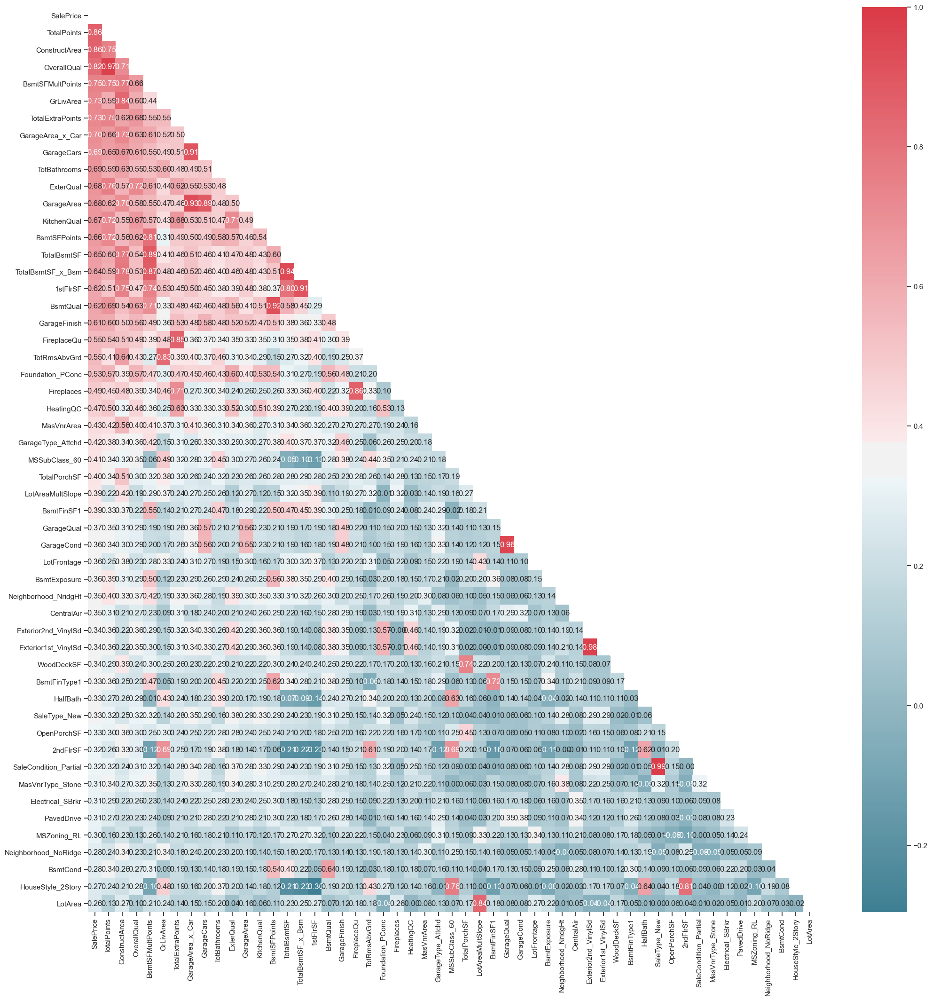

In [301]:
###CHECK THE CORRELATIONS BETWEEN FEATURES

##MODULE FOR PLOTTING A HEATMAP OF CORRELATIONS
#Criteria: we use only those with correlations with target > 0.26 and analize their pairwise correlations

#Create the data for working
data = all_data.iloc[:len(y_train), :]
data["SalePrice"] = y_train

#Creating the correlation data
corr = data.corr()
top_corr_cols = corr[abs((corr.SalePrice) > 0.26)].SalePrice.sort_values(ascending = False).keys() #keys is colmns for Series
top_corr = corr.loc[top_corr_cols, top_corr_cols] #creo una matrix que muestra correlaciones entre los miembros de este subset

#creating the plot
dropSelf = np.zeros_like(top_corr) #crea una matrix de zeros con shape igual a top_corr
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize = (25,25))
sns.heatmap(top_corr, cmap = sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask = dropSelf)
sns.set(font_scale =0.8)
plt.show()

In [302]:
"""LA IDEA ES IR TOMANDO LOS PARES DE FEATURES QUE MUESTREN CORR > 0.75 PARA LUEGO ELIMINARLOS
CON LO QUE SE LLEGA A COLS DE MAS ABAJO. SIN EMBARGO EL VIEJO NO LOS CONSIDERA TODOS EN SU LISTA DE DROPS 
Y ADEMAS AGREGA OTROS QUE NO TIENEN ALTA CORRELACION CON NADIE NI CON EL TARGET(COMO SCREENPORCH). DEUS EX MACHINA"""

cols = ["LotArea", 'LotAreaMultSlope', 'MSSubClass_60', 'HouseStyle_2Story',
        '2ndFlrSF','SaleCondition_Partial','TotalBsmtSF', 'SaleType_New',  
        "Exterior2nd_VinylSd", "GarageArea", "Exterior1st_VinylSd",
        'GarageQual', 'GarageCond','FireplaceQu','Fireplaces',
        'TotRmsAbvGrd',  'GrLivArea', 'TotalExtraPoints',
       'BsmtSFPoints','BsmtQual', 'TotalBsmtSF_x_Bsm', '1stFlrSF',
        'BsmtSFMultPoints','GarageArea_x_Car',
       'GarageCars', 'ExterQual', 'TotalPoints',
       'TotalExtraPoints','OverallQual']

viejo = ['FireplaceQu', 'BsmtSFPoints', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 'OverallQual', 'GrLivArea', 
               'TotalBsmtSF_x_Bsm', '1stFlrSF', 'PoolArea', 'LotArea', 'SaleCondition_Partial', 'Exterior1st_VinylSd',
               'GarageCond', 'HouseStyle_2Story', 'BsmtSFMultPoints', 'ScreenPorch', 'LowQualFinSF', 'BsmtFinSF2',
               '3SsnPorch']

col_test = ["LotArea", 'LotAreaMultSlope', 'MSSubClass_60', 'HouseStyle_2Story',
        '2ndFlrSF','SaleCondition_Partial','TotalBsmtSF', 'SaleType_New',  
        "Exterior2nd_VinylSd", "GarageArea", "Exterior1st_VinylSd",
        'GarageQual', 'GarageCond','FireplaceQu','Fireplaces',
        'TotRmsAbvGrd',  "GrLivArea",
       'BsmtSFPoints','BsmtQual', 'TotalBsmtSF_x_Bsm', '1stFlrSF',
        'BsmtSFMultPoints','GarageArea_x_Car',
       'GarageCars', 'ExterQual','OverallQual']


In [303]:
#En fin, hacemos una primera eliminación de pares con alta correlación:
all_data.drop(columns= viejo, axis = 1, inplace = True)
all_data.shape

(2908, 226)

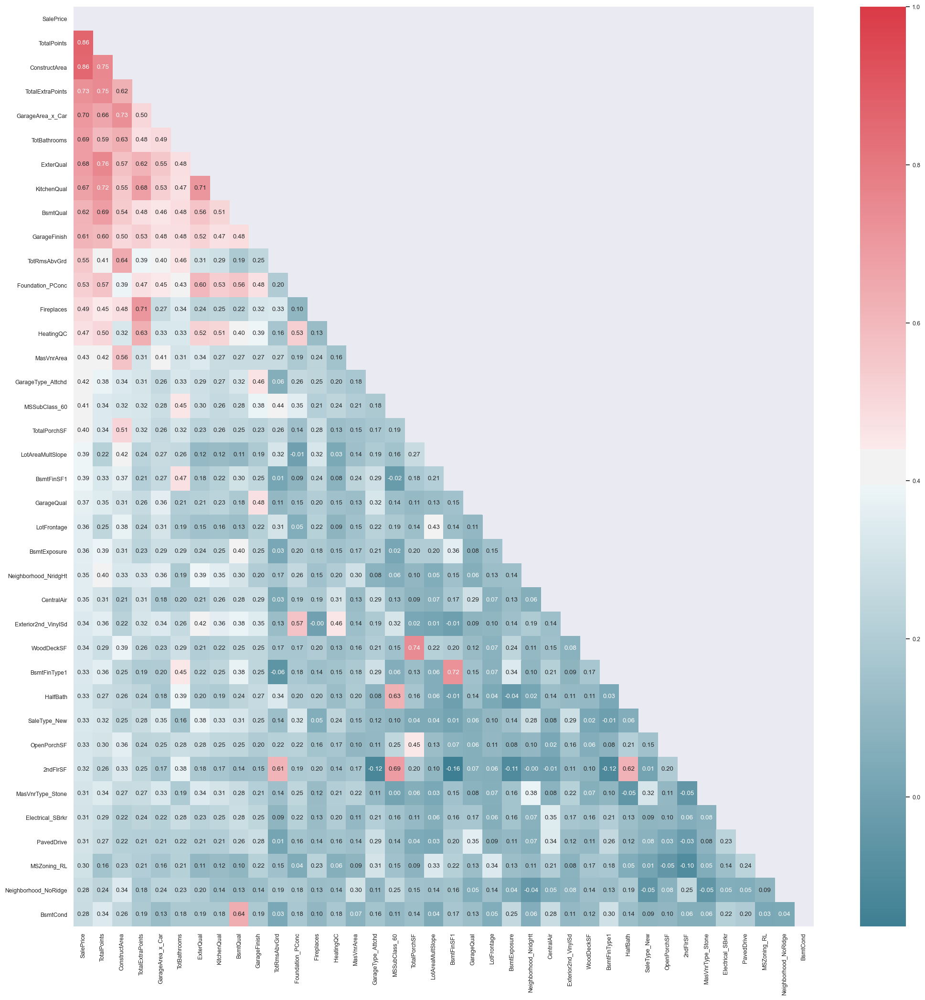

In [304]:
##Volvemos a plotear para ver los cambios...
#Create the data for working
data = all_data.iloc[:len(y_train), :]
data["SalePrice"] = y_train

#Creating the correlation data
corr = data.corr()
top_corr_cols = corr[abs((corr.SalePrice) > 0.26)].SalePrice.sort_values(ascending = False).keys() #keys is colmns for Series
top_corr = corr.loc[top_corr_cols, top_corr_cols] #creo una matrix que muestra correlaciones entre los miembros de este subset

#creating the plot
dropSelf = np.zeros_like(top_corr) #crea una matrix de zeros con shape igual a top_corr
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize = (25,25))
sns.heatmap(top_corr, cmap = sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask = dropSelf)
sns.set(font_scale =0.8)
plt.show()

In [305]:
all_data.shape

(2908, 226)

In [306]:
#####SEGUIMOS AQUI CON MULTICOLLINEARITY PERO ANTES CHEQUEAR QUE ALL_DATA ES EL MISMO QUE EL DEL VIEJO

In [307]:
###AJUSTE PREVIO DE NOMBRE DE FEATURES RESPECTO DEL DATAET DEL VIEJO
%store -r data_viejo

In [308]:
c_v = data_viejo.columns
diferencia = list(set(c_v) - set(all_data.columns))

In [309]:
diferencia


['MSZoning_Call',
 'Exterior2nd_WdShng',
 'HouseStyle_15Fin',
 'SalePrice',
 'HouseStyle_25Unf',
 'IsNew',
 'Exterior1st_WdSdng',
 'Exterior2nd_BrkCmn',
 'Exterior2nd_WdSdng',
 'RoofMatl_TarGrv',
 'HouseStyle_15Unf']

In [310]:
for v in c_v:
    if v not in all_data.columns:
        print(v)

SalePrice
MSZoning_Call
HouseStyle_15Fin
HouseStyle_15Unf
HouseStyle_25Unf
RoofMatl_TarGrv
Exterior1st_WdSdng
Exterior2nd_BrkCmn
Exterior2nd_WdSdng
Exterior2nd_WdShng
IsNew


In [311]:
filt = all_data.filter(like="HouseS", axis=1).columns
filt

Index(['HouseStyle_1.5Fin', 'HouseStyle_1.5Unf', 'HouseStyle_1Story',
       'HouseStyle_2.5Unf', 'HouseStyle_SFoyer', 'HouseStyle_SLvl'],
      dtype='object')

In [312]:
##Hacemos un rename para que los nombres de las columnas sean como los del viejo...
all_data.rename(columns={'3SsnPorch':'TSsnPorch', 'RoofMatl_Tar&Grv':"RoofMatl_TarGrv",
                        'MSZoning_C (all)':"MSZoning_Call", "HouseStyle_1.5Fin": "HouseStyle_15Fin",
                        'HouseStyle_1.5Unf': "HouseStyle_15Unf", 'HouseStyle_2.5Unf':"HouseStyle_25Unf",
                        'RoofMatl_Tar&Grv':"RoofMatl_TarGrv",'Exterior1st_Wd Sdng': "Exterior1st_WdSdng",
                       'Exterior2nd_Brk Cmn':"Exterior2nd_BrkCmn",'Exterior2nd_Wd Sdng':"Exterior2nd_WdSdng",
                        'Exterior2nd_Wd Shng':"Exterior2nd_WdShng","New": "IsNew" }, inplace=True)


In [313]:
data_viejo.shape, all_data.shape #calzan, porque l viejo tieni incluido al target

((2908, 227), (2908, 226))

In [314]:
%store all_data

Stored 'all_data' (DataFrame)


In [315]:
###MULTICOLLINEARITY: IDENTIFICATION AND TREATMENT



In [316]:
##El método de más abajo tira error de sintaxis con el feature 2ndFlrSF porque empieza con 2 (parece),así que rename

all_data.rename(columns={'2ndFlrSF':'SndFlrSF'}, inplace=True)

In [317]:
##Creo un dataset especial para trabajar este análisis
data_m = all_data.iloc[:len(y_train), :]

In [318]:
data_m.head()

,LotFrontage,Street,LotShape,LandSlope,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,HeatingQC,CentralAir,SndFlrSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageQual,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,PoolQC,Fence,MiscVal,YrSold,TotalPoints,TotalExtraPoints,GarageArea_x_Car,ConstructArea,TotalPorchSF,Garage_Newest,LotAreaMultSlope,TotBathrooms,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_Call,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_NA,Alley_Pave,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_15Fin,HouseStyle_15Unf,HouseStyle_1Story,HouseStyle_25Unf,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_TarGrv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_WdSdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_BrkCmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_WdSdng,Exterior2nd_WdShng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,MiscFeature_Gar2,MiscFeature_NA,MiscFeature_Othr,MiscFeature_Pool,MiscFeature_Shed,MoSold_1,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,Remod,IsNew
0,65.0000,1,4,3,5,8,8,196.0000,4,3,4,3,1,6,706.0000,1,150.0000,5,1,854,1,0,1,1,3,1,4,8,7,0,8.0000,2,3,3,0,61,0,0,1,0,3,91,9,1096.0000,3371.0000,61,0,25350,3.5000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
1,8

In [319]:
###MULTICOLLINEARITY TREATMENT
"""Se trabajará con un módulo que calcula y rankea según VIF"""

def VRF(target_name, data, y): 
    """toma dataset y devuelven un dataframe 
    con los vifs ordenados"""
    
    #Creamos el dataframe con data escalada que sirve de input para dmatrices
    scale = StandardScaler(with_std= False) #we scale data previuously using z = (x - u) / s. with:_std es falso porque no es 1
    df = pd.DataFrame(scale.fit_transform(data), columns = cols) #cols: todos los names of predictors
    df["SalePrice"] = y.values
    
    #Hacemos una regression usando el sistema dmatrices, de donde obtenemos x e y
    features = "+".join(cols) #crea un string de todos los nombres con un + entre cada uno
    y, X = dmatrices(target_name +  '~' + features, data = df, return_type= "dataframe")
    
    #Calculamos los VIF for each feature usando como input x,y
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["Features"] = X.columns
    
    #Show
    display(vif.sort_values("VIF Factor"))
    
    return vif


    

In [320]:

cols = all_data.columns

vif = VRF('SalePrice', data_m[cols], y_train)


,VIF Factor,Features
0,1.0000,Intercept
41,1.2669,YrSold
39,1.4620,Fence
22,1.5292,BsmtHalfBath
10,1.5301,ExterCond
29,1.5534,Functional
120,1.5725,Condition2_PosN
2,1.5820,Street
23,1.6443,FullBath
3,1.7333,LotShape


In [321]:
##Eliminamos de las columnas un feature por cada categoría que tiene un vif = inf
vif.loc[vif["VIF Factor"] >20000]

,VIF Factor,Features
50,inf,MSSubClass_20
51,inf,MSSubClass_30
52,inf,MSSubClass_40
53,inf,MSSubClass_45
54,inf,MSSubClass_50
55,inf,MSSubClass_60
56,inf,MSSubClass_70
57,inf,MSSubClass_75
58,inf,MSSubClass_80
59,inf,MSSubClass_85


In [322]:
#Eliminamos

cols = cols.drop(['Condition1_PosN', 'Neighborhood_NWAmes', 'Exterior1st_CBlock', 'BldgType_1Fam', 'RoofStyle_Flat',
                  'MSZoning_Call', 'Alley_Grvl', 'LandContour_Bnk', 'LotConfig_Corner', 'GarageType_2Types', 'MSSubClass_45',
                  'MasVnrType_BrkCmn', 'Foundation_CBlock', 'MiscFeature_Gar2', 'SaleType_COD', 'Exterior2nd_CBlock'])

#Repetimos el procedimiento...

vif = VRF('SalePrice', data_m[cols], y_train)


,VIF Factor,Features
0,1.0000,Intercept
165,1.1905,Foundation_Wood
197,1.1958,SaleType_Con
202,1.2164,SaleType_Oth
75,1.2220,LotConfig_FR3
107,1.2354,Condition1_RRNe
196,1.2559,SaleType_CWD
41,1.2653,YrSold
78,1.2734,Neighborhood_Blueste
199,1.2773,SaleType_ConLI


In [323]:
##Vuelve a haber inf. Repetimos pero también agregamos otros que tienen sobre 12 de vif, uno por categoría
#desde abajo
##PARA VARIAR EL VIEJO SE SALTA ALGUNOS FEATURES POR CONVENIENCIA
cols = cols.drop(['PoolQC', 'BldgType_TwnhsE', 'BsmtFinSF1', 'BsmtUnfSF', 'Electrical_SBrkr', 'Exterior1st_MetalSd',
                  'Exterior2nd_VinylSd', 'GarageQual', 'GarageType_Attchd', 'HouseStyle_1Story', 'MasVnrType_None',
                  'MiscFeature_NA', 'MSZoning_RL', 'RoofStyle_Gable', 'SaleCondition_Normal', 'MoSold_10',
                  'SaleType_New', 'SndFlrSF', 'TotalPorchSF', 'WoodDeckSF', 'BldgType_Duplex', 'MSSubClass_90'])

##REPETIMOS EL PROCEDIMIENTO
vif = VRF('SalePrice', data_m[cols], y_train)

,VIF Factor,Features
0,1.0000,Intercept
186,1.1342,SaleCondition_Family
177,1.1505,SaleType_Con
181,1.1622,SaleType_Oth
179,1.1668,SaleType_ConLI
149,1.1687,Foundation_Wood
176,1.1746,SaleType_CWD
66,1.2129,LotConfig_FR3
35,1.2286,YrSold
98,1.2289,Condition1_RRNe


In [324]:
##Ahora tenemos controlados los vif del dataset estudiado
####SE GUARDAN EN COLS LOS FEATURES SELECCIONADOS LUEGO DEL DESCARTE DEL PROCESO VIF



In [325]:
###CONVERTIR ALGUNOS ORDINAL/NOMINAL FEATURES AL UINT8 DATATYPE. No se entiende la explicación del viejo
#acerca de por qué hacerlo, pero indica que de esa manera los modelos procesan correctamente los valores de éstos


all_data.CentralAir = all_data.CentralAir.astype('uint8')
all_data.Garage_Newest = all_data.Garage_Newest.astype('uint8')
all_data.EnclosedPorch = all_data.EnclosedPorch.astype('uint8')
all_data.FullBath = all_data.FullBath.astype('uint8')
all_data.HalfBath = all_data.HalfBath.astype('uint8')
all_data.BsmtFullBath = all_data.BsmtFullBath.astype('uint8')
all_data.BsmtHalfBath = all_data.BsmtHalfBath.astype('uint8')
all_data.Remod = all_data.Remod.astype('uint8')
all_data.IsNew = all_data.IsNew.astype('uint8') 
all_data.Street = all_data.Street.astype('uint8') # ordinal
all_data.PavedDrive = all_data.PavedDrive.astype('uint8') # ordinal
all_data.Functional = all_data.Functional.astype('uint8') # ordinal
all_data.LandSlope = all_data.LandSlope.astype('uint8') # ordinal

In [326]:
##BOX COX TRANSFORMATION OF THE HIGHLY SKEWED FEATURES

In [327]:
%store cols
%store all_data

Stored 'cols' (Index)
Stored 'all_data' (DataFrame)


In [328]:
###treatment of skewed features

#Seleccionamos los numeric features only (usamos cols porque esos son los feats que quedaron)
numeric_features = all_data.loc[:, list(cols)].dtypes[(all_data.dtypes != "category") & (all_data.dtypes != "uint8")].index

# #Calculamos los skewes y los ordenamos...
skewed_features = all_data[numeric_features].apply(lambda x: skew(x.dropna())).sort_values(ascending =False)

#Seleccionamos los que tengan un abs(skew) >0.7
skewed_max = pd.DataFrame({"Skew": skewed_features})
skewed_max  = skewed_max[abs(skewed_max["Skew"]) > 0.7]
skewed_max.dropna()

#Aplicamos ahora la BoxCox transformation
l_opt = {}
for f in skewed_max.index:
    all_data[f], l_opt[f] = boxcox((all_data[f] + 1))
    
#Checking the results...

skewed_features_2 = all_data[numeric_features].apply(lambda x: skew(x.dropna())).sort_values(ascending =False)
sk_2 = pd.DataFrame({"Skew_before":skewed_features, "Skew_after": skewed_features_2})
sk_2 = sk_2[abs(sk_2["Skew_before"]) > 0.7].sort_values(by = "Skew_before", ascending = False)
sk_2

,Skew_before,Skew_after
MiscVal,21.7498,4.7723
KitchenAbvGr,4.3485,-2.0594
LotAreaMultSlope,3.4938,0.1363
BsmtFinType2,3.1472,-0.4339
MasVnrArea,2.6218,0.4568
OpenPorchSF,2.5290,-0.0250
Fence,1.7514,1.5327
GarageArea_x_Car,1.3543,-0.1323
ExterCond,1.3130,-0.0363
LotFrontage,1.2307,0.1710


In [329]:
"""Casi todos los features quedaron con un skew aceptable y cercano al normal, aunque los dos primeros
todavía se ven flojos. Una análisis útil para ver cómo quedan y si aúns e pueden abordar con ajustes discretos
es el análisis gráfico: QQPlot y Density Plot"""

'Casi todos los features quedaron con un skew aceptable y cercano al normal, aunque los dos primeros\ntodavía se ven flojos. Una análisis útil para ver cómo quedan y si aúns e pueden abordar con ajustes discretos\nes el análisis gráfico: QQPlot y Density Plot'

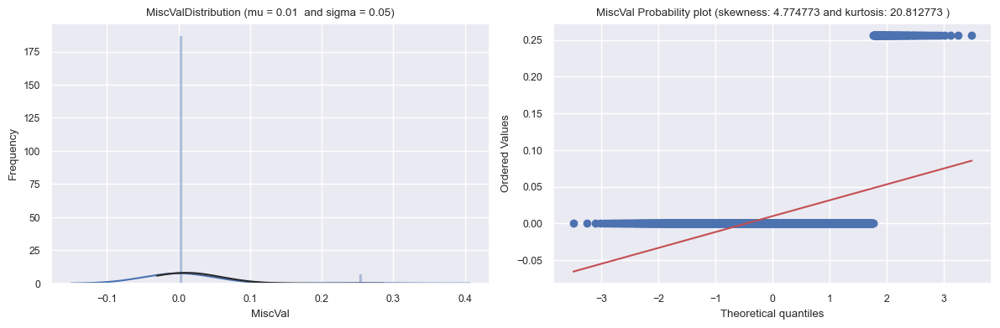

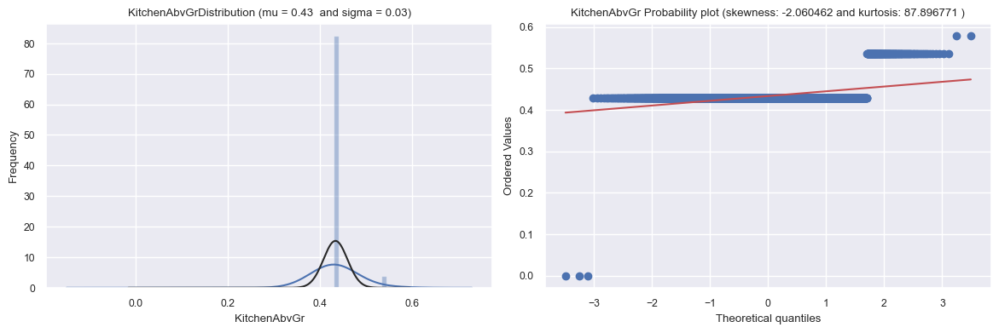

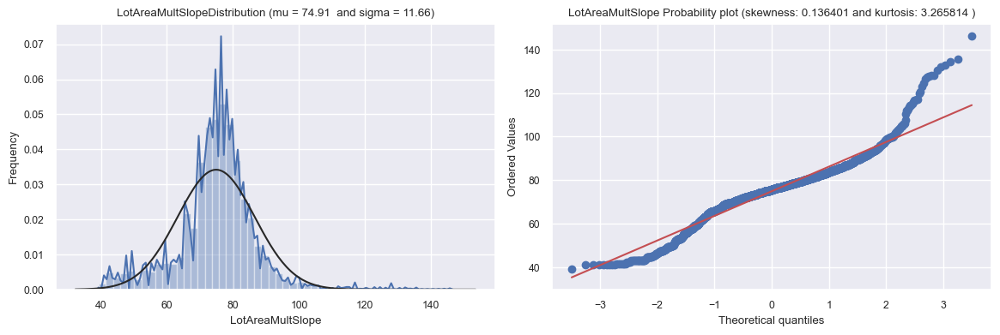

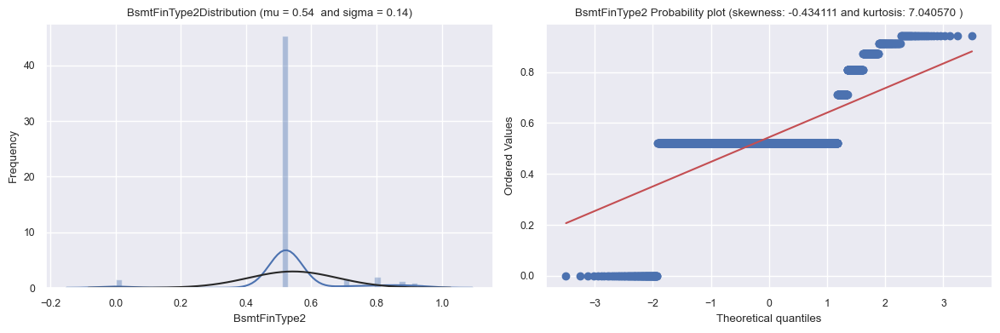

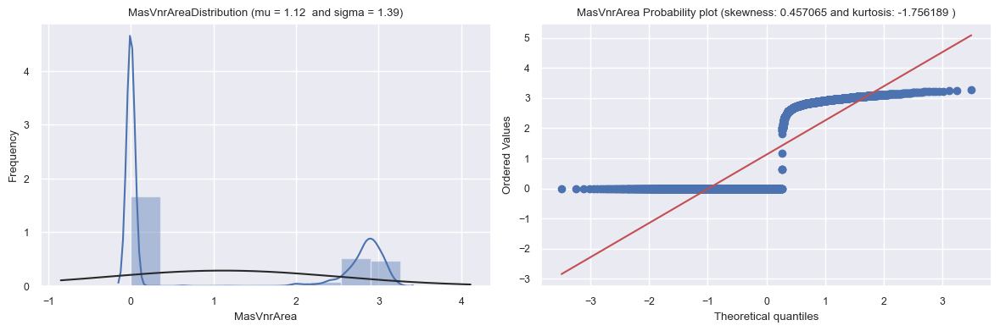

...

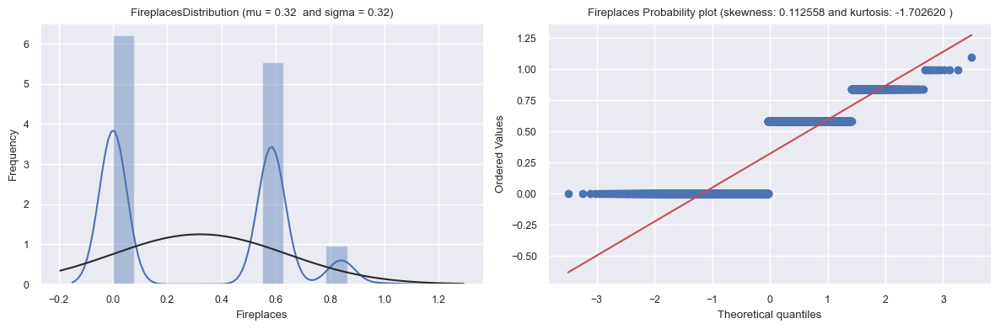

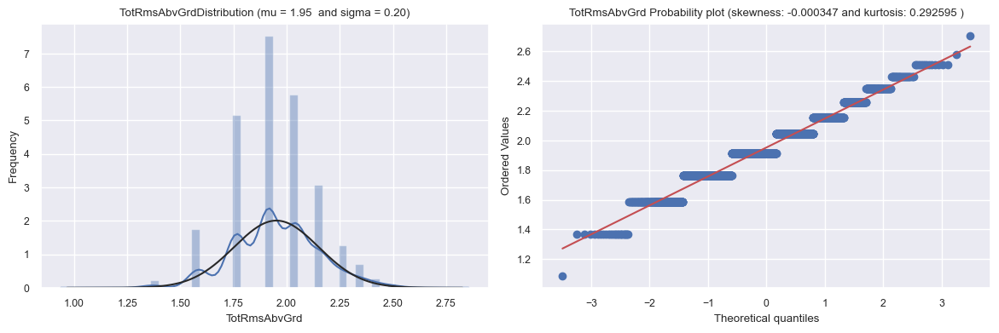

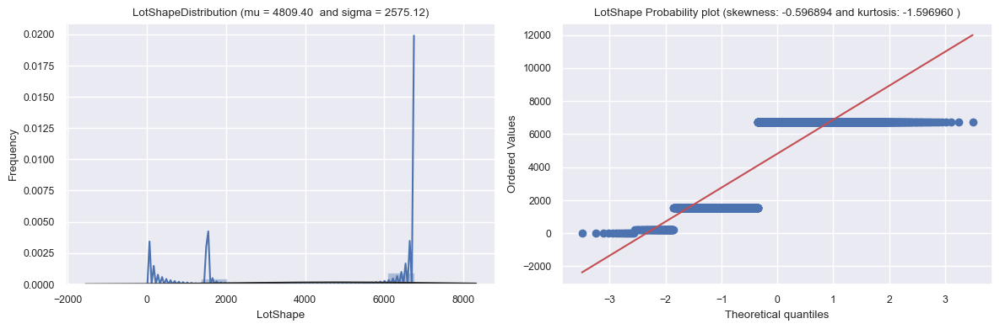

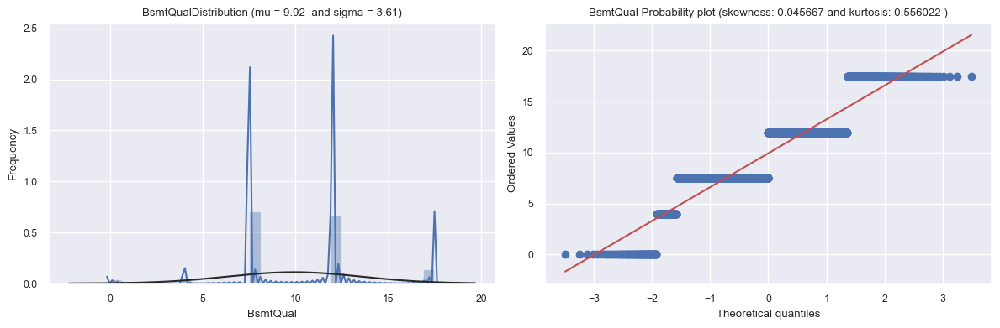

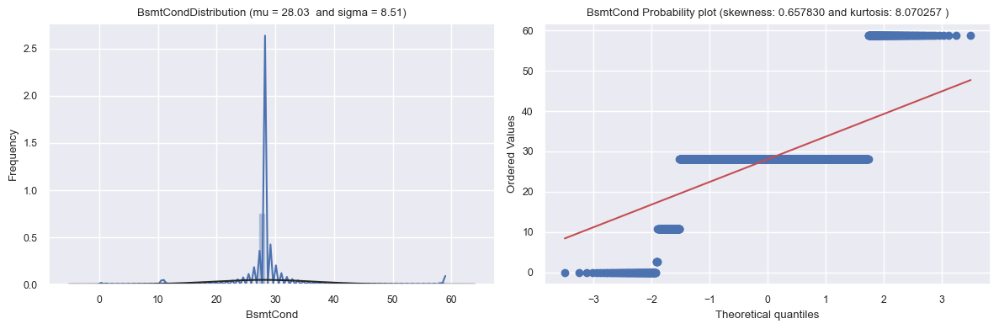

In [330]:
##EVALUACION GRÁFICA DE LOS FEATURES TRANSFORMADOS

"""Método para plotear los features"""

def QQ_plot(data, feature_name):
    #Setting the canvas
    fig = plt.figure(figsize = (12,4))
    
    #Fit the parameters (estimates the parameters of the function)
    (mu, sigma) = norm.fit(data)
    
    #Plots the kernel density plot KD for the feature
    fig1 = fig.add_subplot(121) # una fila con 2 plots, empezando con el 1
    sns.distplot(data, fit = norm,  hist=True, kde_kws={'bw':0.05})
     

#     sns.distplot(data , fit = norm)
    fig1.set_title(feature_name + "Distribution (mu = {:.2f}  and sigma = {:.2f})".format(mu,sigma), loc = "center")
    fig1.set_xlabel(feature_name)
    fig1.set_ylabel("Frequency")
    
    #Plots de qq-plot
    fig2 = fig.add_subplot(122) # segundo plot
    res = probplot(data, plot = fig2)
    fig2.set_title(feature_name + " Probability plot (skewness: {:.6f} and kurtosis: {:.6f} )".format(data.skew(), data.kurt()),
                 loc = "center")
    plt.tight_layout()
    
    plt.show()
    
for f in skewed_max.index:
    QQ_plot(all_data[f], f)

In [331]:
"""Puede verse que KitchenAbvGr y MiscVal siguen mostrando un alto skewness. Las otras variables muestran mejorías
importantes en sus skewness y en general también en sus kurtosis"""

'Puede verse que KitchenAbvGr y MiscVal siguen mostrando un alto skewness. Las otras variables muestran mejorías\nimportantes en sus skewness y en general también en sus kurtosis'

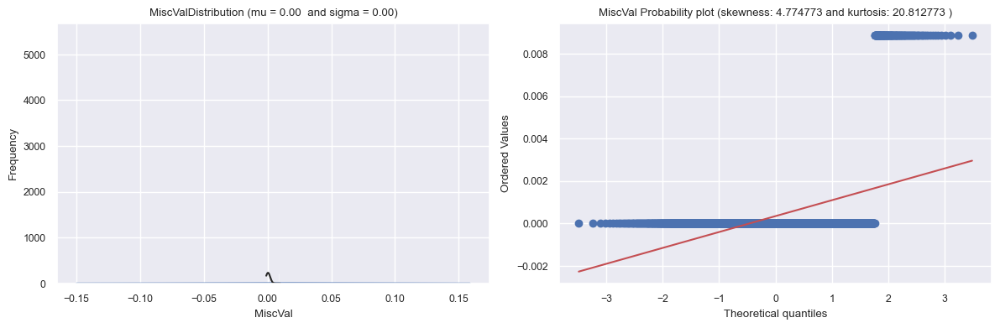

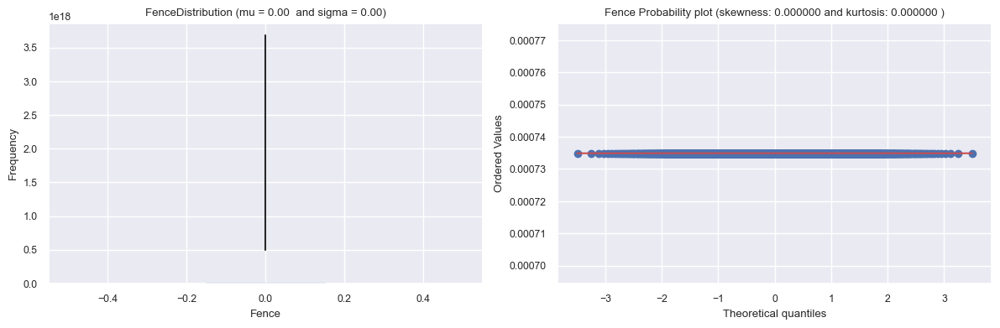

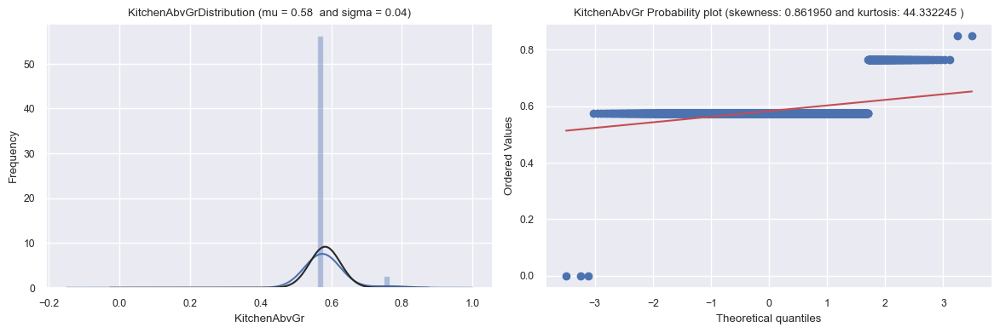

'Puede verse que KitchenAbvGr y MiscVal siguen mostrando un alto skewness. Las otras variables muestran mejorías\nimportantes en sus skewness y en general también en sus kurtosis'

In [332]:
###treatment of skewed features

#Seleccionamos los numeric features only (usamos cols porque esos son los feats que quedaron)
numeric_features = all_data.loc[:, list(cols)].dtypes[(all_data.dtypes != "category") & (all_data.dtypes != "uint8")].index

# #Calculamos los skewes y los ordenamos...
skewed_features = all_data[numeric_features].apply(lambda x: skew(x.dropna())).sort_values(ascending =False)

#Seleccionamos los que tengan un abs(skew) >0.7
skewed_max = pd.DataFrame({"Skew": skewed_features})
skewed_max  = skewed_max[abs(skewed_max["Skew"]) > 0.7]
skewed_max.dropna()

#Aplicamos ahora la BoxCox transformation
l_opt = {}
for f in skewed_max.index:
    all_data[f], l_opt[f] = boxcox((all_data[f] + 1))
    
#Checking the results...

skewed_features_2 = all_data[numeric_features].apply(lambda x: skew(x.dropna())).sort_values(ascending =False)
sk_2 = pd.DataFrame({"Skew_before":skewed_features, "Skew_after": skewed_features_2})
sk_2 = sk_2[abs(sk_2["Skew_before"]) > 0.7].sort_values(by = "Skew_before", ascending = False)
sk_2

"""Casi todos los features quedaron con un skew aceptable y cercano al normal, aunque los dos primeros
todavía se ven flojos. Una análisis útil para ver cómo quedan y si aúns e pueden abordar con ajustes discretos
es el análisis gráfico: QQPlot y Density Plot"""

##EVALUACION GRÁFICA DE LOS FEATURES TRANSFORMADOS

"""Método para plotear los features"""

def QQ_plot(data, feature_name):
    #Setting the canvas
    fig = plt.figure(figsize = (12,4))
    
    #Fit the parameters (estimates the parameters of the function)
    (mu, sigma) = norm.fit(data)
    
    #Plots the kernel density plot KD for the feature
    fig1 = fig.add_subplot(121) # una fila con 2 plots, empezando con el 1
    sns.distplot(data, fit = norm,  hist=True, kde_kws={'bw':0.05})
     

#     sns.distplot(data , fit = norm)
    fig1.set_title(feature_name + "Distribution (mu = {:.2f}  and sigma = {:.2f})".format(mu,sigma), loc = "center")
    fig1.set_xlabel(feature_name)
    fig1.set_ylabel("Frequency")
    
    #Plots de qq-plot
    fig2 = fig.add_subplot(122) # segundo plot
    res = probplot(data, plot = fig2)
    fig2.set_title(feature_name + " Probability plot (skewness: {:.6f} and kurtosis: {:.6f} )".format(data.skew(), data.kurt()),
                 loc = "center")
    plt.tight_layout()
    
    plt.show()
    
for f in skewed_max.index:
    QQ_plot(all_data[f], f)

"""Puede verse que KitchenAbvGr y MiscVal siguen mostrando un alto skewness. Las otras variables muestran mejorías
importantes en sus skewness y en general también en sus kurtosis"""

In [333]:
##POLYNOMIAL FEATURES ANALYSIS AND CREATION


##ANALIZAR SI ES POSIBLE INCORPORAR POLYNOMIAL FEATURES WITH THE MOST CORRELATED ENIGINEERED FEATURES
"""Para analizar esta posibilidad primero revisamos cómo se comportan los features elegidos 
en relación con la variable target. Para ello ploteamos"""

##Most correlated ENGINEERED features:  ['ConstructArea', 'TotalPoints', 'LotAreaMultSlope',  'GarageArea_x_Car', "TotalExtraPoins"]. 


'Para analizar esta posibilidad primero revisamos cómo se comportan los features elegidos \nen relación con la variable target. Para ello ploteamos'

In [334]:
pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1).corr().SalePrice.sort_values(ascending = False)

SalePrice               1.0000 
TotalPoints             0.8646 
ConstructArea           0.8575 
TotalExtraPoints        0.7257 
GarageArea_x_Car        0.7061 
TotBathrooms            0.6852 
ExterQual               0.6755 
KitchenQual             0.6724 
BsmtQual                0.6629 
GarageFinish            0.6092 
TotRmsAbvGrd            0.5485 
Foundation_PConc        0.5307 
Fireplaces              0.5139 
HeatingQC               0.4731 
OpenPorchSF             0.4614 
LotAreaMultSlope        0.4278 
GarageType_Attchd       0.4162 
MSSubClass_60           0.4054 
MasVnrArea              0.4010 
TotalPorchSF            0.3993 
BsmtFinSF1              0.3908 
GarageQual              0.3708 
BsmtExposure            0.3689 
LotFrontage             0.3638 
Neighborhood_NridgHt    0.3528 
CentralAir              0.3524 
Exterior2nd_VinylSd     0.3394 
WoodDeckSF              0.3356 
BsmtFinType1            0.3344 
HalfBath                0.3307 
SaleType_New            0.3279 
SndFlrSF

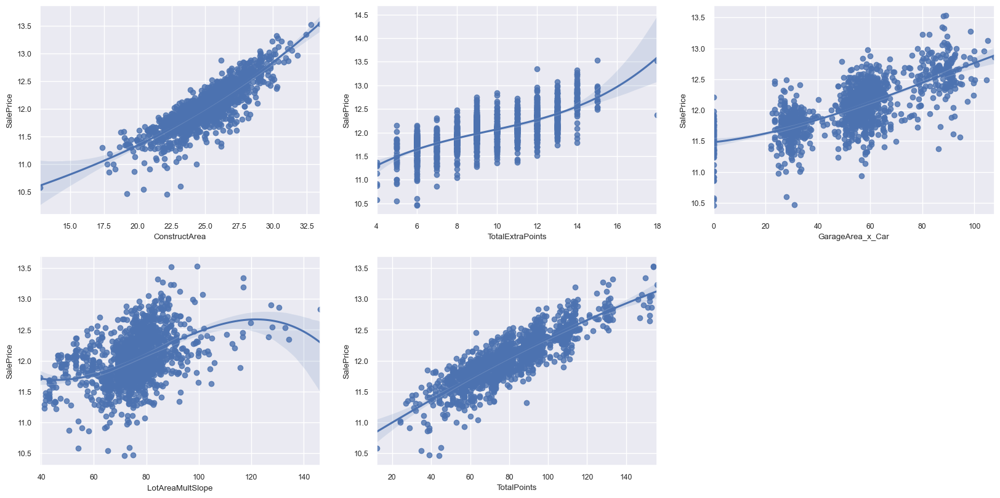

In [335]:
##Ploteamos ahora estos 5 features y vemos su comportamiento.Será lineal??

fig = plt.figure(figsize = (20,15))
ax  = fig.add_subplot(331)
g = sns.regplot(y = "SalePrice", x = "ConstructArea", data = pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1), order = 3 )
ax  = fig.add_subplot(332)
g = sns.regplot(y = "SalePrice", x = "TotalExtraPoints", data = pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1), order = 3)
ax  = fig.add_subplot(333)
g = sns.regplot(y = "SalePrice", x = "GarageArea_x_Car", data = pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1), order = 3)
ax  = fig.add_subplot(334)
g = sns.regplot(y = "SalePrice", x = "LotAreaMultSlope", data = pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1), order = 3)
ax  = fig.add_subplot(335)
g = sns.regplot(y = "SalePrice", x = "TotalPoints", data = pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1), order = 3)


In [336]:
"""Vemos que todos tiene una relación no-lineal con target, lo cual implica que una curva polinomial sería lo más
adecuado para describir la relación de la variable con el target (POLYNOMIAL REGRESSION), ya sea cuadrática, cúbica, etc. Esto implica entonces agregar
nuevos features que son polinomiales.
Más información: https://youtu.be/Qnt2vBRW8Io
https://machinelearningmastery.com/polynomial-features-transforms-for-machine-learning/

Diseñaremos y analizaremos nuevos polynomial features para elegir los que mejor resultado dan (R2). Se deja fuera TotalExtraPoints ya que contiene features que ya están en TotalPoints"""

'Vemos que todos tiene una relación no-lineal con target, lo cual implica que una curva polinomial sería lo más\nadecuado para describir la relación de la variable con el target (POLYNOMIAL REGRESSION), ya sea cuadrática, cúbica, etc. Esto implica entonces agregar\nnuevos features que son polinomiales.\nMás información: https://youtu.be/Qnt2vBRW8Io\nhttps://machinelearningmastery.com/polynomial-features-transforms-for-machine-learning/\n\nDiseñaremos y analizaremos nuevos polynomial features para elegir los que mejor resultado dan (R2). Se deja fuera TotalExtraPoints ya que contiene features que ya están en TotalPoints'

In [337]:
##METODO PARA EVALUAR LOS POLINOMIOS DE COMBINACIONES DE FEATURES

def poly(X, y, feat =""):
    """Recibe X como un feat o varios y genera polinomios, realiza regresiones y evalúa usando R2"""

    #Instanciamos para obtener los cudráticos, cubos, 4 y 5th 
    quadratic = PolynomialFeatures(degree = 2, interaction_only = False, include_bias= False)
    cubic = PolynomialFeatures(degree = 3, interaction_only = False, include_bias= False)
    fourth = PolynomialFeatures(degree = 4, interaction_only = False, include_bias= False)
    fifth = PolynomialFeatures(degree = 5, interaction_only = False, include_bias= False)

    #Creamos ahora los polinomios
    X_quad = quadratic.fit_transform(X)
    X_cubic= cubic.fit_transform(X)
    X_fourth= fourth.fit_transform(X)
    X_fifth = fifth.fit_transform(X)


    #We make the regression on each polynomial and compute R2

    #Linear fit
    regr = LinearRegression()
    regr = regr.fit(X,y)
    y_lin_predict = regr.predict(X)
    linear_r2 = r2_score(y, y_lin_predict)
    
    #Quadratic fit
    regr = regr.fit(X_quad,y)
    y_quad_predict = regr.predict(X_quad)
    quad_r2 = r2_score(y, y_quad_predict)
    
    #Cubic fit
    regr = regr.fit(X_cubic,y)
    y_cubic_predict = regr.predict(X_cubic)
    cubic_r2 = r2_score(y, y_cubic_predict)
    
     #Fourth fit
    regr = regr.fit(X_fourth,y)
    y_fourth_predict = regr.predict(X_fourth)
    fourth_r2 = r2_score(y, y_fourth_predict)
    
     #Fifth fit
    regr = regr.fit(X_fifth,y)
    y_fifth_predict = regr.predict(X_fifth)
    fifth_r2 = r2_score(y, y_fifth_predict)
    

    print("Results:")
    print("Linear:", linear_r2)
    print("Quadratic:", quad_r2)
    print("Cubic:",cubic_r2 )
    print("Fourth:", fourth_r2)
    print("Fifth:", fifth_r2)

    if len(feat)>0:
        fig = plt.figure(figsize=(20,5))
        # Plot lowest Polynomials
        fig1 = fig.add_subplot(121)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        plt.plot(X[feat], y_lin_predict, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=0.5, linestyle=':')
        plt.plot(X[feat], y_quad_predict, label='quadratic (d=2), $R^2=%.3f$' % quad_r2, color='red', lw=0.5, linestyle='-')
        plt.plot(X[feat], y_cubic_predict, label='cubic (d=3), $R^2=%.3f$' % cubic_r2,  color='green', lw=0.5, linestyle='--')

        plt.xlabel(feat)
        plt.ylabel('Sale Price')
        plt.legend(loc='upper left')

        # Plot higest Polynomials
        fig2 = fig.add_subplot(122)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        plt.plot(X[feat], y_lin_predict, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=2, linestyle=':')
        plt.plot(X[feat], y_fifth_predict, label='Fifth (d=5), $R^2=%.3f$' % fifth_r2, color='yellow', lw=2, linestyle='-')
        plt.plot(X[feat], y_fifth_predict, label='Fourth (d=4), $R^2=%.3f$' % fourth_r2, color='red', lw=2, linestyle=':')

        plt.xlabel(feat)
        plt.ylabel('Sale Price')
        plt.legend(loc='upper left')
    else:
        # Plot initialisation
        fig = plt.figure(figsize=(20,10))
        ax = fig.add_subplot(121, projection='3d')
        ax.scatter(X.iloc[:, 0], X.iloc[:, 1], y, s=40)

        # make lines of the regressors:
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_lin_predict, label='linear (d=1), $R^2=%.3f$' % linear_r2, 
                 color='blue', lw=2, linestyle=':')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_quad_predict, label='quadratic (d=2), $R^2=%.3f$' % quad_r2, 
                 color='red', lw=0.5, linestyle='-')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_cubic_predict, label='cubic (d=3), $R^2=%.3f$' % cubic_r2, 
                 color='green', lw=0.5, linestyle='--')
        # label the axes
        ax.set_xlabel(X.columns[0])
        ax.set_ylabel(X.columns[1])
        ax.set_zlabel('Sales Price')
        ax.set_title("Poly up to 3 degree")
        plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()



Results:
Linear: 0.7353418307542654
Quadratic: 0.740781807064326
Cubic: 0.740822773941727
Fourth: 0.740823882158038
Fifth: 0.7408286177794223


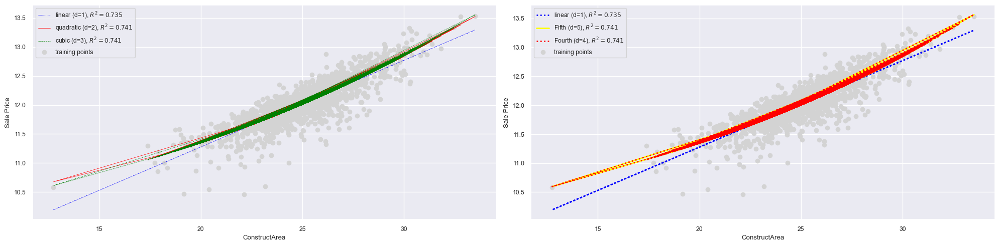

In [338]:
##Para facilitar el ploteo usamos dataset con saleprice
data = pd.concat((all_data.iloc[:len(y_train), :], y_train), axis = 1)
X = data.loc[:, ["ConstructArea"]]

poly(X, y_train, "ConstructArea" )

Results:
Linear: 0.8500332215802333
Quadratic: 0.8554328857657848
Cubic: 0.855915755189492
Fourth: 0.8559406594316272
Fifth: 0.856526976137107


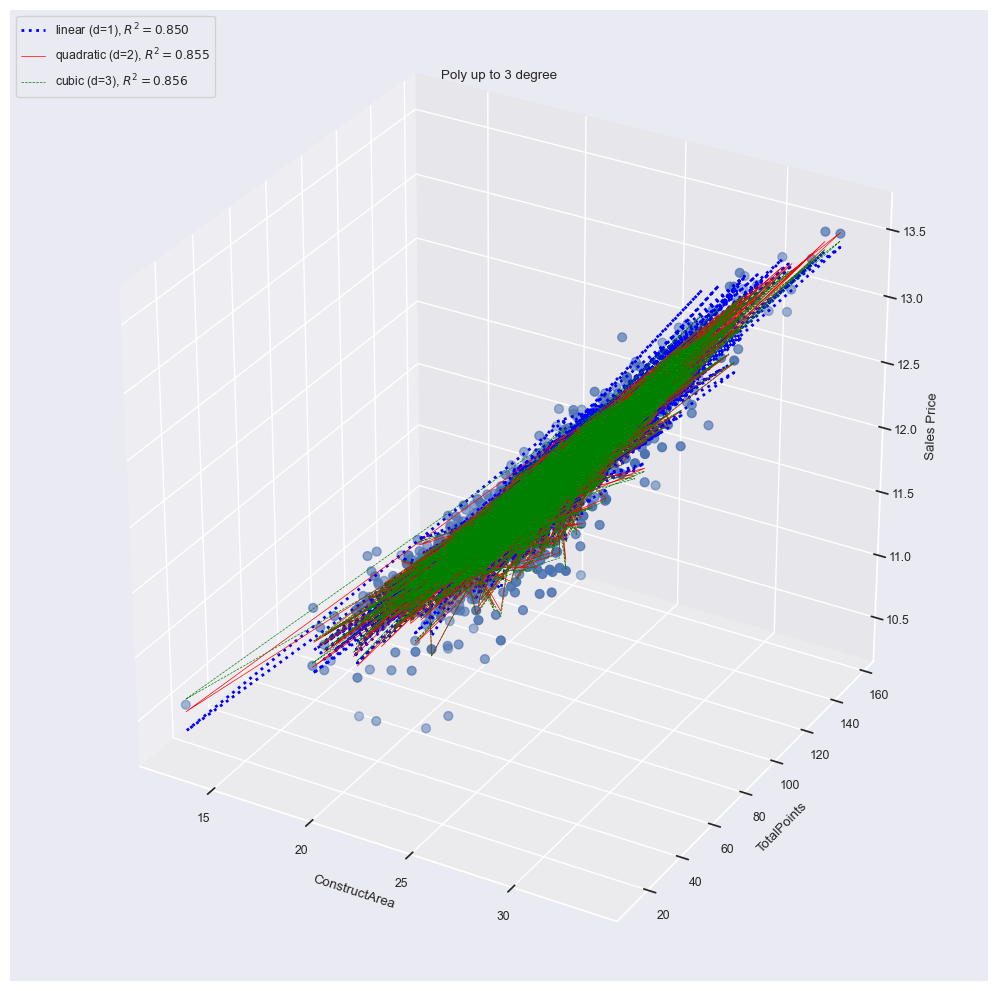

In [339]:
X = data.loc[:, ['ConstructArea', 'TotalPoints']]
poly(X, y_train)

Results:
Linear: 0.8634252649536047
Quadratic: 0.8695856653598286
Cubic: 0.8723029664756625
Fourth: 0.8768214460558348
Fifth: 0.8838552767699868


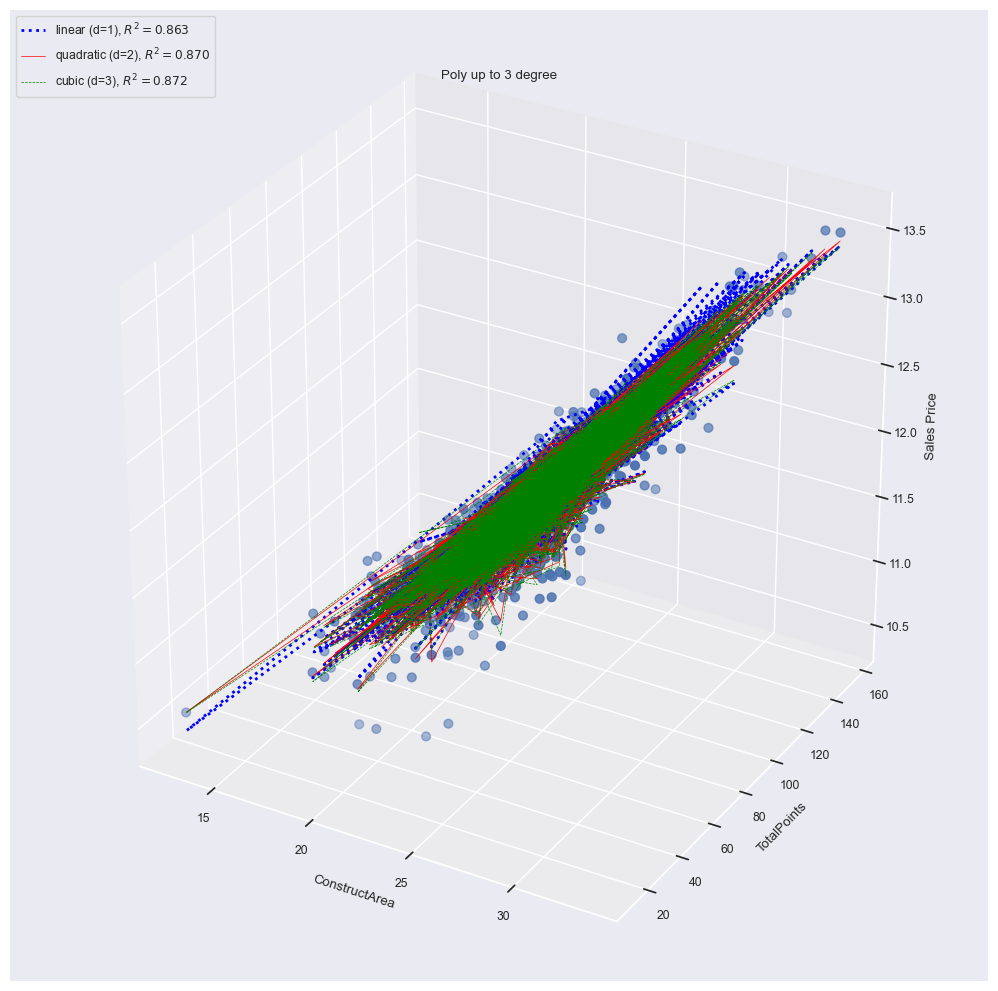

In [340]:
X= data.loc[:, ['ConstructArea', 'TotalPoints', 'LotAreaMultSlope',  'GarageArea_x_Car']]
poly(X, y_train)

In [341]:
##Se selecciona el último mix en tercer grado dado que da el mayor R2 (a pesar de que no es tan significativo lo que se gana respecto de
#la combinación lineal de los 4). Se selecciona el tercer grado debido a que la literatura indica que un mayor grado tiende a overfit

In [342]:
##CREACION DE POLYNOMIAL FEATURES Y AGREGACIÓN AL DATASET

"""Generamos ahora los polynomial features en grado 3 con el mix de los 4 features seleccionados
y los agregamos al dataset"""

poly_cols = ['ConstructArea', 'TotalPoints', 'LotAreaMultSlope',  'GarageArea_x_Car']
pf = PolynomialFeatures(degree= 3, interaction_only= False, include_bias= False) #instaciamos
res= pf.fit_transform(all_data.loc[:, poly_cols]) #Se crearon 30 nuevos features a partir de los 4 del mix

#Ahora corresponde darles nombres y acoplarlos al dataset
names = pf.get_feature_names(poly_cols) #genera una lista con los nombres de los features creados

#Nos deshacemos de los espacios en blanco que aparecen en los nombres y los reemplazamos por _ 
target_feature_names = [f.replace(" ", "_") for f in names]

#Creo dataframe con los nuevos feats y sus nombres
new_poly_features = pd.DataFrame(data = res, columns= target_feature_names, index = all_data.index)

#Eliminamos los features madres para que no se repitan en el dataset

new_poly_features.drop(poly_cols, axis = 1, inplace = True)

#Acople final

all_data = pd.concat([all_data, new_poly_features], axis = 1)





In [343]:
####NEW SHAPE OF DATASET AFTER POLYNOMIAL FEATURE CREATION
all_data.shape

(2908, 256)